## Проект: Обучение с учителем: качество модели

# Название проекта: «В один клик» - активность постоянных клиентов

**Цель проекта: На основе моделей машинного обучения предложить рекомендации по удержанию постоянных клиентов с помощью персонализированных предложений.**

**Описание проекта:**

**Шаг 0. Иморт библиотек, классов.**

**Шаг 1. Загрузка данных**

Загружены 4 файла. Разделители в первых трех ",", в последнем ";".
Данные в файлах соответствуют описанию.

**Шаг 2. Предобработка данных**

* Преобразованы названия столбцов (приведены к единому регистру, латинская раскладка).
* Проверено наличие дубликатов:
    * В файле market_money удалены 5 явных дубликатов.
* Проверены пропуски (не выявлены).
* Типы данных корректные.
* Исправлены ошибочные значения в текстовых категориях.

Для удобства работы текстовые данные переведены на латиницу.

**Шаг 3. Исследовательский анализ данных**

* Рассмотрены описания числовых признаков.
* Построены гистограммы распределения числовых признаков.
* Построены диаграммы размаха числовых признаков.
* Обработано аномально высокое значение в файле market_money - выручка текущего месяца.
* Выбросы сохранены, чтобы избежаь потери данных.
* Построены графики по категориальным признакам.
* Исследованы взаимосвязи числовых и категориальных признаков.

**Шаг 4. Объединение таблиц**

* Объеденены файлы: market_file, market_money, market_time.
* Три периода: current_month, previous_month, pre-previous_month добавлены как отдельные столбцы для значений выручки и current_month, previous_month - для значений времени на сайте.
* Клиенты с покупательской активностью не менее трёх месяцев: которые что-либо покупали в этот период - это все клиенты из нашей базы данных. Оставляем все 1300 записей.

**Шаг 5. Корреляционный анализ**

* Рассмотрены зависимости числовых и категориальных признаков.
* Построены матрицы корреляции: Пирсона, Спирмана и Фи.
* Построены матрицы корреляций Фи для 2-х категорий целевого признака. 
* Построены диаграммы рассеяния числовых признаков, с разбивкой по целевому.
* Рассмотрено изменение корреляций при добавлении нового признака: промо-покупки категориальные. (склонность к мультиколлинеарности входящих признаков снизилась.).

**Шаг 6. Использование пайплайнов**

Создан пайплайн (!!!)
С использованием пайплайна, гиперпараметров и RandomizedSearcgCV найдена лучшая модель.

**Шаг 7. Анализ важности признаков**

* Рассмотрена важность признаков для лучшей модели
* Построен график важности с помощью метода SHAP
* Проведен анализ важности признаков

**Шаг 8. Сегментация покупателей**

* Добавлены данные о прибыльности покупателей.
* Изучены взаимосвязи прибыли и других признаков
* Выполнена сегментация покупателей (опять очень много графиков)
* Сделайны предложения по работе с сегментом для увеличения покупательской активности.

**Шаг 9. Общий вывод**



## Шаг 0. Импорт библиотек

In [1]:
!pip install imbalanced-learn -q
!pip install optuna -q
!pip install phik -q
!pip install shap -q
!pip install mlxtend -q

In [2]:
import math
import phik
import shap
import random
import sklearn
import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as st
import plotly.express as px
import statsmodels.api as sm

In [3]:
from statsmodels.graphics.gofplots import qqplot
from sklearn.feature_selection import f_classif, mutual_info_classif
from imblearn.over_sampling import RandomOverSampler, SMOTE, SMOTENC, ADASYN
from sklearn.linear_model import LogisticRegression, LinearRegression
from optuna.integration import OptunaSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import (accuracy_score, confusion_matrix, r2_score, precision_score, recall_score, 
                             roc_auc_score, f1_score, make_scorer, mean_squared_error, mean_absolute_error)
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeClassifier, plot_tree, export_text
from sklearn.svm import SVC
from matplotlib import pyplot as plt
from optuna import distributions, visualization
from imblearn import under_sampling, over_sampling
from scipy.stats import lognorm, shapiro, normaltest, anderson, uniform, pearsonr
from phik.report import plot_correlation_matrix
from sklearn.dummy import DummyClassifier
from sklearn.compose import ColumnTransformer
from sklearn.datasets import make_classification
from sklearn.multiclass import OneVsRestClassifier
from sklearn.inspection import permutation_importance
from sklearn.preprocessing import (OneHotEncoder, OrdinalEncoder, LabelEncoder,
                                   StandardScaler, MinMaxScaler, RobustScaler, PowerTransformer, PolynomialFeatures)
from scipy.spatial.distance import (cosine, euclidean)
from sklearn.model_selection import (train_test_split, KFold, StratifiedKFold, cross_val_score,
                                     GridSearchCV, RandomizedSearchCV)

In [4]:
from sklearn.utils.class_weight import compute_class_weight
from sklearn.feature_selection import SelectKBest
from imblearn.under_sampling import RandomUnderSampler
from sklearn.ensemble import RandomForestClassifier
from imblearn.combine import SMOTETomek
from mlxtend.plotting import plot_decision_regions
from itertools import combinations
from phik import phik_matrix
import matplotlib.colors as colors

In [5]:
# Определим random_state и test_size

RANDOM_STATE = 42
TEST_SIZE = 0.25

import warnings
warnings.filterwarnings('ignore', category=UserWarning, module='openpyxl')
warnmings.simplefilter(action='ignore', category=FutureWarning)

In [6]:
# Зададим отображение всех колонок

pd.set_option("display.max.columns", None)

In [7]:
# Зададим отображение 2-х десятичных знаков

pd.options.display.float_format = '{:.2f}'.format

## Шаг 1. Загрузка данных

После первой загрузки оказалось, что разделитель в первых трех файлах ",", а не ";". Исправлено.

In [8]:
# Загружаем последовательно 4 файла, с нужным разделителем

market_file = pd.read_csv('https://code.s3.yandex.net/datasets/market_file.csv', sep=',')
market_money = pd.read_csv('https://code.s3.yandex.net/datasets/market_money.csv', sep=',')
market_time = pd.read_csv('https://code.s3.yandex.net/datasets/market_time.csv', sep=',')
money = pd.read_csv('https://code.s3.yandex.net/datasets/money.csv', sep=';')

Проверим первые 5 строк каждого файла:

In [9]:
market_file.head()

,id,Покупательская активность,Тип сервиса,Разрешить сообщать,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Популярная_категория,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,Ошибка_сервиса,Страниц_за_визит
0,215348,Снизилась,премиум,да,3.40,5,121,0.00,Товары для детей,6,2,1,5
1,215349,Снизилась,премиум,да,4.40,4,819,0.75,Товары для детей,4,4,2,5
2,215350,Снизилась,стандартт,нет,4.90,3,539,0.14,Домашний текстиль,5,2,1,5
3,215351,Снизилась,стандартт,да,3.20,5,896,0.99,Товары для детей,5,0,6,4
4,215352,Снизилась,стандартт,нет,5.10,3,1064,0.94,Товары для детей,3,2,3,2


In [10]:
market_money.head()

,id,Период,Выручка
0,215348,препредыдущий_месяц,0.00
1,215348,текущий_месяц,3293.10
2,215348,предыдущий_месяц,0.00
3,215349,препредыдущий_месяц,4472.00
4,215349,текущий_месяц,4971.60


In [11]:
market_time.head()

,id,Период,минут
0,215348,текущий_месяц,14
1,215348,предыдцщий_месяц,13
2,215349,текущий_месяц,10
3,215349,предыдцщий_месяц,12
4,215350,текущий_месяц,13


In [12]:
money.head()

,id,Прибыль
0,215348,"0,98"
1,215349,"4,16"
2,215350,"3,13"
3,215351,"4,87"
4,215352,"4,21"


**Вывод:**

Данные в файлах соответствуют описанию.

## Шаг 2. Предобработка данных

Пройдем последовательно по каждому файлу. При этом будем изучать следующее:

1. Выведем общую информарцию о файле.
2. Переведем названия колонок в "Змеиный регистр" на латинице.
3. Проверим данные в каждой колонке: нет ли задвоений, не правильно написанных категорий и проч.
4. Проверим наличие пропусков, обработаем при наличии таковых.
5. Проверим наличие явных и неявных дубликатов, обработаем, при наличии.
6. Проверим типы данных в файле, внесем изменения при необходимости.

In [13]:
market_file.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   1300 non-null   int64  
 1   Покупательская активность            1300 non-null   object 
 2   Тип сервиса                          1300 non-null   object 
 3   Разрешить сообщать                   1300 non-null   object 
 4   Маркет_актив_6_мес                   1300 non-null   float64
 5   Маркет_актив_тек_мес                 1300 non-null   int64  
 6   Длительность                         1300 non-null   int64  
 7   Акционные_покупки                    1300 non-null   float64
 8   Популярная_категория                 1300 non-null   object 
 9   Средний_просмотр_категорий_за_визит  1300 non-null   int64  
 10  Неоплаченные_продукты_штук_квартал   1300 non-null   int64  
 11  Ошибка_сервиса                

В данном файле нет пропусков, типы данных соответствуют содержимому.

Поменяем названия колонок.

In [14]:
# Выведем текущий список колонок

market_file.columns

Index(['id', 'Покупательская активность', 'Тип сервиса', 'Разрешить сообщать',
       'Маркет_актив_6_мес', 'Маркет_актив_тек_мес', 'Длительность',
       'Акционные_покупки', 'Популярная_категория',
       'Средний_просмотр_категорий_за_визит',
       'Неоплаченные_продукты_штук_квартал', 'Ошибка_сервиса',
       'Страниц_за_визит'],
      dtype='object')

In [15]:
# Приведем их к нужному виду

market_file.columns = ['id', 'consumer_activity', 'service_type', 'allow_info',
       'avg_market_activity_6_months', 'market_activity_current_month', 'duration',
       'promotional_purchases', 'popular_category',
       'avg_category_view_per_visit',
       'unpaid_products_per_quarter', 'service_mistake',
       'pages_per_visit']

In [16]:
# Проверим результат

market_file.head()

,id,consumer_activity,service_type,allow_info,avg_market_activity_6_months,market_activity_current_month,duration,promotional_purchases,popular_category,avg_category_view_per_visit,unpaid_products_per_quarter,service_mistake,pages_per_visit
0,215348,Снизилась,премиум,да,3.40,5,121,0.00,Товары для детей,6,2,1,5
1,215349,Снизилась,премиум,да,4.40,4,819,0.75,Товары для детей,4,4,2,5
2,215350,Снизилась,стандартт,нет,4.90,3,539,0.14,Домашний текстиль,5,2,1,5
3,215351,Снизилась,стандартт,да,3.20,5,896,0.99,Товары для детей,5,0,6,4
4,215352,Снизилась,стандартт,нет,5.10,3,1064,0.94,Товары для детей,3,2,3,2


In [17]:
# Проверим значения в текстовых колонках

columns = ['consumer_activity', 'service_type', 'allow_info', 'popular_category']
for col in columns:
    print(col, '\n\n', market_file[col].value_counts(), '\n')

consumer_activity 

 Прежний уровень    802
Снизилась          498
Name: consumer_activity, dtype: int64 

service_type 

 стандарт     914
премиум      376
стандартт     10
Name: service_type, dtype: int64 

allow_info 

 да     962
нет    338
Name: allow_info, dtype: int64 

popular_category 

 Товары для детей                        330
Домашний текстиль                       251
Косметика и аксесуары                   223
Техника для красоты и здоровья          184
Мелкая бытовая техника и электроника    174
Кухонная посуда                         138
Name: popular_category, dtype: int64 



Есть некорректное значение в колонке service_type = "стандартт".

Текстовых данных у нас не много. Переведем все на латиницу - так будет удобнее обрабатывать данные, чтобы не переключать постоянно раскладку.

1. Меняем названия
2. Проверяем, что распределение данных не изменилось

In [18]:
market_file.consumer_activity = \
market_file.consumer_activity.replace({'Прежний уровень':'previous_level','Снизилась':'decreased'})

In [19]:
market_file.consumer_activity.value_counts()

previous_level    802
decreased         498
Name: consumer_activity, dtype: int64

In [20]:
market_file.service_type = market_file.service_type.replace(
    {'стандарт':'standard', 'стандартт':'standard','премиум':'premium'}
)

In [21]:
market_file.service_type.value_counts()

standard    924
premium     376
Name: service_type, dtype: int64

In [22]:
market_file.allow_info = market_file.allow_info.replace({'да':'yes', 'нет':'no'})

In [23]:
market_file.allow_info.value_counts()

yes    962
no     338
Name: allow_info, dtype: int64

In [24]:
market_file.popular_category = \
market_file.popular_category.replace({
    'Товары для детей':'children_products',
    'Домашний текстиль':'home_textiles',
    'Косметика и аксесуары':'cosmetics+accessories',
    'Техника для красоты и здоровья':'beauty+health_equipment',
    'Кухонная посуда':'kitchen_utensils',
    'Мелкая бытовая техника и электроника':'small_household_appliances+electronics'
})

In [25]:
market_file.popular_category.unique().tolist()

['children_products',
 'home_textiles',
 'cosmetics+accessories',
 'beauty+health_equipment',
 'kitchen_utensils',
 'small_household_appliances+electronics']

In [26]:
# Проверим наличие полных дубликатов

market_file.duplicated().sum()

0

Дубликатов нет.

Перейдем ко второму файлу.

In [27]:
market_money.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       3900 non-null   int64  
 1   Период   3900 non-null   object 
 2   Выручка  3900 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 91.5+ KB


Пропусков нет, типы данных соответствуют значениям.

In [28]:
# Переименуем колонки (латиница)

market_money.columns = ['id', 'period', 'revenue']

In [29]:
# Проверим

market_money.head()

,id,period,revenue
0,215348,препредыдущий_месяц,0.00
1,215348,текущий_месяц,3293.10
2,215348,предыдущий_месяц,0.00
3,215349,препредыдущий_месяц,4472.00
4,215349,текущий_месяц,4971.60


In [30]:
# Проверим значения в колонке period

market_money.period.value_counts()

предыдущий_месяц       1300
препредыдущий_месяц    1300
текущий_месяц          1300
Name: period, dtype: int64

In [31]:
# Переведем текст на латиницу

market_money.period = market_money.period.replace(
    {'текущий_месяц':'current_month','предыдущий_месяц':'previous_month', 'препредыдущий_месяц':'pre_previous_month'}
)

In [32]:
# Проверим

market_money.period.value_counts()

previous_month        1300
pre_previous_month    1300
current_month         1300
Name: period, dtype: int64

In [33]:
# Проверим наличие полных дубликатов

market_money.duplicated().sum()

0

Дубликатов нет.

Рассмотрим третий файл

In [34]:
market_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2600 entries, 0 to 2599
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      2600 non-null   int64 
 1   Период  2600 non-null   object
 2   минут   2600 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 61.1+ KB


Пропусков нет, типы данных соответствуют значениям.

In [35]:
# Переименуем колонки (латиница)

market_time.columns = ['id', 'period', 'minutes']

In [36]:
# Проверим

market_time.head()

,id,period,minutes
0,215348,текущий_месяц,14
1,215348,предыдцщий_месяц,13
2,215349,текущий_месяц,10
3,215349,предыдцщий_месяц,12
4,215350,текущий_месяц,13


In [37]:
# Проверим значения

market_time.period.value_counts()

текущий_месяц       1300
предыдцщий_месяц    1300
Name: period, dtype: int64

Одно значение не корректно.

In [38]:
# Переведем текст на латиницу

market_time.period = market_time.period.replace(
    {'предыдцщий_месяц':'previous_month', 'текущий_месяц':'current_month'}
)

In [39]:
# Проверим значения

market_time.period.value_counts()

previous_month    1300
current_month     1300
Name: period, dtype: int64

In [40]:
# Проверим наличие полных дубликатов

market_time.duplicated().sum()

0

Дубликатов нет.

Остался последний файл.

In [41]:
# Общие данные

money.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   id       1300 non-null   int64 
 1   Прибыль  1300 non-null   object
dtypes: int64(1), object(1)
memory usage: 20.4+ KB


Пропусков нет.

Нужно переименовать колонки и поменять запятую на точку - разделитель.

In [42]:
money.columns = ['id', 'profit']

In [43]:
money.profit = money.profit.astype(str).str.replace(",",".").astype(float)

In [44]:
money.head()

,id,profit
0,215348,0.98
1,215349,4.16
2,215350,3.13
3,215351,4.87
4,215352,4.21


**Вывод:**

Предобработка данных завершена. 

Пропусков в файлах нет. Типы данных корректные.
В файле market_money удалены 5 явных дубликатов.

Названия столбцов приведены к единому стилю, текстовые значения переведены на латиницу, исправлены некорректные значения.

## Шаг 3. Исследовательский анализ данных

### Файл 1: Основные данные

#### Числовые признаки

Проведем последовательно анализ данных.

1. Выведем общее описание числовых признаков
2. Построим графики распределения признаков и ящик с усами, определим нормальные значения, аномалии и выбросы.

In [45]:
market_file[['avg_market_activity_6_months', 'market_activity_current_month', 'duration', 'promotional_purchases', \
             'avg_category_view_per_visit', 'unpaid_products_per_quarter', 'service_mistake', 'pages_per_visit']].describe()

,avg_market_activity_6_months,market_activity_current_month,duration,promotional_purchases,avg_category_view_per_visit,unpaid_products_per_quarter,service_mistake,pages_per_visit
count,1300.00,1300.00,1300.00,1300.00,1300.00,1300.00,1300.00,1300.00
mean,4.25,4.01,601.90,0.32,3.27,2.84,4.19,8.18
std,1.01,0.70,249.86,0.25,1.36,1.97,1.96,3.98
min,0.90,3.00,110.00,0.00,1.00,0.00,0.00,1.00
25%,3.70,4.00,405.50,0.17,2.00,1.00,3.00,5.00
50%,4.20,4.00,606.00,0.24,3.00,3.00,4.00,8.00
75%,4.90,4.00,806.00,0.30,4.00,4.00,6.00,11.00
max,6.60,5.00,1079.00,0.99,6.00,10.00,9.00,20.00


Маркетинговая активность в последний месяц немного снизилась по сравнению с предыдущими 6 мес. в среднем с 4,25 до 4,01. 
При этом маркетинговая активность стала более стабильной. В предыдущие 6 мес. разброс значений был от 0,9 - минимальная, 3,7-4,2-4,9 для 25-50-75% пользователей и 6,6 - макисмальная активность.
В текущем месяце минимальная маркетинговая активность составиола 3, для 25-50-75% - 4, и максимальная 5.

В среднем покупатели зарегистрированы на сайте около 1,6 лет. Основная часть (25-75%) от 1 года до 2,2-х лет. Мин. период = 3 месяца, максимальный = почти 3 года.

Среднемесячная доля акционных покупок в общем числе покупок составляет от 17 до 30% для основной части покупателей. Средний показатель = 32%. Минимальный = 0, а максимальный - 99%. Можно предположить, что доля акционных покупок возрастает с ростом времени регистрации на сайте (посмотрим, так ли это, в дальнейшем).

За один визит в теч.последнего месяца покупатели рассмотрели в среднем 3,27 категории товаров. Основная доля покупателей (25-75%) просматривает соотв. от 2 до 4-х категорий. Минимальное число просмотренных категорий = 1, максимальное = 6.

Срдений показатель неоплаченных товаров за последний квартал составляет 2,84 шт. Для основной части покупателей - от 1 до 4-х шт. Наибольшее число неоплаченных товаров = 10.

Число сбоев при посещении сайта в среднем составлят 4,19. 25-50-75%  - соотв. = 3-4-6 сбоев. Наибольшее число сбоев = 9.

Среднее количество просмотренных покупателем страниц за последнй квартал = 8,18. 25-50-75% - соотв. = 5-8-11 страниц. Максимальный показатель = 20 страниц.

На первый взгляд, не видно аномальных значений.

Детальнее это покажут гистограммы распределения и ящик с усами.

Построим их для числовых признаков.

In [46]:
# Предварительно сделаем 2 вспомогательных файла по типу сервиса: стандарт и премиум

market_file_st = market_file[market_file['service_type']=='standard']
market_file_pr = market_file[market_file['service_type']=='premium']

In [47]:
# Создадим функцию для подписей графика и осей (пригодится позже)

def plot_lables(title, x, y):
    axs.set_title(title, fontsize=14)
    axs.set_xlabel(x, fontsize=12)
    axs.set_ylabel(y, fontsize=12)

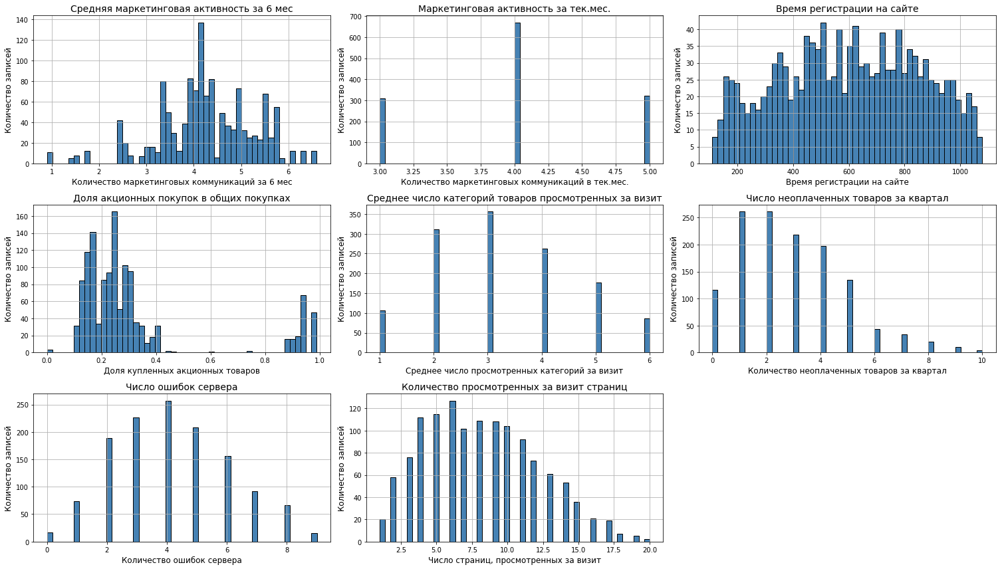

In [48]:
# Названия графиков

plot_titles = ['Средняя маркетинговая активность за 6 мес', 'Маркетинговая активность за тек.мес.', \
               'Время регистрации на сайте', 'Доля акционных покупок в общих покупках', \
               'Среднее число категорий товаров просмотренных за визит', \
               'Число неоплаченных товаров за квартал', 'Число ошибок сервера', 'Количество просмотренных за визит страниц']

# Подписи для осей X и Y

x_labels = ['Количество маркетинговых коммуникаций за 6 мес', 'Количество маркетинговых коммуникаций в тек.мес.', \
            'Время регистрации на сайте', 'Доля купленных акционных товаров', 'Среднее число просмотренных категорий за визит',\
            'Количество неоплаченных товаров за квартал', 'Количество ошибок сервера', 'Число страниц, просмотренных за визит']

y_labels = ['Количество записей']*8

# Используем цикл для построения гистограмм каждого признака

fig, axs = plt.subplots(3, 3, figsize=(21, 12))
axs = axs.flatten()

features = ['avg_market_activity_6_months', 'market_activity_current_month', 'duration', \
              'promotional_purchases', 'avg_category_view_per_visit', 'unpaid_products_per_quarter', \
              'service_mistake', 'pages_per_visit']

for i, feature in enumerate(features):
    axs[i].hist(market_file[feature], bins=50, color='steelblue', edgecolor='black')
    axs[i].set_title(plot_titles[i], fontsize=14)
    axs[i].set_xlabel(x_labels[i], fontsize=12)
    axs[i].set_ylabel(y_labels[i], fontsize=12)
    axs[i].grid(True)

plt.box(False)
plt.xticks([])
plt.yticks([])

plt.tight_layout()
plt.show();

Отдельно построим распределение категориальных признаков

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data

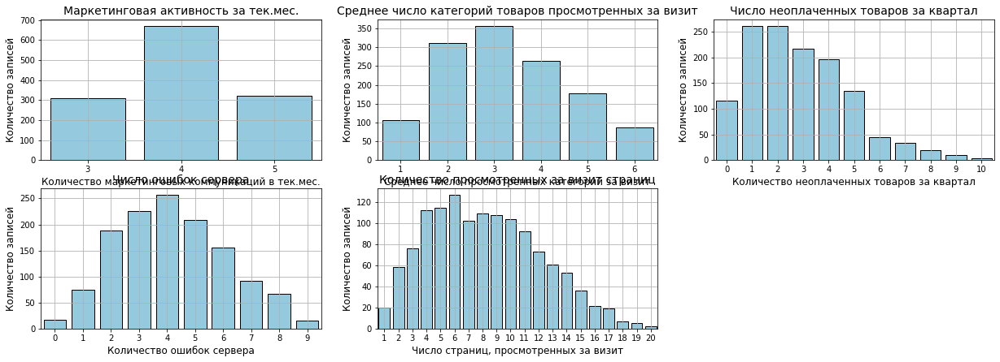

In [49]:
# Названия графиков

plot_titles = ['Маркетинговая активность за тек.мес.', 'Среднее число категорий товаров просмотренных за визит', \
               'Число неоплаченных товаров за квартал', 'Число ошибок сервера', 'Количество просмотренных за визит страниц']

# Подписи для осей X и Y

x_labels = ['Количество маркетинговых коммуникаций в тек.мес.', 'Среднее число просмотренных категорий за визит',\
            'Количество неоплаченных товаров за квартал', 'Количество ошибок сервера', 'Число страниц, просмотренных за визит']

y_labels = ['Количество записей']*5

# Используем цикл для построения гистограмм каждого признака

fig, axs = plt.subplots(2, 3, figsize=(21, 10))
axs = axs.flatten()

features = ['market_activity_current_month', 'avg_category_view_per_visit', 'unpaid_products_per_quarter', \
              'service_mistake', 'pages_per_visit']

for i, feature in enumerate(features):
    sns.countplot(market_file[feature], color='SkyBlue', edgecolor='black', ax=axs[i])
    axs[i].set_title(plot_titles[i], fontsize=14)
    axs[i].set_xlabel(x_labels[i], fontsize=12)
    axs[i].set_ylabel(y_labels[i], fontsize=12)
    axs[i].grid(True)

plt.box(False)
plt.xticks([])
plt.yticks([])

plt.show();

Из категориальных признаков визуально выглядит близко к нормальному распределение ошибок сервера - детальнее посмотрим его на графике ниже.

При первом рассмотрении нормальным выглядит распределение ошибок сервера.

Смещение имеют среднее число просмотренных категорий за визит, число просмотренных за визит страниц, неоплаченные товары.
Маркетинговая активность текущего месяца - это всего 3 показателя.
Средняя маркетинговая активность в целом похожа на нормальную.
Время регистрации на сайте имеет некоторые всплески.

Покупки акционных товаров разделились на 2 группы: от 10 до 40 % и от 90 до 99%.

Далее рассмотрим признаки более детально.

Чтобы визуально оценить, нормально ли распределен признак, построим гисторамму распределения и гистограмму квантиль-квантиль.

Для визуализации нормальных значений, а также аномалий и выбросов, воспользуемся ящиком с усами.

Также для оценки распределения требуется рассчитать коэффициенты: ассиметрии, Шапиро-Уилка, Д'Агостино, Андерсона-Дарлинга.

In [50]:
# Создадим функцию для построения гистограммы распределения признака, гистограммы квантиль-квантиль и ящика с усамми

def feature_hist_box (df, feature, x_title):
    fig, axes = plt.subplots(2,2, figsize=(18,11))
    fig.suptitle(f"Признак {feature}", size=16)
    
    sns.histplot(x=df[feature], ax=axes[0][0], kde=True, bins='auto');
    
    axes[0][0].set_title(f'Гистограмма распределения', fontsize=14)
    axes[0][0].set_xlabel(x_title, fontsize=12)
    axes[0][0].set_ylabel('Количество записей')
    
    qqplot(data=df[feature], ax=axes[0][1], line='s')
    axes[0][1].set_title(f'Гистограмма квантиль-квантиль', fontsize=14)
    axes[0][1].set_xlabel(x_title, fontsize=12)
    
    sns.boxplot(x=df[feature], ax=axes[1][0])
    axes[1][0].set_title('Диаграмма размаха', fontsize=14)
    axes[1][0].set_xlabel(x_title, fontsize=12)
      
    plt.box(False)
    plt.xticks([])
    plt.yticks([])
    
    fig.show()  
    
    print(f'Медиана признака = {np.median(df[feature])}')

In [51]:
# Создадим функцию для рассчета коэффициентов распределения признака

def feature_distribution(df, feature):
    print(f'Коэффициент асимметрии = {df[feature].skew()}', '\n')
    print(f'Тест Шапиро-Уилка = {shapiro(df[feature])}', '\n')
    #print(f'Тест Д Агостино = {normaltest(df[feature])}', '\n')
    #print(f'Тест Андерсона-Дарлинга = {anderson(df[feature])}')

Рассмотрим признак, который визуально похож на нормальное распределение - маркетинговая активность за 6 мес.

Медиана признака = 4.2


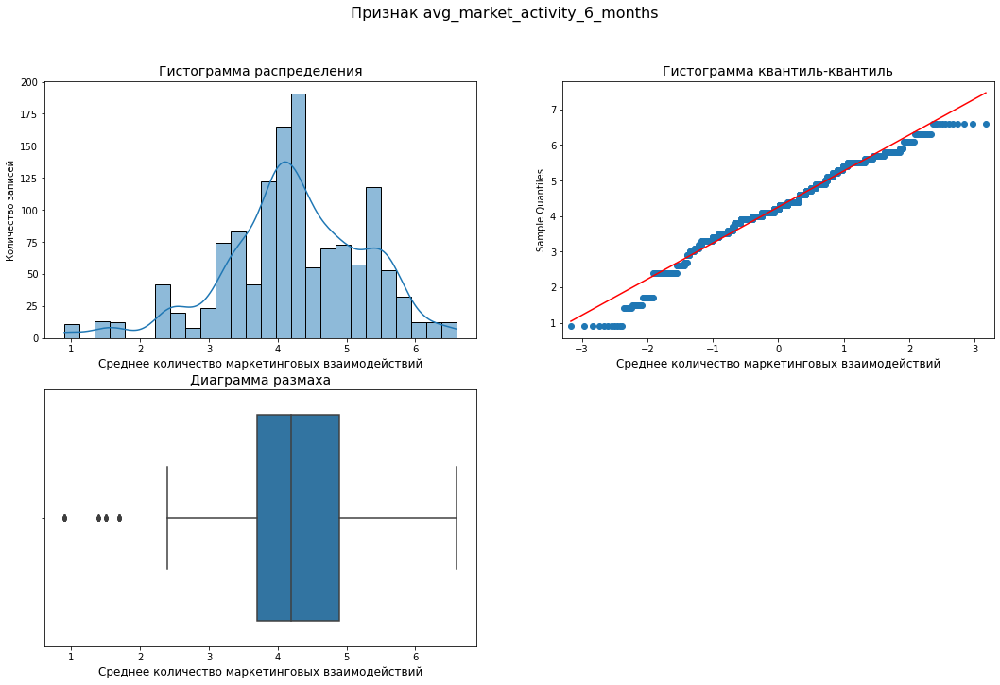

In [52]:
feature_hist_box(market_file, 'avg_market_activity_6_months', "Среднее количество маркетинговых взаимодействий")

In [53]:
feature_distribution(market_file, 'avg_market_activity_6_months')

Коэффициент асимметрии = -0.44478177556692217 

Тест Шапиро-Уилка = ShapiroResult(statistic=0.9779597520828247, pvalue=3.3620735319025985e-13) 



1. График не симметричен: больший вес в правой части (отрицат. коэффициент асимметрии).
2. Исходя из тестов Шапиро и Д'Агостино, у нас есть достаточно оснований, чтобы сказать, что данные выборки не имеют нормального распределения (значения p-value намного меньше стандартного порога значимости = 0,05).
3. Тест Андерсона-Дарлинга показывает, что результаты теста значимы на каждом уровне значимости, следовательно, у нас есть достаточно оснований, чтобы сказать, что данные выборки не распределены нормально.

Диаграмма размаха показывает значения ниже 2-х, как выбросы. Посмотрим, какие наблюдения попадают в эту группу и сколько их.

In [54]:
market_file.loc[market_file['avg_market_activity_6_months'] <= 2]['id'].count()

36

In [55]:
market_file.loc[market_file['avg_market_activity_6_months'] <= 2].pivot_table(
    index=['service_type', 'consumer_activity', 'duration'])

avg_category_view_per_visit  \
service_type consumer_activity duration                                
premium      decreased         335                                 2   
                               355                                 1   
                               468                                 1   
                               475                                 2   
                               541                                 2   
                               637                                 3   
                               645                                 3   
                               657                                 2   
                               684                                 3   
                               690                                 2   
                               704                                 1   
                               771                                 1   
                               788                                 1   
                               857                                 3   
standard     decreased         188                                 2   
                               212                                 2   
                               225                                 2   
                               298                                 6   
                               360                                 2   
                               377                                 3   
                               439                                 1   
                               449                                 3   
                               472                                 2   
                               488                                 5   
                               495                                 2   
                               550                                 4   
                               556                                 2   
                               624                                 1   
                               684                                 3   
                               728                                 2   
                               756                                 2   
                               788                                 3   
                               822                                 2   
                               839                                 3   
             previous_level    930                                 2   
                               932                                 3   

                                         avg_market_activity_6_months      id  \
service_type consumer_activity duration                                         
premium      decreased         335                               1.50  215543   
                               355                               1.40  215540   
                               468                               0.90  215601   
                               475                               1.50  215514   
                               541                               1.50  215521   
                               637                               1.70  215380   
                               645                               1.50  215395   
                               657                               0.90  215705   
                               684                               1.40  215654   
                               690                               0.90  215429   
                               704                               1.70  215620   
                               771                               1.70  215403   
                               788                               1.50  215538   
                               857                               1.40  215409   
standard

Мы видим, что данные довольно разнообразные. Учитывая также небольшое число наблюдений, удалять их не следует.

feature_hist_box(market_file, 'market_activity_current_month', "Количество маркетинговых взаимодействий за текущий месяц")

feature_distribution(market_file, 'market_activity_current_month')

Здесь всего три категории данных, и это распределение нельзя назвать нормальным. 
Медиана признака, оно же нормальное значение (согласно диаграмме размаха) = 4 маркетинговых взаимодействия.

In [56]:
#Количество наблюдейний за пределами медианного значения

market_file.loc[(market_file['market_activity_current_month'] < 4)|\
                ((market_file['market_activity_current_month'] > 4))]['id'].count()

631

Медиана признака = 606.0


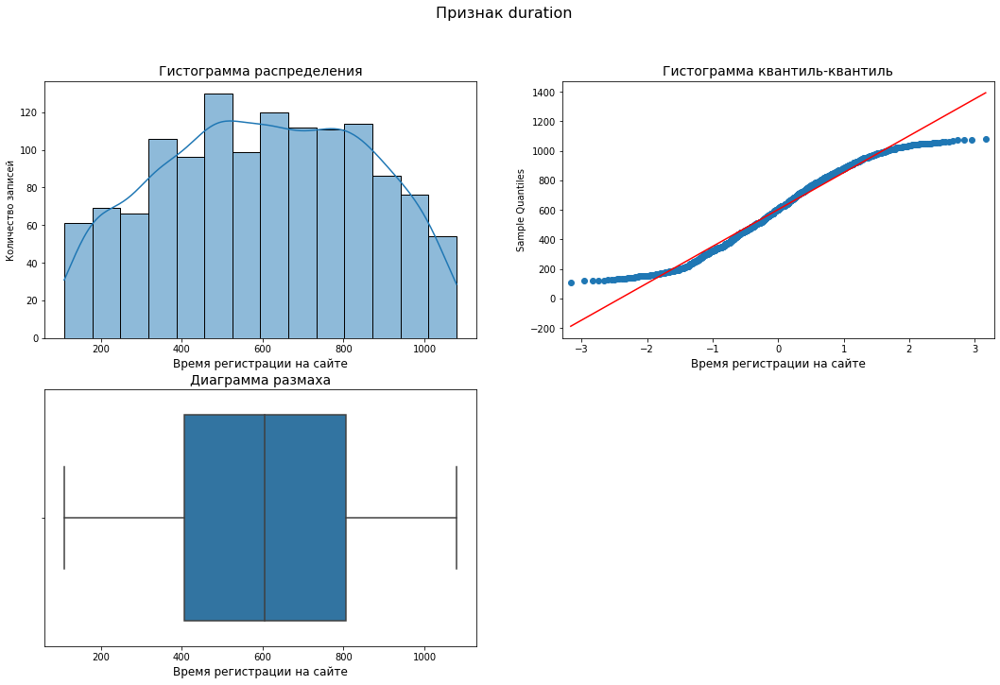

In [57]:
feature_hist_box(market_file, 'duration', "Время регистрации на сайте")

In [58]:
feature_distribution(market_file, 'duration')

Коэффициент асимметрии = -0.06281746123799078 

Тест Шапиро-Уилка = ShapiroResult(statistic=0.9726996421813965, pvalue=5.791480627183451e-15) 



Медианное значение = 606 дней ~ 1,7 лет. График распределения не является нормальным. Выбросов нет.

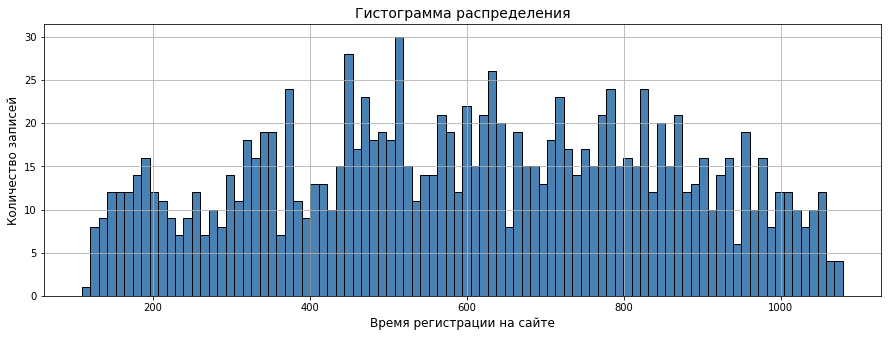

In [59]:
#Гистограмма при количестве групп = 90

fig, axs = plt.subplots(figsize=(15, 5))

plt.hist(market_file['duration'], bins = 90, color = 'steelblue', edgecolor = 'black')
plot_lables('Гистограмма распределения', 'Время регистрации на сайте', 'Количество записей')
axs.grid(True)
plt.show();

Здесь можно отметить некоторую цикличность прироста пользователей, от текущего момента до 1,7 лет (4 волны). Возможно, это связано с акциями или улучшениями сайта.

Медиана признака = 0.24


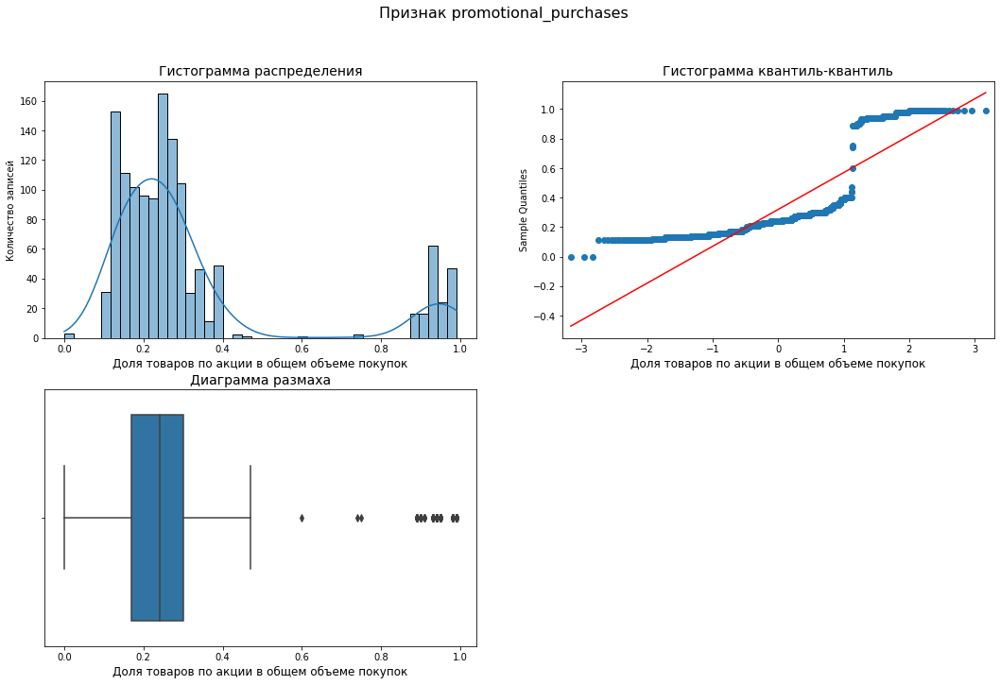

In [60]:
feature_hist_box(market_file, 'promotional_purchases', "Доля товаров по акции в общем объеме покупок")

In [61]:
feature_distribution(market_file, 'promotional_purchases')

Коэффициент асимметрии = 1.895392536331913 

Тест Шапиро-Уилка = ShapiroResult(statistic=0.6621266603469849, pvalue=5.605193857299268e-45) 



В целом данные не имеют нормального распределения. Но возможно, их стоит разделить на 2 или 3 группы.
Попробуем сначала взять границу = 0,6.

Правая часть графика: доля товаров по акции больше 60%.

Медиана признака = 0.94


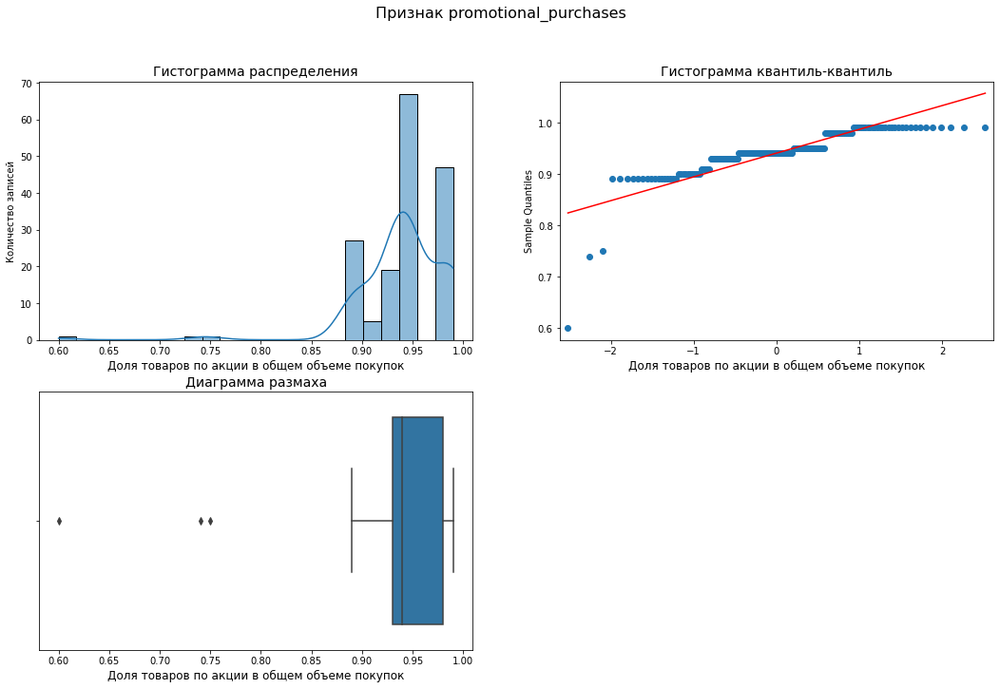

In [62]:
feature_hist_box(market_file.loc[market_file['promotional_purchases'] >= 0.6],\
                 'promotional_purchases', "Доля товаров по акции в общем объеме покупок")

In [63]:
feature_distribution(market_file.loc[market_file['promotional_purchases'] >= 0.6], 'promotional_purchases')

Коэффициент асимметрии = -3.197974256219489 

Тест Шапиро-Уилка = ShapiroResult(statistic=0.7237144708633423, pvalue=2.040964002891863e-16) 



In [64]:
# Посмотрим число выбросов для данной группы

market_file.loc[(market_file['promotional_purchases'] >= 0.6)&\
                ((market_file['promotional_purchases'] < 0.85))]['id'].count()

3

In [65]:
market_file.loc[(market_file['promotional_purchases'] >= 0.6)&\
                ((market_file['promotional_purchases'] < 0.85))]

,id,consumer_activity,service_type,allow_info,avg_market_activity_6_months,market_activity_current_month,duration,promotional_purchases,popular_category,avg_category_view_per_visit,unpaid_products_per_quarter,service_mistake,pages_per_visit
1,215349,decreased,premium,yes,4.40,4,819,0.75,children_products,4,4,2,5
14,215362,decreased,premium,yes,4.20,4,438,0.74,home_textiles,3,4,6,4
417,215765,previous_level,standard,no,3.90,4,388,0.60,cosmetics+accessories,4,0,4,8


Таких значений всего 3.

Пока мы не добавили полную информацию, удалять данные мы не будем. Примем во внимание данную особенность.

Если из рассматриваемой подгруппы убрать выбросы:

Медиана признака = 0.94


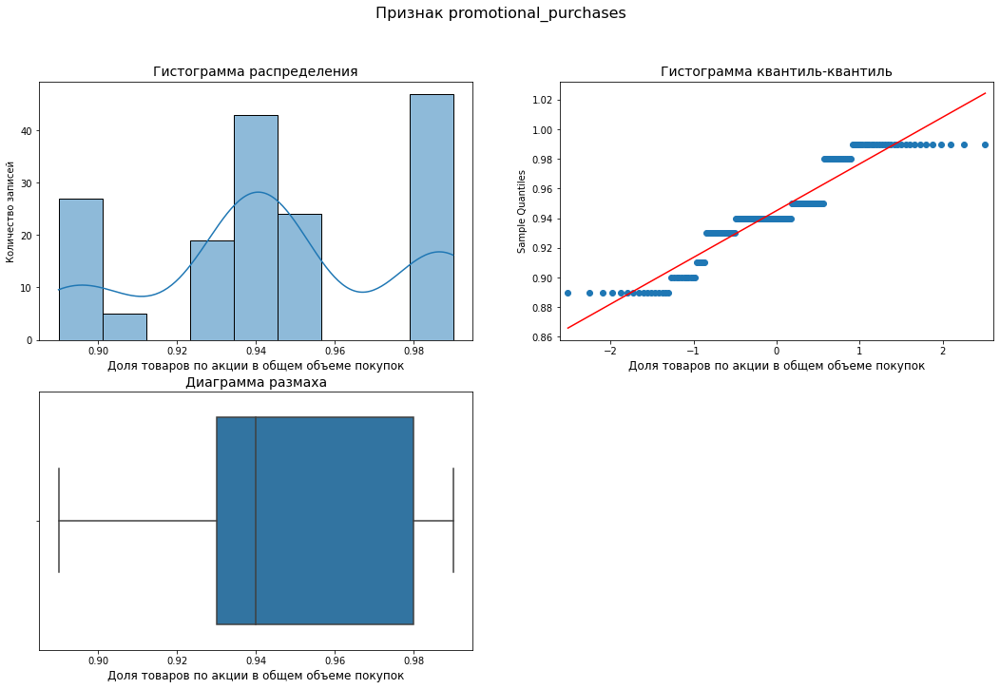

In [66]:
feature_hist_box(market_file.loc[market_file['promotional_purchases'] >= 0.85],\
                 'promotional_purchases', "Доля товаров по акции в общем объеме покупок")

In [67]:
feature_distribution(market_file.loc[market_file['promotional_purchases'] >= 0.85], 'promotional_purchases')

Коэффициент асимметрии = -0.102645949285157 

Тест Шапиро-Уилка = ShapiroResult(statistic=0.9006108045578003, pvalue=4.1119117000221195e-09) 



График не симметричен.
Но - можно отметить, что данные четко разделены на 3 группы: 0,89-0,91; 0,92-0,96; 0,97-0,99.

Рассмотрим теперь значения меньше 60% (левая часть основного графика)

Медиана признака = 0.23


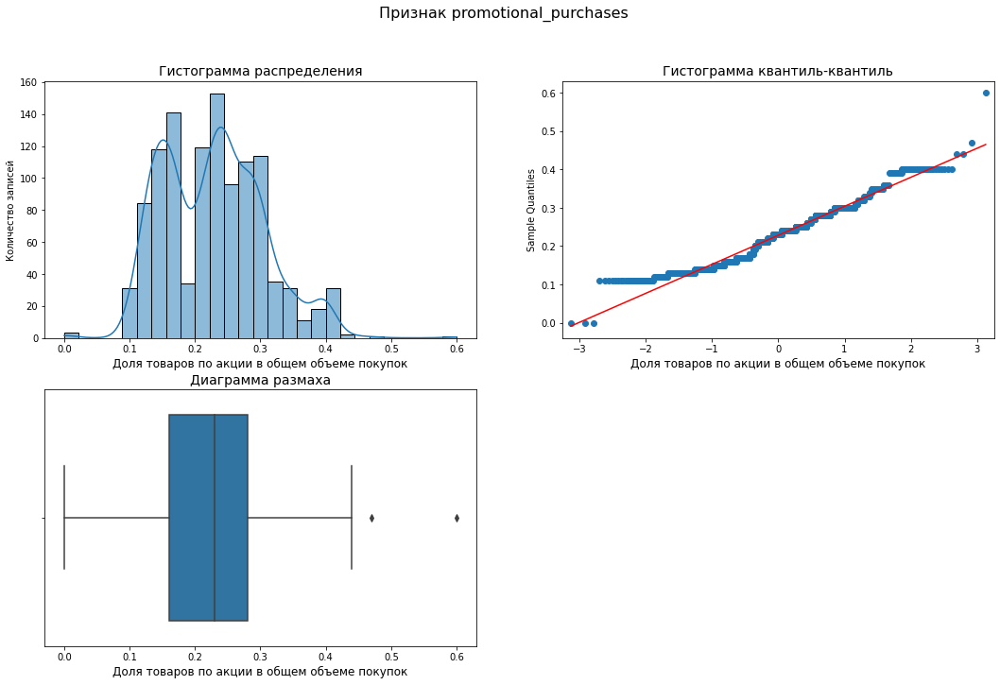

In [68]:
feature_hist_box(market_file.loc[market_file['promotional_purchases'] <= 0.6],\
                 'promotional_purchases', "Доля товаров по акции в общем объеме покупок")

In [69]:
feature_distribution(market_file.loc[market_file['promotional_purchases'] <= 0.6], 'promotional_purchases')

Коэффициент асимметрии = 0.4194432526752665 

Тест Шапиро-Уилка = ShapiroResult(statistic=0.9665061235427856, pvalue=1.6965104315943766e-15) 



Здесь, похоже, также можно выделить 2 подгруппы: до 0,2 и от 0,2.

Медиана признака = 0.15


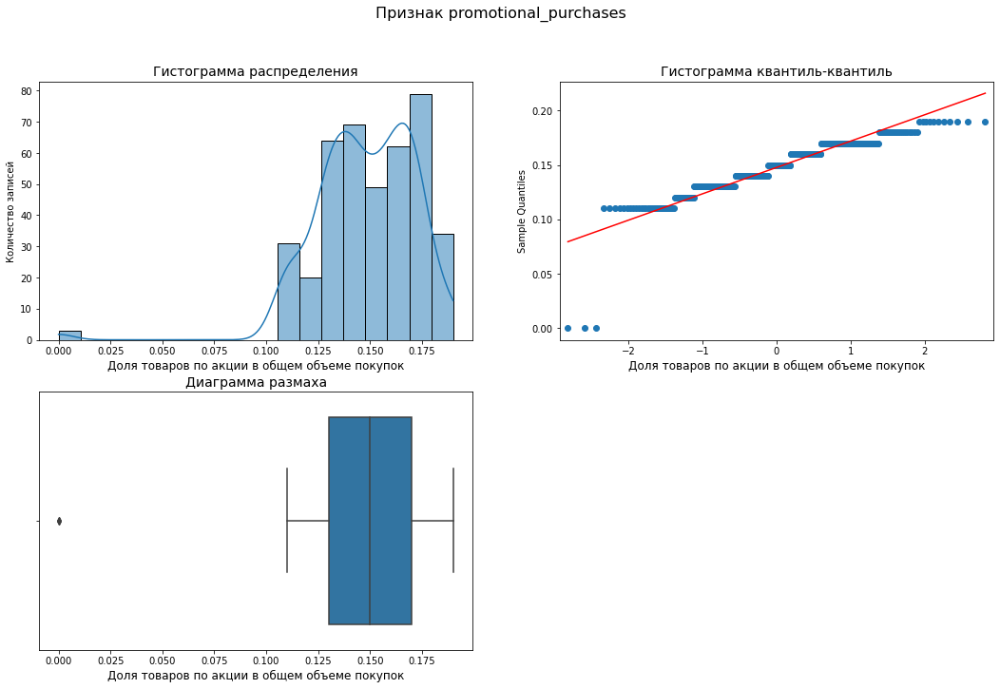

In [70]:
feature_hist_box(market_file.loc[market_file['promotional_purchases'] < 0.2],\
                 'promotional_purchases', "Доля товаров по акции в общем объеме покупок")

In [71]:
feature_distribution(market_file.loc[market_file['promotional_purchases'] < 0.2], 'promotional_purchases')

Коэффициент асимметрии = -1.639142642193763 

Тест Шапиро-Уилка = ShapiroResult(statistic=0.8738983273506165, pvalue=8.781676946385513e-18) 



Медиана признака = 0.26


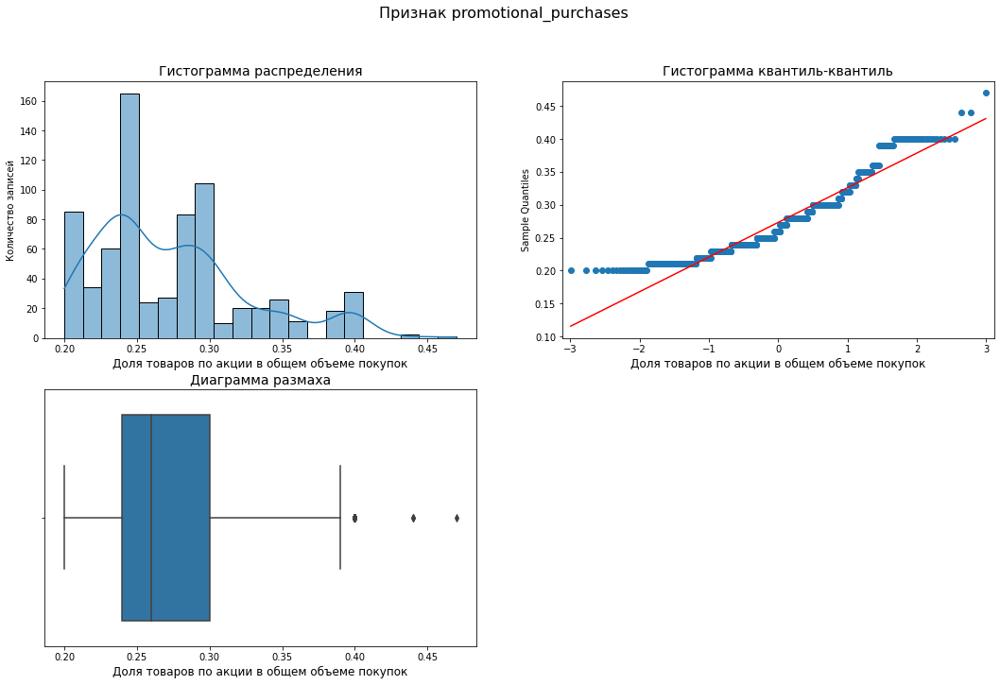

In [72]:
feature_hist_box(market_file.loc[(market_file['promotional_purchases'] >= 0.2)&(market_file['promotional_purchases'] <0.6)],\
                 'promotional_purchases', "Доля товаров по акции в общем объеме покупок")

In [73]:
feature_distribution(market_file.loc[(market_file['promotional_purchases'] >= 0.2)&\
                                     (market_file['promotional_purchases'] <0.6)], 'promotional_purchases')

Коэффициент асимметрии = 0.9300912323344428 

Тест Шапиро-Уилка = ShapiroResult(statistic=0.9173416495323181, pvalue=2.1001877938295264e-19) 



Посмотрим еще раз на общий график, с числом корзин = 100, для большей наглядности.

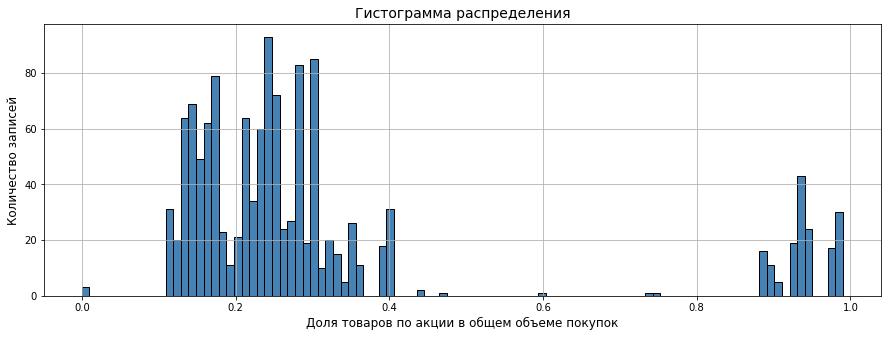

In [74]:
# Гистограмма при количестве групп = 100

fig, axs = plt.subplots(figsize=(15, 5))

plt.hist(market_file['promotional_purchases'], bins = 100, color = 'steelblue', edgecolor = 'black')
plot_lables('Гистограмма распределения', 'Доля товаров по акции в общем объеме покупок', 'Количество записей')
axs.grid(True)
plt.show();

In [75]:
# Выведем выбросы: доли меньше 0,1 и от 0,42 до 0,8

market_file.loc[(market_file['promotional_purchases'] < 0.1)|\
                ((market_file['promotional_purchases'] > 0.42)&(market_file['promotional_purchases'] <0.8))]

,id,consumer_activity,service_type,allow_info,avg_market_activity_6_months,market_activity_current_month,duration,promotional_purchases,popular_category,avg_category_view_per_visit,unpaid_products_per_quarter,service_mistake,pages_per_visit
0,215348,decreased,premium,yes,3.40,5,121,0.00,children_products,6,2,1,5
1,215349,decreased,premium,yes,4.40,4,819,0.75,children_products,4,4,2,5
9,215357,decreased,standard,yes,3.90,5,154,0.00,beauty+health_equipment,3,3,9,5
11,215359,decreased,standard,yes,4.60,5,110,0.00,home_textiles,4,2,4,2
14,215362,decreased,premium,yes,4.20,4,438,0.74,home_textiles,3,4,6,4
417,215765,previous_level,standard,no,3.90,4,388,0.60,cosmetics+accessories,4,0,4,8
664,216012,previous_level,premium,yes,4.90,3,576,0.44,kitchen_utensils,3,0,2,9
665,216013,previous_level,standard,no,6.10,3,312,0.47,home_textiles,3,1,2,12
843,216191,previous_level,standard,yes,5.10,4,177,0.44,cosmetics+accessories,3,2,2,7


In [76]:
market_file.loc[(market_file['promotional_purchases'] < 0.1)|\
                ((market_file['promotional_purchases'] > 0.42)&(market_file['promotional_purchases'] <0.8))]['id'].count()

9

Таких значений 9 (не критично, если придется не учитывать их).

feature_hist_box(market_file, 'avg_category_view_per_visit', "Среднее количество просмотренных категорий за визит")

feature_distribution(market_file, 'avg_category_view_per_visit')

Здесь всего 6 вариантов. Медианное значение составляет 3 категории товаров.

Медиана признака = 3.0


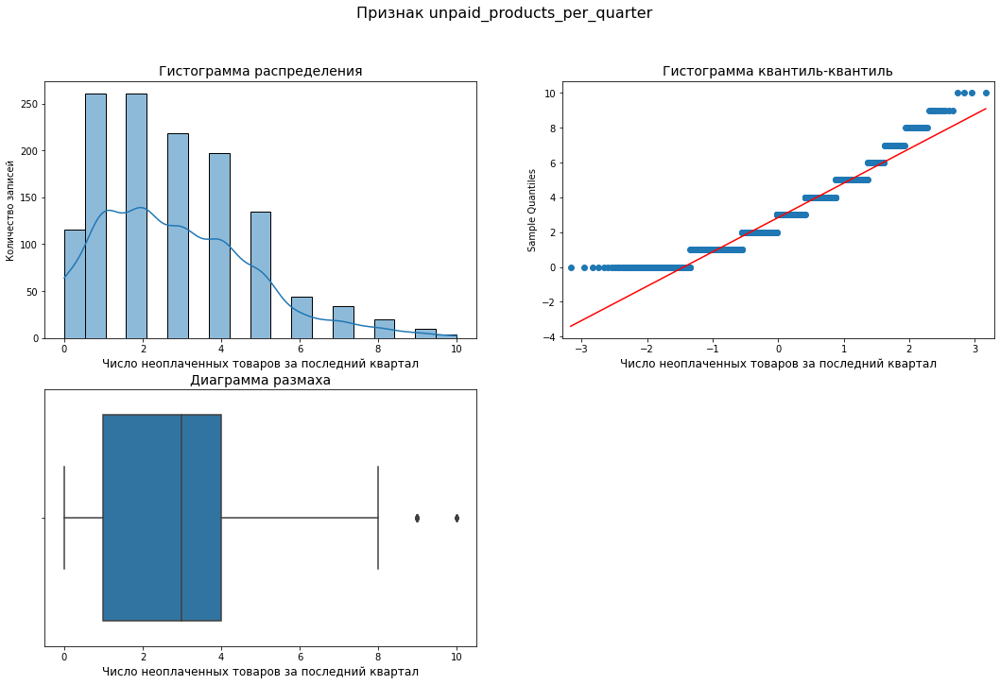

In [77]:
feature_hist_box(market_file, 'unpaid_products_per_quarter', "Число неоплаченных товаров за последний квартал")

In [78]:
feature_distribution(market_file, 'unpaid_products_per_quarter')

Коэффициент асимметрии = 0.7668258859337179 

Тест Шапиро-Уилка = ShapiroResult(statistic=0.9328905940055847, pvalue=1.016619879143336e-23) 



Медианное значение составляет 3 товара. Количество неоплаченных товаров от 9 и выше можно отнести к выбросам.

In [79]:
# Посмотрим записи с неоплаченными товарами от 9 и выше

market_file.loc[(market_file['unpaid_products_per_quarter'] >= 9)]

,id,consumer_activity,service_type,allow_info,avg_market_activity_6_months,market_activity_current_month,duration,promotional_purchases,popular_category,avg_category_view_per_visit,unpaid_products_per_quarter,service_mistake,pages_per_visit
72,215420,decreased,standard,yes,3.50,5,449,0.35,home_textiles,1,9,2,2
73,215421,decreased,premium,no,4.00,5,523,0.94,beauty+health_equipment,1,10,7,5
117,215465,decreased,standard,yes,3.50,5,449,0.28,home_textiles,1,9,2,2
118,215466,decreased,premium,no,2.40,5,523,0.30,beauty+health_equipment,1,10,1,4
176,215524,decreased,standard,yes,3.00,3,474,0.23,beauty+health_equipment,1,10,4,2
186,215534,decreased,premium,no,4.00,4,419,0.93,children_products,1,9,3,3
204,215552,decreased,standard,yes,0.90,4,624,0.89,cosmetics+accessories,1,9,5,1
216,215564,decreased,standard,no,3.90,3,618,0.24,beauty+health_equipment,2,10,3,5
246,215594,decreased,standard,yes,4.20,4,627,0.90,children_products,6,9,5,8
251,215599,decreased,standard,yes,3.40,4,716,0.28,home_textiles,2,9,4,6


In [80]:
# Их число составляет:

market_file.loc[(market_file['unpaid_products_per_quarter'] >=9 )]['id'].count()

14

In [81]:
# Посмотрим, к какой категории относятся пользователи с неоплаченными товарами.

market_file.loc[market_file['unpaid_products_per_quarter']].pivot_table(index='consumer_activity', aggfunc=('sum'))

,avg_category_view_per_visit,avg_market_activity_6_months,duration,id,market_activity_current_month,pages_per_visit,promotional_purchases,service_mistake,unpaid_products_per_quarter
consumer_activity,,,,,,,,,
decreased,5610,5495.50,912080,279956092,5042,5346,687.61,3579,2571


Все, кто не оплачивал товар, попали в категории со снизившейся активностью

Медиана признака = 4.0


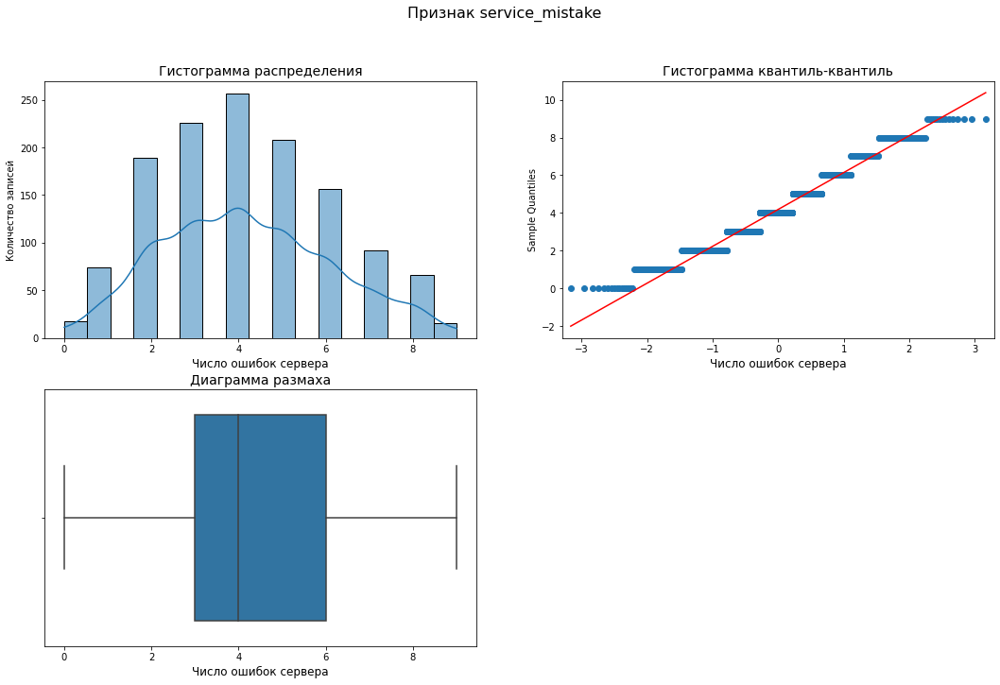

In [82]:
feature_hist_box(market_file, 'service_mistake', "Число ошибок сервера")

In [83]:
feature_distribution(market_file, 'service_mistake')

Коэффициент асимметрии = 0.2521404836735979 

Тест Шапиро-Уилка = ShapiroResult(statistic=0.9658770561218262, pvalue=6.221483467362438e-17) 



Наиболее равномерный график, с небольшим смещением весов влево. 

Выбросов здесь нет. Медианное значение составляет 4.

#### Числовые признаки по типу сервиса: стандарт и премиум

In [84]:
market_file_st.drop('id', axis=1).describe()

,avg_market_activity_6_months,market_activity_current_month,duration,promotional_purchases,avg_category_view_per_visit,unpaid_products_per_quarter,service_mistake,pages_per_visit
count,924.00,924.00,924.00,924.00,924.00,924.00,924.00,924.00
mean,4.31,4.04,552.84,0.31,3.38,2.77,4.15,8.12
std,1.01,0.69,239.59,0.25,1.39,1.97,1.92,3.94
min,0.90,3.00,110.00,0.00,1.00,0.00,0.00,1.00
25%,3.80,4.00,356.00,0.17,2.00,1.00,3.00,5.00
50%,4.30,4.00,544.00,0.24,3.00,3.00,4.00,8.00
75%,5.00,5.00,746.25,0.30,4.00,4.00,5.00,11.00
max,6.60,5.00,1064.00,0.99,6.00,10.00,9.00,19.00


In [85]:
market_file_pr.drop('id', axis=1).describe()

,avg_market_activity_6_months,market_activity_current_month,duration,promotional_purchases,avg_category_view_per_visit,unpaid_products_per_quarter,service_mistake,pages_per_visit
count,376.00,376.00,376.00,376.00,376.00,376.00,376.00,376.00
mean,4.12,3.93,722.45,0.34,3.01,3.00,4.26,8.31
std,1.02,0.72,233.38,0.26,1.24,1.97,2.04,4.07
min,0.90,3.00,121.00,0.00,1.00,0.00,0.00,1.00
25%,3.50,3.00,565.50,0.17,2.00,1.00,3.00,5.00
50%,4.10,4.00,763.00,0.24,3.00,3.00,4.00,8.00
75%,4.80,4.00,907.25,0.32,4.00,4.00,6.00,11.00
max,6.60,5.00,1079.00,0.99,6.00,10.00,9.00,20.00


Количество клиентов с категорией стандарт в 3 раза превышает категорию премиум.
Маркетинговая активность для типа сервиса стандарт в среднем выше, чем типа сервиса премиум (интересно, почему это так).
Среднее время регистрации на сайте категории стандарт на 170 дней меньше, чем категории премиум. 
Среднее число купленных акционных товаров в обеих категориях сопоставимо: 31 % стандарт и 34 % премиум.
В среднем пользоватили типа сервиса стандарт просматривают больше товарных категорий за визит, но меньше страниц. У них в среднем меньше сервисных ошибок и меньше количество неоплаченных единиц товара.

In [86]:
#sns.histplot(market_file, x="duration", hue="service_type", element="step");

#### Категориальные признаки

Перейдем к категориальным данным.

Рассмотрим их в общем виде.

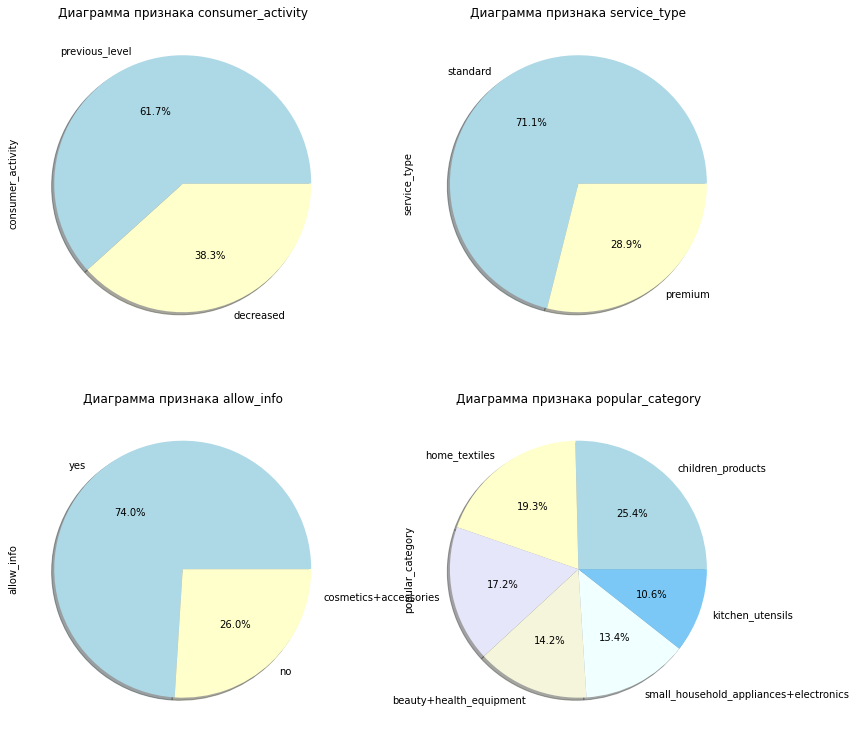

In [87]:
cat_col_names = ['consumer_activity', 'service_type', 'allow_info', 'popular_category']
fig, axes = plt.subplots(2, 2, figsize=(13, 13))
axe = axes.ravel()
colors = ["#ADD8E6", "#FFFFCB", "#E6E6FA", "#F5F5DC", "#F0FFFF", "#7BC8F6"]
for i, c in enumerate(cat_col_names):
    market_file[c].value_counts().plot(kind='pie',
                                      shadow=True,
                                      autopct='%1.1f%%',
                                      title='Диаграмма признака ' + str(c),
                                      ax=axe[i],
                                      colors=colors,                                      
    )

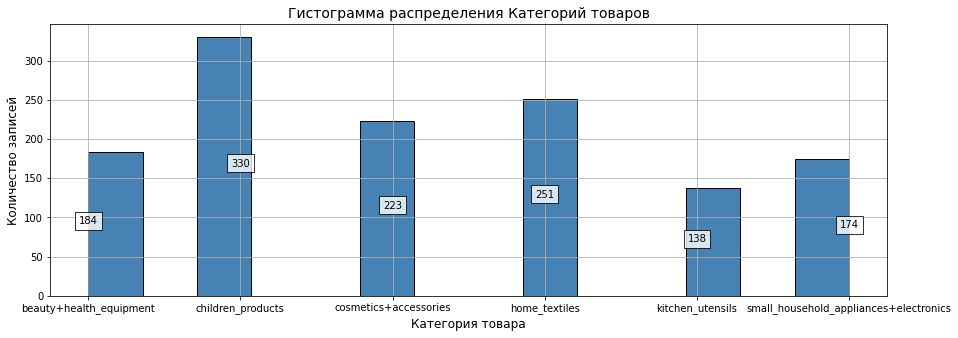

In [88]:
# Гистограмма категорий товаров (для большей наглядности сравнения категорий) 

fig, axs = plt.subplots(figsize=(15, 5))

plt.hist(market_file['popular_category'].sort_values(), bins = 'auto', color = 'steelblue', edgecolor = 'black')
plot_lables('Гистограмма распределения Категорий товаров', 'Категория товара', 'Количество записей')
axs.grid(True)

# подписи данных:
y=market_file.sort_values(by='popular_category').groupby('popular_category')['popular_category'].count()
for i in range(market_file['popular_category'].nunique()):
        plt.text(i,y[i]/2, y[i], ha = 'center', bbox = dict(facecolor = 'white', alpha =0.8))     

plt.show();

Покупательская активность Осталась на преженем уровне у 61,7% пользователей, снизилась у 38,3% пользователей.

По типу сервиса 28,9% составляет премиум, 71,1% - стандарт.

Разрешают присылать рекламную информацию 74% пользователей, не разрешают - 26%. 

Четверть покупок (25,4%) составляют товары для детей, затем домашний текстиль (19,3%), косметика и аксессуары (17,2%), товары для красоты и здоровья (14,2%), мелкая бытовая техника и электроника (13,4%), кухонная посуда (10,6%).

#### Взаимосвязи данных

Рассмотрим как распределены числовые данные в разбивке по категориальным признакам.

In [90]:
# Названия графиков

plot_titles = ['Средняя маркетинговая активность за 6 мес', 'Маркетинговая активность за тек.мес.', \
               'Время регистрации на сайте', 'Доля акционных покупок в общих покупках', \
               'Среднее число категорий товаров просмотренных за визит', \
               'Число неоплаченных товаров за квартал', 'Число ошибок сервера', 'Количество просмотренных за визит страниц']

# Подписи для осей X и Y

x_labels = ['Количество маркетинговых коммуникаций за 6 мес', 'Количество маркетинговых коммуникаций в тек.мес.', \
            'Время регистрации на сайте', 'Доля купленных акционных товаров', 'Среднее число просмотренных категорий за визит',\
            'Количество неоплаченных товаров за квартал', 'Количество ошибок сервера', 'Число просмотренных за визит страниц']

y_labels = ['Количество записей']*8

features = ['avg_market_activity_6_months', 'market_activity_current_month', 'duration', \
              'promotional_purchases', 'avg_category_view_per_visit', 'unpaid_products_per_quarter', \
              'service_mistake', 'pages_per_visit']

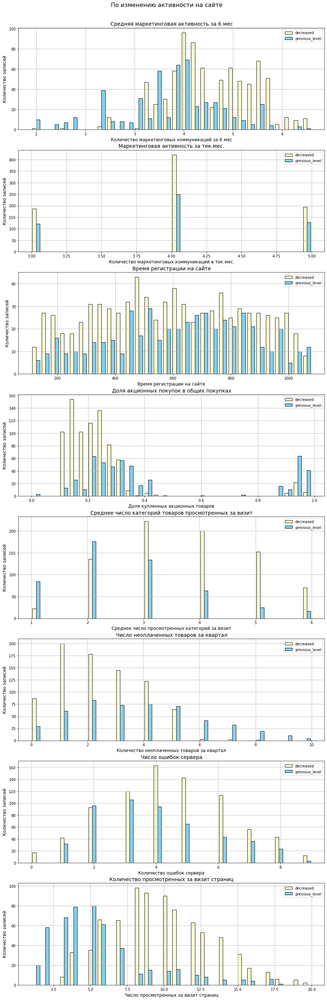

In [91]:
# Цвета

colors = ['lightGoldenRodYellow', 'Skyblue']

# Параметры графиков

fig, axs = plt.subplots(8, 1, figsize=(15, 48))
axs = axs.flatten()

# Название группы графиков

fig.suptitle("По изменению активности на сайте", size=16, y=0.9)

# Признак, по которому строим распределение

names = market_file['consumer_activity'].unique()

# Используем цикл для построения гистограмм

for i, feature in enumerate(features):
    
    x1 = list(market_file.loc[market_file['consumer_activity']=='previous_level'][feature])
    x2 = list(market_file.loc[market_file['consumer_activity']=='decreased'][feature])

    axs[i].hist([x1, x2], bins=30, color = colors, edgecolor = 'black', label = names)
    axs[i].legend()
    axs[i].set_title(plot_titles[i], fontsize=14)
    axs[i].set_xlabel(x_labels[i], fontsize=12)
    axs[i].set_ylabel(y_labels[i], fontsize=12)
    axs[i].grid(True)

plt.show();

Здесь стоит отметить, что снизилась активность пользователей, приобретающих акционные товары в небольших количествах - до 35% всего числа покупок. Но от 35% и выше - активность пользователей в большей степени сохранилась на прежнем уровне.
По времени регистрации: в большей степени снизилась активность пользователей, зарегистрированныз до 1 года.
В большей степени снизилась активность пользователей, которые просматривают от 3-х категорий товаров и более за визит.
Снизила активность пользователей, которые не оплатили 1-2 (до 5 максимум) товаров.
Число ошибок сервера - показывает нормальное распределение относительно всех остальных категорий - в тч по уровню активности пользователей.
И в значительной степени снизилась активность пользователей, которые просматривают от 8 и выше категорий за визит.

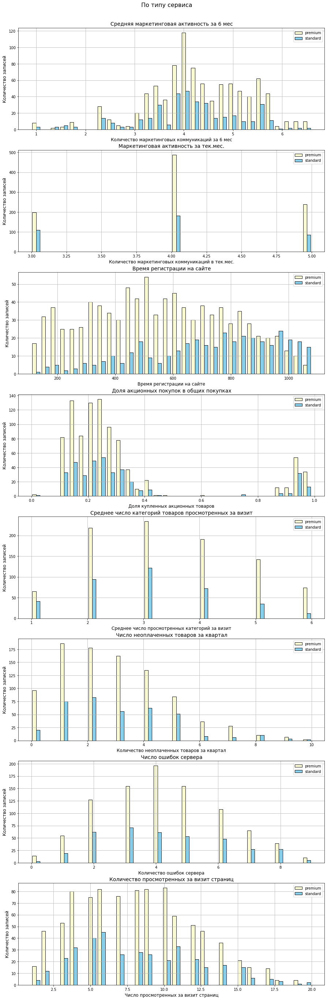

In [92]:
# Цвета

colors = ['lightGoldenRodYellow', 'Skyblue']

# Параметры графиков

fig, axs = plt.subplots(8, 1, figsize=(15, 48))
axs = axs.flatten()

# Название группы графиков

fig.suptitle("По типу сервиса", size=16, y=0.9)

# Признак, по которому строим распределение

names = market_file['service_type'].unique()

# Используем цикл для построения гистограмм

for i, feature in enumerate(features):
    
    x1 = list(market_file.loc[market_file['service_type']=='standard'][feature])
    x2 = list(market_file.loc[market_file['service_type']=='premium'][feature])

    axs[i].hist([x1, x2], bins=30, color = colors, edgecolor = 'black', label = names)
    axs[i].legend()
    axs[i].set_title(plot_titles[i], fontsize=14)
    axs[i].set_xlabel(x_labels[i], fontsize=12)
    axs[i].set_ylabel(y_labels[i], fontsize=12)
    axs[i].grid(True)

plt.show();

Пользователи с типом сервиса премиум имеют более высокие показатели по всем признакам, нежели пользователи с типом сервиса стандарт (включая неоплаченные товары). Учитывая, что число пользователей премиум составляет всего четверть, а стандарт - 3/4 общего числа пользователей. По времени регистрации на сайте - более длительный период регистрации у пользователей с типом сервиса стандарт.

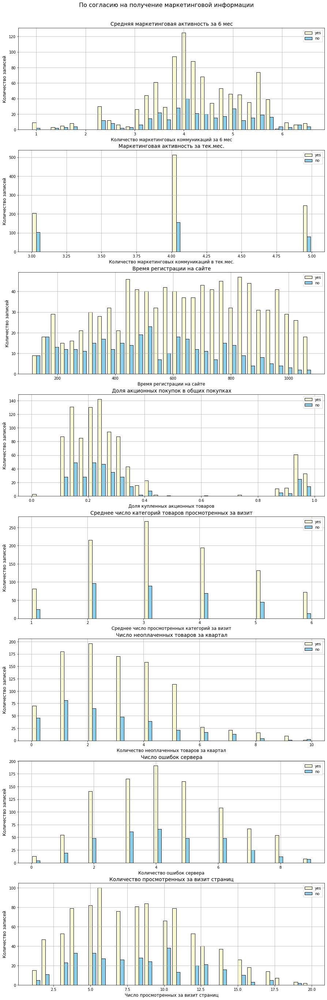

In [93]:
# Цвета

colors = ['lightGoldenRodYellow', 'Skyblue']

# Параметры графиков

fig, axs = plt.subplots(8, 1, figsize=(15, 48))
axs = axs.flatten()

# Название группы графиков

fig.suptitle("По согласию на получение маркетинговой информации", size=16, y=0.9)

# Признак, по которому строим распределение

names = market_file['allow_info'].unique()

# Используем цикл для построения гистограмм

for i, feature in enumerate(features):
    
    x1 = list(market_file.loc[market_file['allow_info']=='yes'][feature])
    x2 = list(market_file.loc[market_file['allow_info']=='no'][feature])

    axs[i].hist([x1, x2], bins=30, color = colors, edgecolor = 'black', label = names)
    axs[i].legend()
    axs[i].set_title(plot_titles[i], fontsize=14)
    axs[i].set_xlabel(x_labels[i], fontsize=12)
    axs[i].set_ylabel(y_labels[i], fontsize=12)
    axs[i].grid(True)

plt.show();

Пользователи, согласившиеся получать маркетинговые рассылки имеют более высокие показатели по всем признакам. Будем принимать во внимание, что и их количество составляет 3/4 от общего числа пользователей.

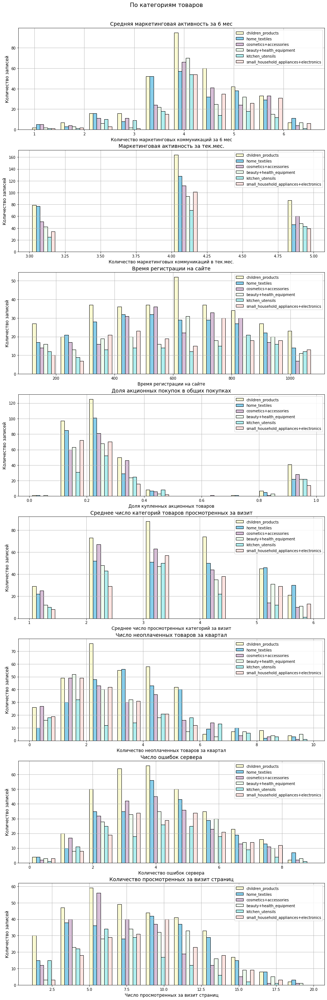

In [94]:
# Цвета

colors = ['lightGoldenRodYellow', 'Skyblue', 'Thistle', 'HoneyDew', 'PaleTurquoise', 'Mistyrose']

# Параметры графиков

fig, axs = plt.subplots(8, 1, figsize=(15, 48))
axs = axs.flatten()

# Название группы графиков

fig.suptitle("По категориям товаров", size=16, y=0.9)

# Признак, по которому строим распределение

names = market_file['popular_category'].unique()

# Используем цикл для построения гистограмм

for i, feature in enumerate(features):
    
    x1 = list(market_file.loc[market_file['popular_category']=='children_products'][feature])
    x2 = list(market_file.loc[market_file['popular_category']=='home_textiles'][feature])
    x3 = list(market_file.loc[market_file['popular_category']=='cosmetics+accessories'][feature])
    x4 = list(market_file.loc[market_file['popular_category']=='beauty+health_equipment'][feature])
    x5 = list(market_file.loc[market_file['popular_category']=='kitchen_utensils'][feature])
    x6 = list(market_file.loc[market_file['popular_category']=='small_household_appliances+electronics'][feature])

    axs[i].hist([x1, x2, x3, x4, x5, x6], bins=10, color = colors, edgecolor = 'black', label = names)
    axs[i].legend()
    axs[i].set_title(plot_titles[i], fontsize=14)
    axs[i].set_xlabel(x_labels[i], fontsize=12)
    axs[i].set_ylabel(y_labels[i], fontsize=12)
    axs[i].grid(True)

plt.show();

Бесспорным лидером по всем группам признаков являеются товары для детей.

Посмотрим на агрегированные данные в разбивке по типу сервиса и степени активности

In [95]:
# Выведем сводную таблицу

market_file.drop('id', axis=1).pivot_table(index=['service_type','consumer_activity'], aggfunc=('mean')).T

service_type                    premium                 standard  \
consumer_activity             decreased previous_level decreased   
avg_category_view_per_visit        2.53           3.40      2.69   
avg_market_activity_6_months       3.63           4.52      3.81   
duration                         724.42         720.83    565.70   
market_activity_current_month      3.98           3.90      4.03   
pages_per_visit                    5.58          10.56      5.56   
promotional_purchases              0.46           0.23      0.44   
service_mistake                    4.21           4.31      3.80   
unpaid_products_per_quarter        3.66           2.46      3.75   

service_type                                  
consumer_activity             previous_level  
avg_category_view_per_visit             3.76  
avg_market_activity_6_months            4.59  
duration                              545.76  
market_activity_current_month           4.05  
pages_per_visit                         9.53  
promotional_purchases                   0.24  
service_mistake                         4.35  
unpaid_products_per_quarter             2.24

Учитывая дальнейшее машинное обучение, возможно, количество просмотренных страниц может быть причиной утечки целевого признака. Отметим этот момент.

### Остальные файлы

Перейдем к рассмотрению остальных файлов.

In [97]:
market_money.describe()

,id,revenue
count,3900.00,3900.00
mean,215997.50,5025.70
std,375.33,1777.70
min,215348.00,0.00
25%,215672.75,4590.15
50%,215997.50,4957.50
75%,216322.25,5363.00
max,216647.00,106862.20


Средняя выручка с покупателя составляет 5 тысяч единиц измерения. Допустим, что это тысячи рублей, тк в описании у нас не указаны единицы измерения.

Минимальная выручка с покупателя составляет 0 - нужно будет проверить, новый это покупатель или по какой-то причине он не совершает покупки.

А вот максимальное значение, похоже на выброс, посмотрим на графиках.

Медиана признака = 4957.5


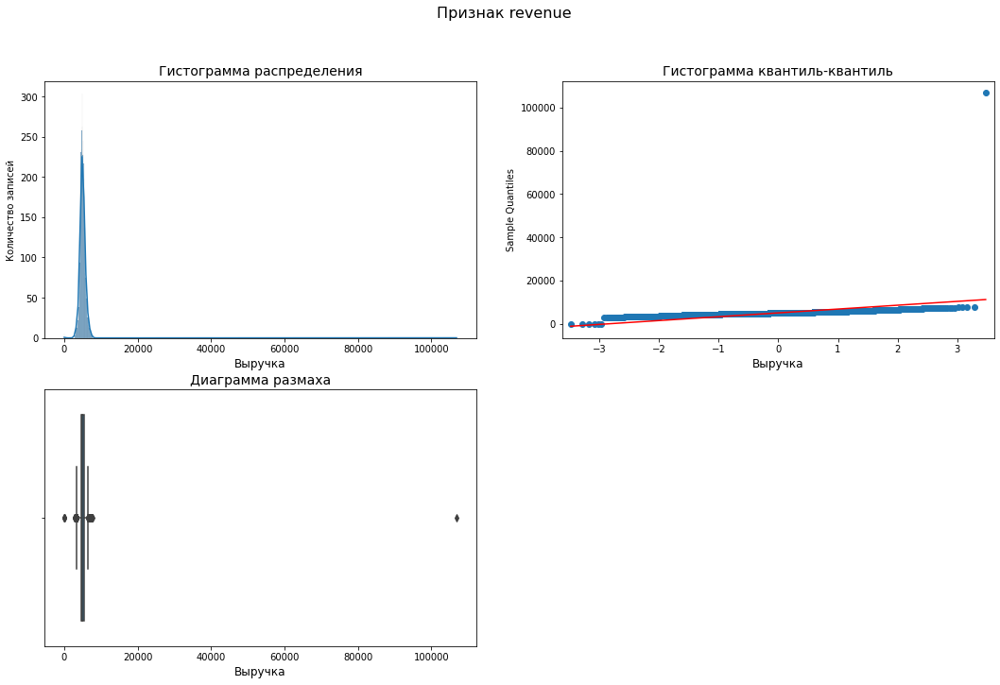

In [98]:
feature_hist_box(market_money, 'revenue', "Выручка")

In [99]:
# Посмотрим выручку больше 10 000

market_money[market_money['revenue'] >= 10000]

,id,period,revenue
98,215380,current_month,106862.20


In [100]:
# Посмотрим значения выручки по этому покупателю за квартал

market_money[market_money['id'] == 215380]

,id,period,revenue
96,215380,pre_previous_month,5051.00
97,215380,previous_month,6077.00
98,215380,current_month,106862.20


In [101]:
market_money.pivot_table(index='period', aggfunc=('mean'))

,id,revenue
period,,
current_month,215997.50,5314.96
pre_previous_month,215997.50,4825.21
previous_month,215997.50,4936.92


В среднем выручка приросла в текущем месяце в 1,17 раз по сравнению с предыдущим.
Если предположить, что у клиента = 215380 ошибочно появилось 10, то прирост выручки будет в 1,12 раз к предыдущему месяцу. Что с целом находится в границах общей тенденции. 
Полагаю, можно это значение заменить без ущерба общим данным.

In [102]:
market_money.loc[(market_money['id'] == 215380)&(market_money['period'] == 'current_month'),'revenue'] = 6862.20

In [103]:
market_money[market_money['id'] == 215380]

,id,period,revenue
96,215380,pre_previous_month,5051.00
97,215380,previous_month,6077.00
98,215380,current_month,6862.20


In [104]:
market_money.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       3900 non-null   int64  
 1   period   3900 non-null   object 
 2   revenue  3900 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 91.5+ KB


Теперь никаких аномалий.

In [105]:
# Проверим, какое теперь максимальное значение выручки

market_money['revenue'].max()

7799.4

In [106]:
# Посмотрим выручку меньше 1000

market_money[market_money['revenue'] <= 1000]

,id,period,revenue
0,215348,pre_previous_month,0.00
2,215348,previous_month,0.00
28,215357,pre_previous_month,0.00
29,215357,previous_month,0.00
34,215359,previous_month,0.00
35,215359,pre_previous_month,0.00


3 записи с нулевой выручкой за 2 предыдущих месяца.

In [107]:
# Выведем их выручку за текущий месяц

market_money[(market_money['period'] == 'current_month')&(
    (market_money['id'] == 215348)|(market_money['id'] == 215359)|(market_money['id'] == 215357))]

,id,period,revenue
1,215348,current_month,3293.10
27,215357,current_month,5986.30
33,215359,current_month,4735.00


Все в порядке, возможно, это относительно новые клиенты.

Медиана признака = 4959.0


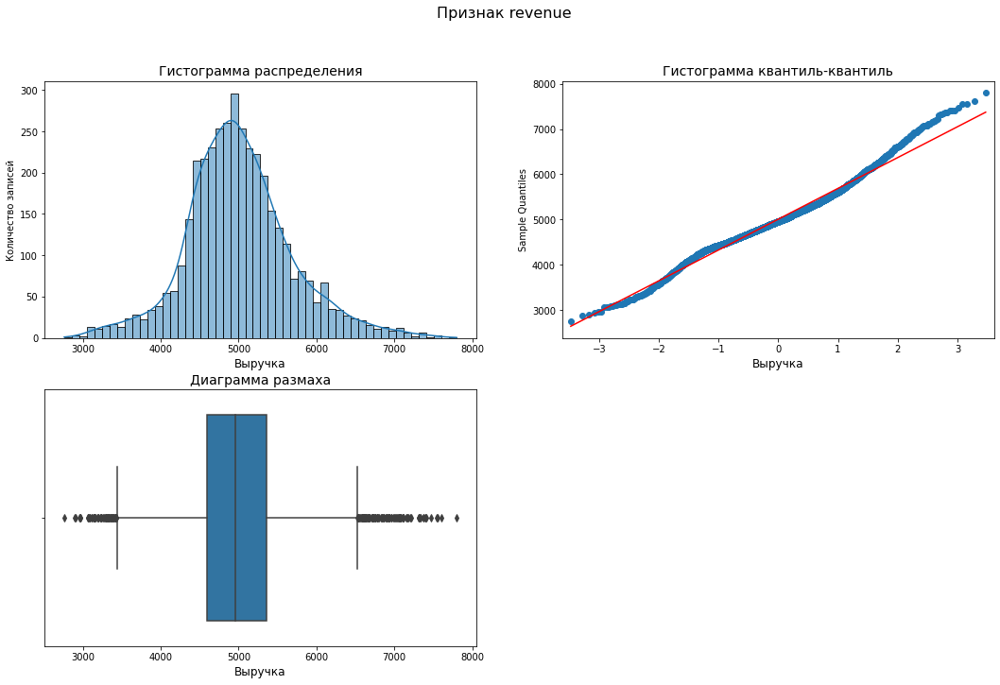

In [108]:
# Строим графики без рассмотренных выше выбросов

feature_hist_box(market_money[market_money['revenue']>=2000], 'revenue', "Выручка")

Ящик с усами показывает определяет нормальный разброс данных от 3,5 до 6,5 тыс. руб.

In [109]:
# И считаем коэффициенты

feature_distribution(market_money[market_money['revenue']>=2000], 'revenue')

Коэффициент асимметрии = 0.35947564638135837 

Тест Шапиро-Уилка = ShapiroResult(statistic=0.9816758632659912, pvalue=4.710778947231092e-22) 



График не симметричен, со смещением весов влево.

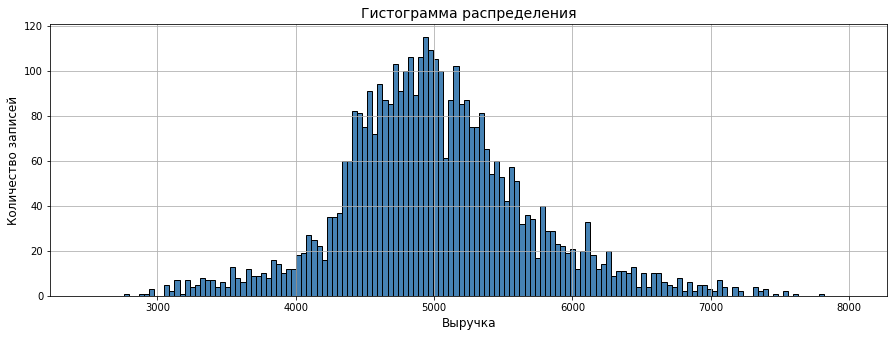

In [110]:
# Гистограмма при количестве групп = 150

fig, axs = plt.subplots(figsize=(15, 5))

plt.hist(market_money['revenue'], range=(2500,8000), bins = 150, color = 'steelblue', edgecolor = 'black')
plot_lables('Гистограмма распределения', 'Выручка', 'Количество записей')
axs.grid(True)
plt.show();

Удалять пока данные не будем, поскольку они могут быть важны после объединения таблиц.

In [111]:
market_money.drop('id', axis=1).pivot_table(index='period', aggfunc=('sum', 'count', 'mean'))

revenue                   
                     count    mean        sum
period                                       
current_month         1300 5238.04 6809449.10
pre_previous_month    1300 4825.21 6272769.00
previous_month        1300 4936.92 6417996.50

В последние 3 месяца общая сумма и средняя выручка по клентам растет, достигая максимальных значений в текущем месяце.

In [112]:
market_time.describe()

,id,minutes
count,2600.00,2600.00
mean,215997.50,13.34
std,375.35,4.08
min,215348.00,4.00
25%,215672.75,10.00
50%,215997.50,13.00
75%,216322.25,16.00
max,216647.00,23.00


Время (минут), проведенное на сайте выглядит без аномалий. Минимальное число минут = 4, максимальное = 23, среднее время = 13 минут.

Медиана признака = 13.0


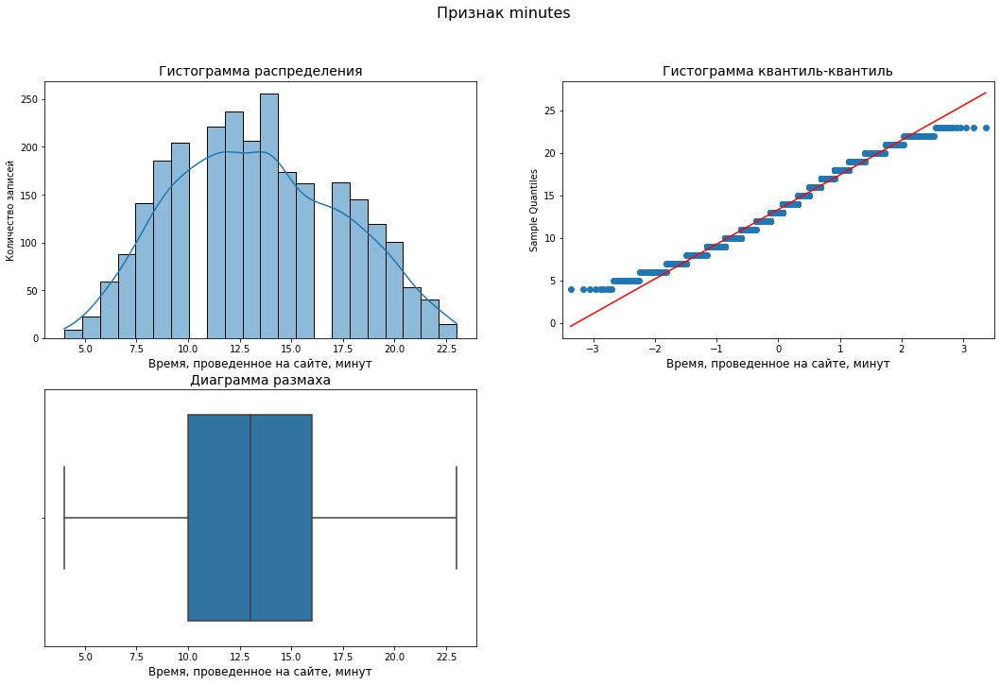

In [113]:
# Построим графики

feature_hist_box(market_time, 'minutes', "Время, проведенное на сайте, минут")

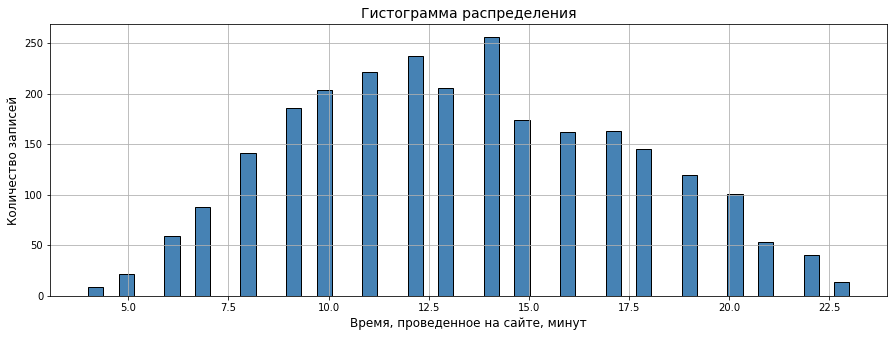

In [114]:
# Гистограмма при количестве групп = 50

fig, axs = plt.subplots(figsize=(15, 5))

plt.hist(market_time['minutes'], bins = 50, color = 'steelblue', edgecolor = 'black')
plot_lables('Гистограмма распределения', 'Время, проведенное на сайте, минут', 'Количество записей')
axs.grid(True)
plt.show();

In [115]:
# Коэффициенты

feature_distribution(market_time, 'minutes')

Коэффициент асимметрии = 0.15519176936259133 

Тест Шапиро-Уилка = ShapiroResult(statistic=0.9825971126556396, pvalue=2.538257641794904e-17) 



In [116]:
market_time.drop('id', axis=1).pivot_table(index='period', aggfunc=('sum', 'count', 'mean'))

minutes               
                 count  mean      sum
period                               
current_month  1300.00 13.20 17166.00
previous_month 1300.00 13.47 17508.00

Здесь равное число записей за текущий и предыдущий месяцы.
Среднее время на сайте в текущем месяце незначительно снизилось (на 0,27 минут), общее время снизилось на 342 минуты.

In [117]:
market_time['id'].nunique()

1300

Все записи здесь уникальны, задвоений нет.

In [118]:
money.describe()

,id,profit
count,1300.00,1300.00
mean,215997.50,4.00
std,375.42,1.01
min,215348.00,0.86
25%,215672.75,3.30
50%,215997.50,4.04
75%,216322.25,4.67
max,216647.00,7.43


Среднемесячная прибыль магазина от каждого покупателя за последние 3 месяца в среднем составляет 4 единицы измерения. Минимальна = 0,86, максимальная = 7,43. Аномалий в данных не отмечено.

Медиана признака = 4.045


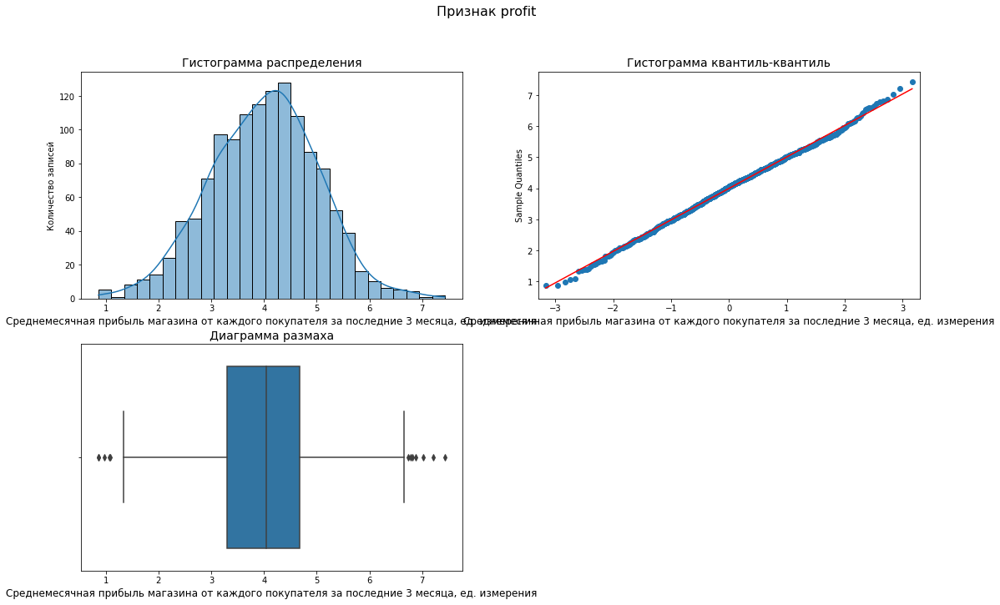

In [119]:
feature_hist_box(money, 'profit', "Среднемесячная прибыль магазина от каждого покупателя за последние 3 месяца, ед. измерения")

In [120]:
feature_distribution(money, 'profit')

Коэффициент асимметрии = -0.07624793854216559 

Тест Шапиро-Уилка = ShapiroResult(statistic=0.9983817934989929, pvalue=0.2580398917198181) 



Наиболее симметричный график из всех расмотренных, с незначительным смещением весов вправо.

**Вывод:**

Данные распределены не рававномерно (учтем это для корреляции). 
Аномальное значение выручки заменено на более адекватное.
Выбросы, которые определяет диаграмма распределения, оставим, в силу небольшого объема выборки и с целью максимального сохранения информации.

## Шаг 4. Объединение таблиц

Перед объединением данных выведем исходный объем каждого файла и первые 5 строк.

Проверяем размер файлов до объединения

In [121]:
market_file.shape

(1300, 13)

In [122]:
market_money.shape

(3900, 3)

In [123]:
market_time.shape

(2600, 3)

In [124]:
market_file.head()

,id,consumer_activity,service_type,allow_info,avg_market_activity_6_months,market_activity_current_month,duration,promotional_purchases,popular_category,avg_category_view_per_visit,unpaid_products_per_quarter,service_mistake,pages_per_visit
0,215348,decreased,premium,yes,3.40,5,121,0.00,children_products,6,2,1,5
1,215349,decreased,premium,yes,4.40,4,819,0.75,children_products,4,4,2,5
2,215350,decreased,standard,no,4.90,3,539,0.14,home_textiles,5,2,1,5
3,215351,decreased,standard,yes,3.20,5,896,0.99,children_products,5,0,6,4
4,215352,decreased,standard,no,5.10,3,1064,0.94,children_products,3,2,3,2


In [125]:
market_money.head()

,id,period,revenue
0,215348,pre_previous_month,0.00
1,215348,current_month,3293.10
2,215348,previous_month,0.00
3,215349,pre_previous_month,4472.00
4,215349,current_month,4971.60


In [126]:
market_time.head()

,id,period,minutes
0,215348,current_month,14
1,215348,previous_month,13
2,215349,current_month,10
3,215349,previous_month,12
4,215350,current_month,13


In [127]:
money_pivot = market_money.pivot(index='id', columns='period', values='revenue')

In [128]:
market_total = pd.merge(market_file, money_pivot, on='id')

In [129]:
market_total = pd.merge(market_total, market_time.pivot(index='id', columns='period', values='minutes'), on='id')

In [130]:
market_total.columns = ['id', 'consumer_activity', 'service_type', 'allow_info',
       'avg_market_activity_6_months', 'market_activity_current_month',
       'duration', 'promotional_purchases', 'popular_category',
       'avg_category_view_per_visit', 'unpaid_products_per_quarter',
       'service_mistake', 'pages_per_visit', 'current_month_revenue',
       'pre_previous_month_revenue', 'previous_month_revenue', 'current_month_minutes',
       'previous_month_minutes']

In [131]:
market_total.head()

,id,consumer_activity,service_type,allow_info,avg_market_activity_6_months,market_activity_current_month,duration,promotional_purchases,popular_category,avg_category_view_per_visit,unpaid_products_per_quarter,service_mistake,pages_per_visit,current_month_revenue,pre_previous_month_revenue,previous_month_revenue,current_month_minutes,previous_month_minutes
0,215348,decreased,premium,yes,3.40,5,121,0.00,children_products,6,2,1,5,3293.10,0.00,0.00,14,13
1,215349,decreased,premium,yes,4.40,4,819,0.75,children_products,4,4,2,5,4971.60,4472.00,5216.00,10,12
2,215350,decreased,standard,no,4.90,3,539,0.14,home_textiles,5,2,1,5,5058.40,4826.00,5457.50,13,8
3,215351,decreased,standard,yes,3.20,5,896,0.99,children_products,5,0,6,4,6610.40,4793.00,6158.00,13,11
4,215352,decreased,standard,no,5.10,3,1064,0.94,children_products,3,2,3,2,5872.50,4594.00,5807.50,11,8


Таких нет. Поэтому оставляем все данные.

(В задании было - отобрать клиентов с покупательской активностью в послдение 3 месяца. Получается, это все, кто есть).

In [132]:
# Найдем клиентов, которые не совершали покупок хотя бы в один из 3-х месяцев

market_total.query('current_month_revenue == 0 or previous_month_revenue == 0 or pre_previous_month_revenue == 0')['id'].count()

3

Есть три таких наблюдения. По условию, такие данные мы не используем, они составляют 0,23% общего объема данных. Думаю, можно их удалить.

In [133]:
market_total = market_total.query(
    'current_month_revenue != 0 and previous_month_revenue != 0 and pre_previous_month_revenue != 0')

In [134]:
market_total.shape

(1297, 18)

Итоговый файл уменьшился на 3 строки.

Для дальнейшей работы, проведем несколько преобразований.

In [135]:
# на всякий случай сохраним исходный файл в неизменном виде

market_total_original = market_total.copy()

Переведем признак целевой категории в числовые значения. Пусть прежний уровень будет = 0, а снижения уровня активности = 1.

**Вывод:**

Мы объединили данные первых 3-х таблиц: основной файл, выручка и минуты на сайте.
Проверив покупательскую активность в последние 3 месяца, выяснили, что все клиенты подходят под эти условия. Оставляем все 1300 записей.

## Шаг 5. Корреляционный анализ

Выведем диаграммы рассеяния признаков с сегментацией по целевому.

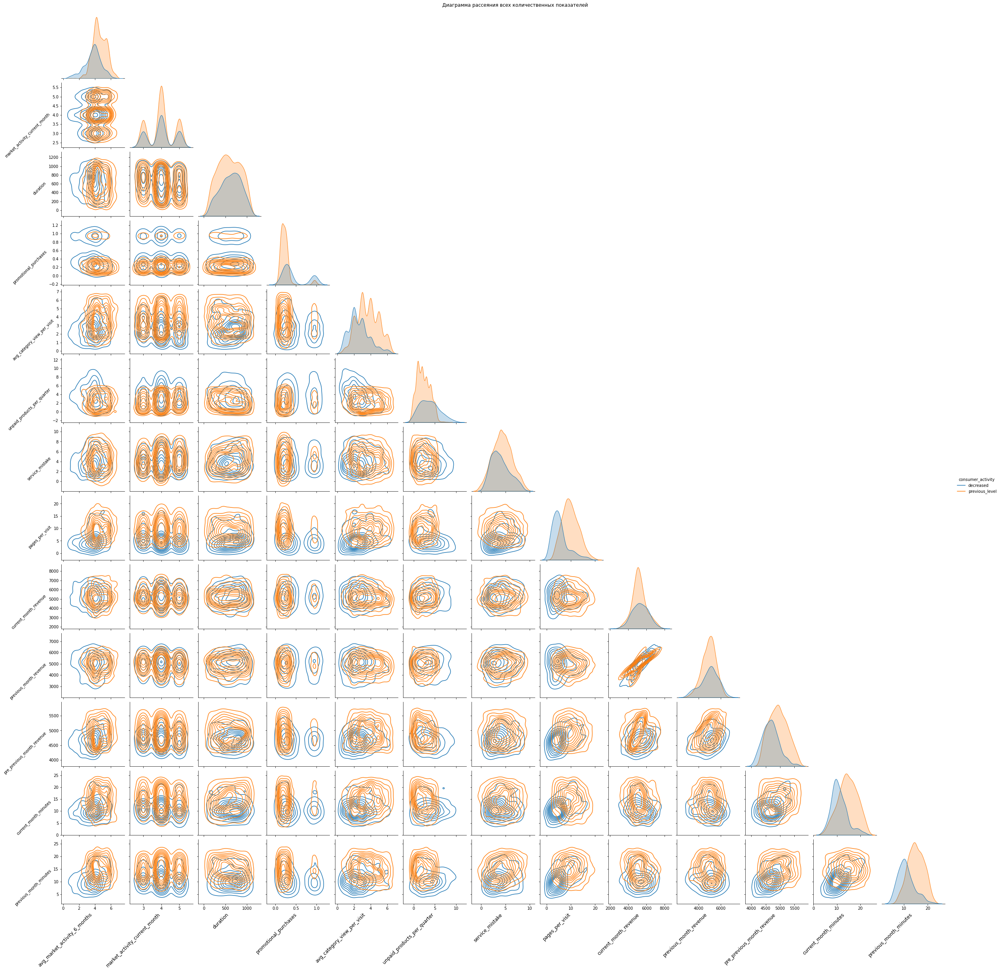

In [137]:
# Диаграмма рассеяния всех количественных показателей

pair_plot = sns.pairplot(market_total[['consumer_activity', 'avg_market_activity_6_months',
                           'market_activity_current_month', 'duration', 'promotional_purchases',
                           'avg_category_view_per_visit', 'unpaid_products_per_quarter',
                           'service_mistake', 'pages_per_visit', 'current_month_revenue', 
                           'previous_month_revenue', 'pre_previous_month_revenue', 'current_month_minutes',
                           'previous_month_minutes']], kind="kde", corner=True, hue = 'consumer_activity')

# Поворачиваем подписи осей X и Y для каждой поддиаграммы
for ax in pair_plot.axes[:, 0]:
    ax.yaxis.label.set_rotation(45)
    ax.yaxis.label.set_ha('right')
    ax.xaxis.label.set_fontsize(12)

for ax in pair_plot.axes[-1, :]:
    ax.xaxis.label.set_rotation(45)
    ax.xaxis.label.set_ha('right')
    ax.xaxis.label.set_fontsize(12)

# Добавляем заголовок
pair_plot.fig.suptitle('Диаграмма рассеяния всех количественных показателей', y=1)
plt.show();    
#plt.gcf().set_size_inches(15,15);

Четкой границы разделения по категориям целевого признака нет. Как нет и явной прямой линейной зависимости (кроме показателей выручки между собой). (но это из метрик распределения признаков было видно).

Сократим немного список признаков. Уберем выручку, поскольку она наиболее линейно только внутри себя связана.

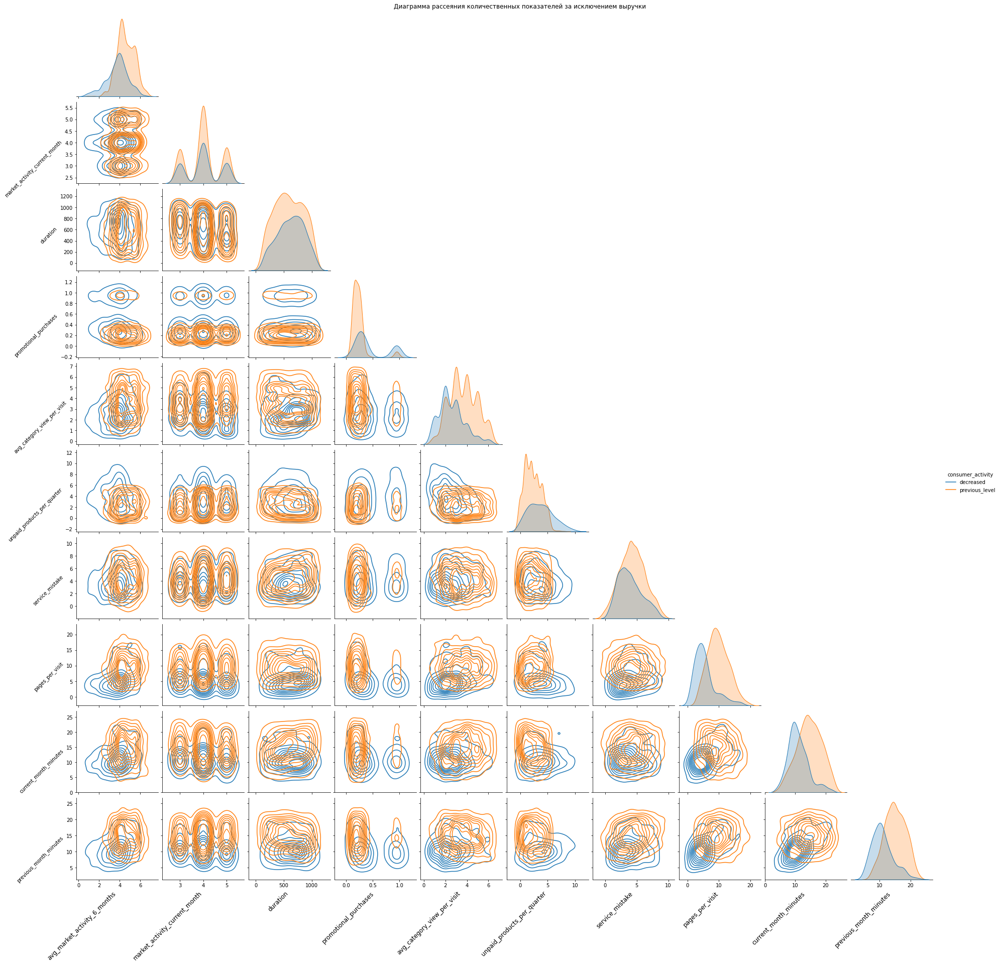

In [138]:
# Диаграмма рассеяния количественных показателей, кроме выручки

pair_plot = sns.pairplot(market_total[['consumer_activity', 'avg_market_activity_6_months',
                           'market_activity_current_month', 'duration', 'promotional_purchases',
                           'avg_category_view_per_visit', 'unpaid_products_per_quarter',
                           'service_mistake', 'pages_per_visit', 'current_month_minutes',
                           'previous_month_minutes']], kind="kde", corner=True, hue = 'consumer_activity')

# Поворачиваем подписи осей X и Y для каждой поддиаграммы
for ax in pair_plot.axes[:, 0]:
    ax.yaxis.label.set_rotation(45)
    ax.yaxis.label.set_ha('right')
    ax.xaxis.label.set_fontsize(12)

for ax in pair_plot.axes[-1, :]:
    ax.xaxis.label.set_rotation(45)
    ax.xaxis.label.set_ha('right')
    ax.xaxis.label.set_fontsize(12)

# Добавляем заголовок
pair_plot.fig.suptitle('Диаграмма рассеяния количественных показателей за исключением выручки', y=1)
plt.show();    

Здесь хорошо видно, что промо-покупки разделились на 2 группы - стоит сделать из них 2 признака (граница 0,6).

Наиболее линейная зависимость у количества минут на сайте и просмотренных страниц.

Добавим колонку с категориями покупок товаров по акции.

In [139]:
# Используем функцию cut

market_total['promo_purchases_cat'] = pd.cut(market_total['promotional_purchases'], bins=2, labels=False) 

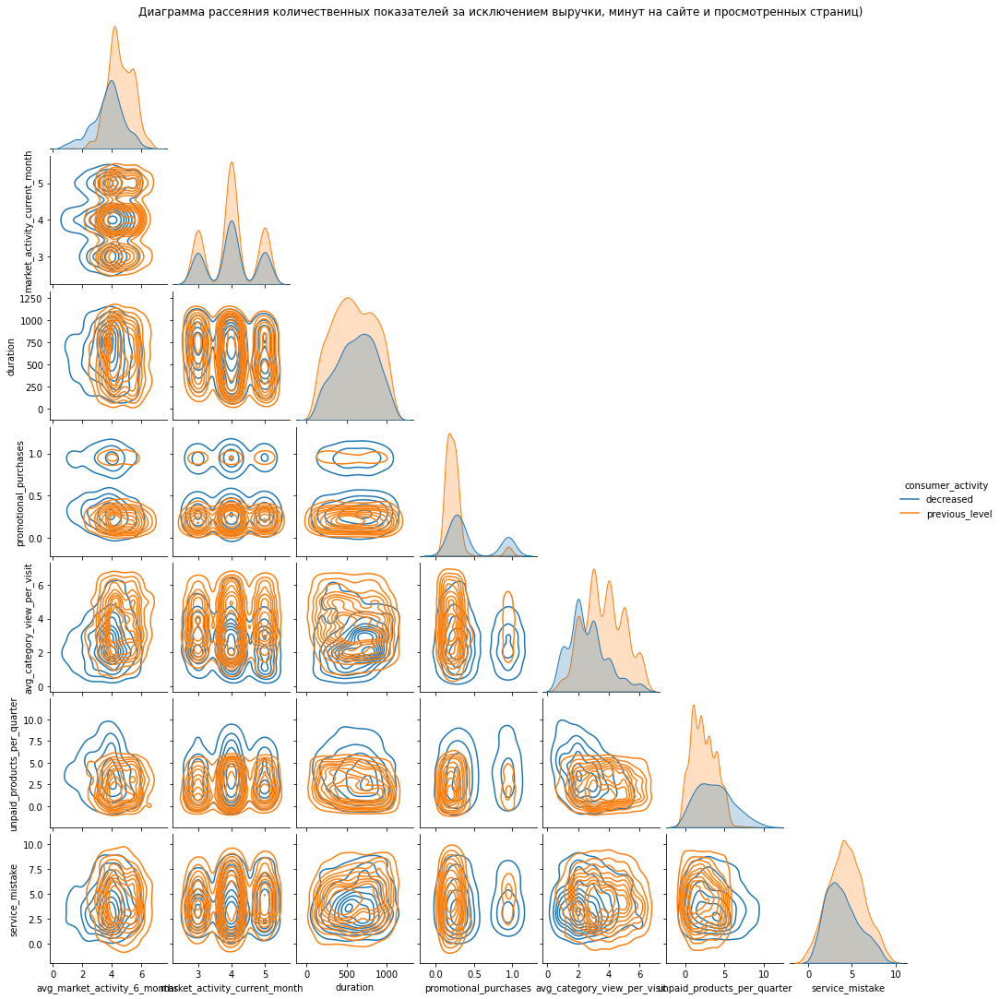

In [140]:
# Диаграмма рассеяния количественных показателей без выручки, минут на сайте и просмотренных страниц

sns.pairplot(market_total[['consumer_activity', 'avg_market_activity_6_months',
                           'market_activity_current_month', 'duration', 'promotional_purchases',
                           'avg_category_view_per_visit', 'unpaid_products_per_quarter',
                           'service_mistake']], kind="kde", corner=True, hue = 'consumer_activity'
            ).fig.suptitle(
    'Диаграмма рассеяния количественных показателей за исключением выручки, минут на сайте и просмотренных страниц)', y=1
)
plt.gcf().set_size_inches(15,15);

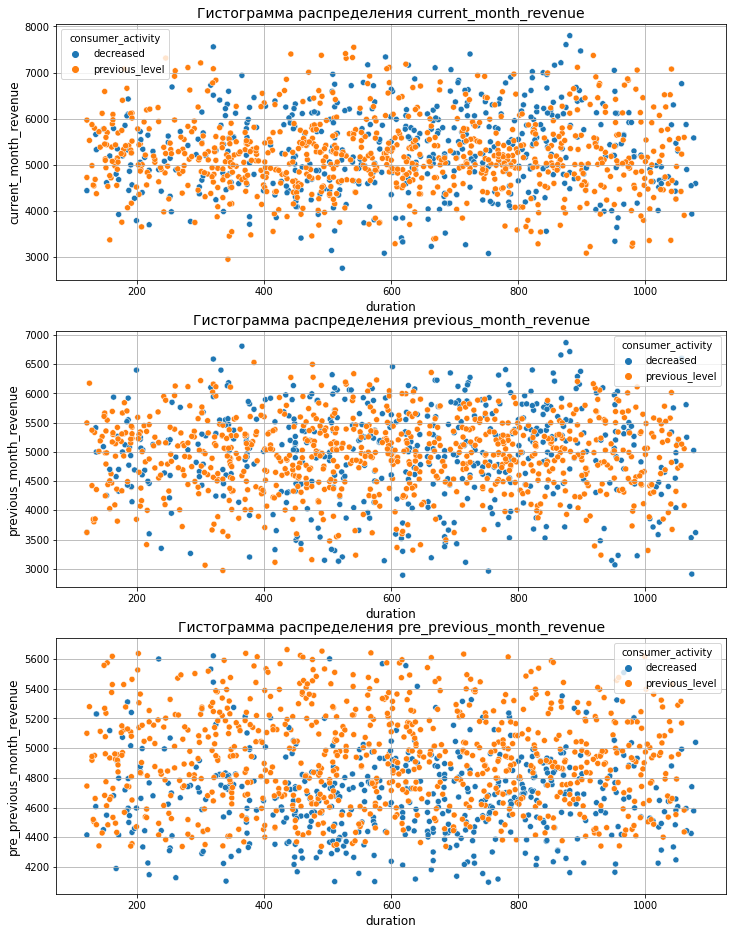

In [141]:
# Рассмотрим отдельно показатели выручки за каждый месяц в связи со временем регистрации

fig, axs = plt.subplots(3, 1, figsize=(12, 16))
axs = axs.flatten()
revenue_month = ['current_month_revenue', 'previous_month_revenue', 'pre_previous_month_revenue']
minutes_month = ['current_month_minutes', 'previous_month_minutes']
revenue_diff = ['revenue_diff_pre_month', 'revenue_diff_curr_month']

for i, item in enumerate(revenue_month):
    
    sns.scatterplot(data=market_total, x='duration', y=item, hue='consumer_activity', ax=axs[i])
    
    axs[i].set_title(f'Гистограмма распределения {item}', fontsize=14)
    axs[i].set_xlabel('duration', fontsize=12)
    axs[i].set_ylabel(f'{item}', fontsize=12)
    axs[i].grid(True)

Все пользователи совершают покупки достаточно равномерно. Выручка от месяца к месяцу повышается от 6 000 до 7 000 и 8 000 единиц измерения.

Больше диаграмм рассеяния я добавила после объединения основного файла с прибыльностью клиентов, чтобы все данные были рядом.

Посмотрим на зависимости числовых параметров.

Коэффициент Пирсона не рассматриваем, поскольку признаки не распределены нормально.

Рассмотрим корреляции с коээфициентами Спирмана и Фи

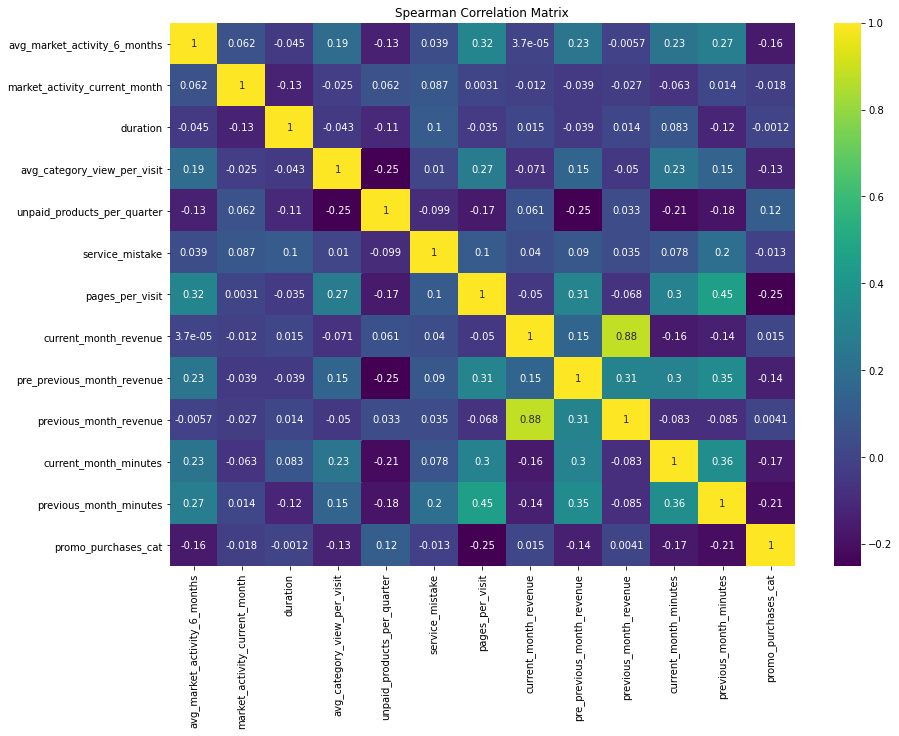

In [142]:
# Матрица корреляции числовых признаков Спирмана

fig, ax = plt.subplots(figsize=(14, 10))
sns.heatmap(market_total.drop(['id', 'promotional_purchases', 'consumer_activity'], axis=1).corr(method='spearman'), annot=True, cmap='viridis')
plt.title('Spearman Correlation Matrix');

Взаимосвязь выручки текущего и предыдущего месяцев близка к мультиколлинеарности.

Для анализа всех признаков исключим исходный promotional_purchases, оставим новый категориальный признак promo_purchases_cat.

In [143]:
# Определим непрерывные признаки для корреляции Фи

interval_columns = ['duration', 'promotional_purchases', 'current_month_revenue',
                    'previous_month_revenue', 'pre_previous_month_revenue','current_month_minutes', 'previous_month_minutes']

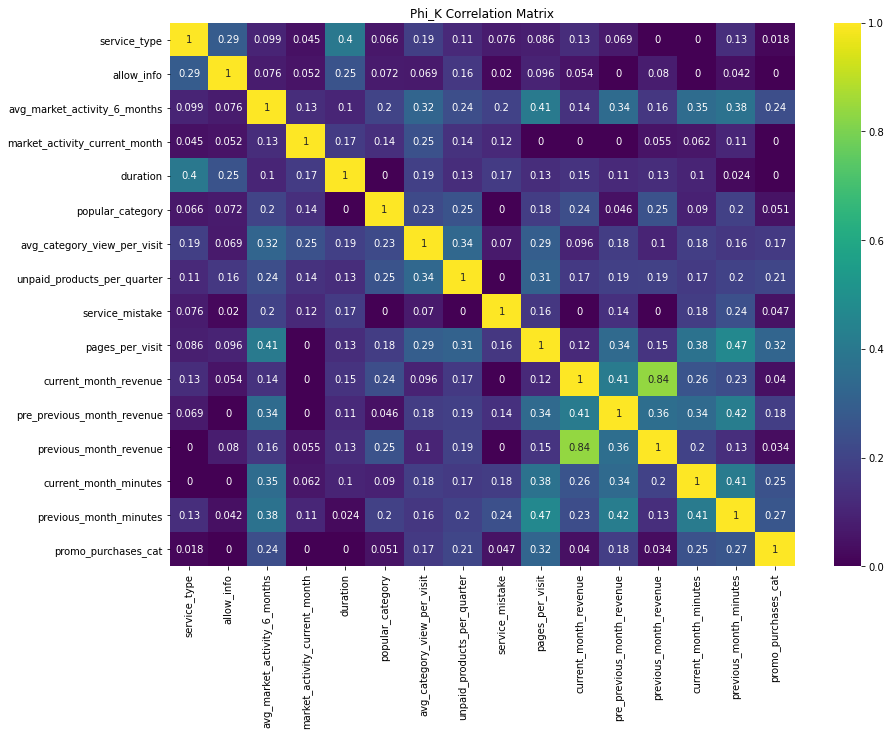

In [144]:
# Матрица корреляции Фи в целом для всех данных 

fig, ax = plt.subplots(figsize=(14, 10))

sns.heatmap(market_total.drop(['id', 'promotional_purchases', 'consumer_activity'], axis=1
                             ).phik_matrix(interval_cols=interval_columns, verbose=False), annot=True, cmap='viridis')

plt.title('Phi_K Correlation Matrix');

В данном случае корреляция выручки текущего и предыдущего месяцев снизилась (0,84)

С покупательской активностью сильнее всего коррелируют просмотренные за визит страницы, показатели проведенных на сайте минут (предыдущий месяц, текущий), средняя маркетинговая активность в последние 6 месяцев, количество просмотренных за визит товарных категорий, покупки акционных товаров и неоплаченные товары за квартал, выручка за пред-предыдущий месяц.

Ниже средней, корреляция с популярной товарной категорией, ошибки сервиса, выручка текущего и предыдущего месяца.

Минимальная корреляция с продолжительностью времени регистрации на сайте и типом сервиса.

Мультиколлинеарность при расчете корреляции Фи не выявлена.

Поскольку у нас 2 вида возможных значений целевого признака (покупательская активность), рассмотрим корреляции для каждой группы отдельно.

Not enough unique value for variable consumer_activity for analysis 1. Dropping this column


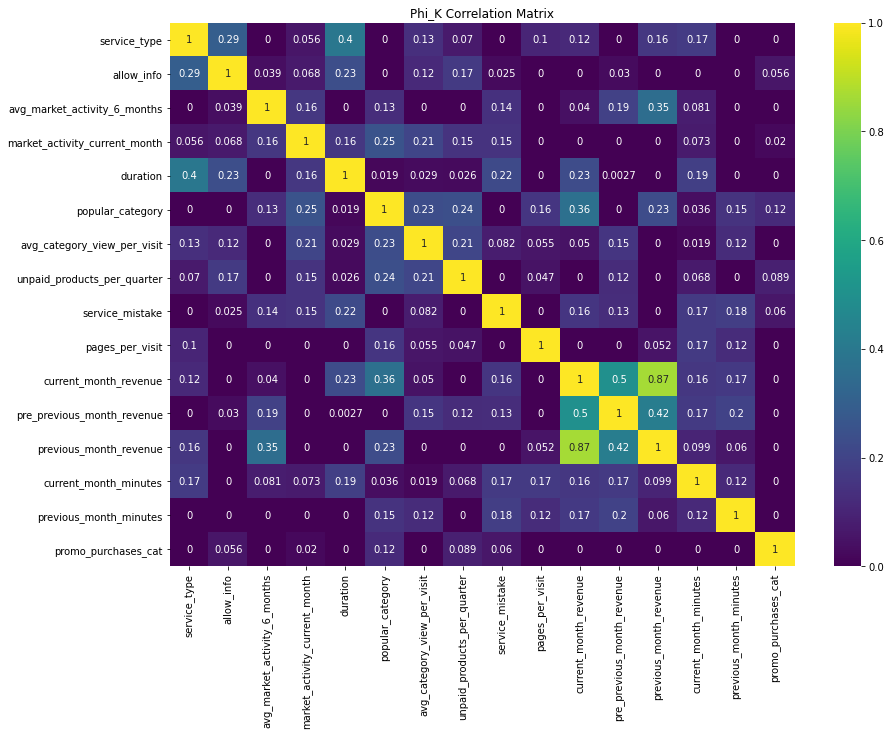

In [145]:
# Матрица корреляции Фи прежней покупательской активности (промо-покупки категориальные)

fig, ax = plt.subplots(figsize=(14, 10))

sns.heatmap(market_total.drop(['id', 'promotional_purchases'], axis=1).query('consumer_activity == "previous_level"'
    ).phik_matrix(verbose=False), annot=True, cmap='viridis')

plt.title('Phi_K Correlation Matrix');

#, 'promo_purchases_cat'
#, 'promotional_purchases'

Здесь в основном выделяются показатели выручки, времени регистрации на сайте, маркетинговая активность за 6 мес. (и меньше за тек. мес), популярные товарные категории.

Not enough unique value for variable consumer_activity for analysis 1. Dropping this column


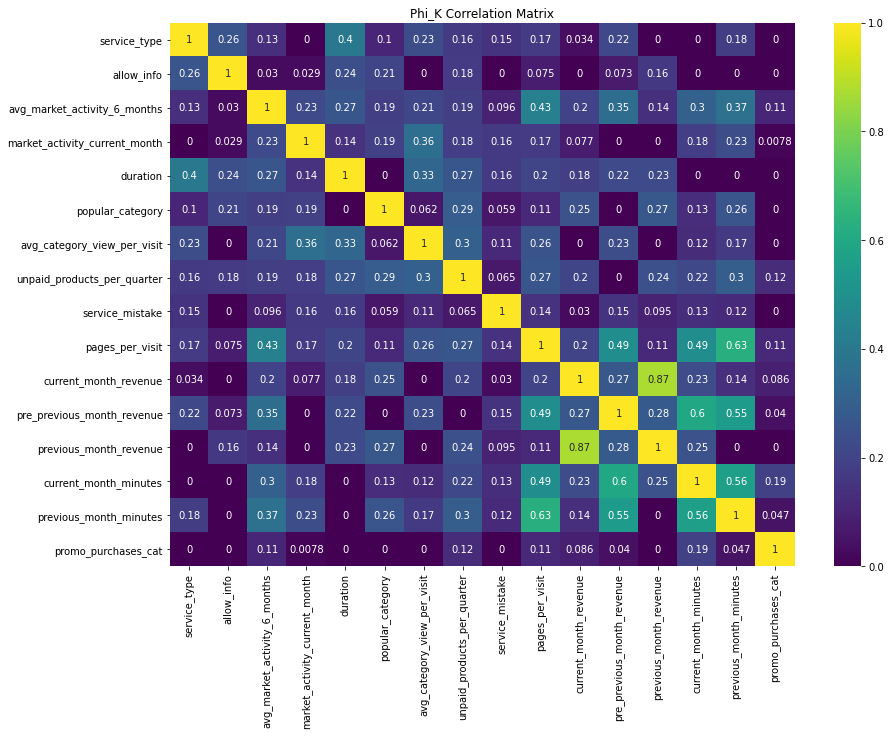

In [146]:
# Матрица корреляции Фи при снизившейся покупательской активности (промо-покупки категориальные)

fig, ax = plt.subplots(figsize=(14, 10))

sns.heatmap(market_total.drop(['id', 'promotional_purchases'], axis=1).query('consumer_activity == "decreased"'
    ).phik_matrix(verbose=False), annot=True, cmap='viridis')

plt.title('Phi_K Correlation Matrix');

#, 'promotional_purchases'

Здесь отметим показатели выручки за предыдущий и пред-предыдущий месяцы, просмотренные за визит страницы и категории, минуты на сайте в тек.мес. и предыдущем мес., маркетинговая активность за 6 мес и продолжительность регистрации на сайте.

В целом здесь можно отметить больше зависимостей, чем при сохраняющейся покупательской активности.

p.s. Если брать исходный признак промо покупок, то возникает мультиколлинеарность с выручкой 0,9. При категориальных промо-покупках мультиколлинеарность пропадает.

**Вывод:**

Явной прямой линейной взаимосвязи признаков не выявлено. 

В целом мультиколлинеарность как таковая не проявляется. (Кроме созданных категориальных признаков в связке с исхдными - но их мы будем рассматривать по очереди).
Показатели выручки текущего и предыдущего месяцев приближаются к мультиколлинеарности - коэффицинет Фи = 0,87, но все же это ниже значимой границы (0,9).

Ситуация меняется при анализе признаков отдельно для 2-х категорий целевого признака.
В категории снижение покупательской активности выявляется мультиколлинеарность промо-покупок и выручки пред-предыдущего месяца - коэффициент = 0,9.

Однако мультиколлинеарность уходит, если взять категориальные промо-покупки. 

В обеих группах высокая взаимосвязь показателей выручки (взаимосвязаны текущий и предыдущий месяцы, предыдущий и пред-предыдущий), но значение коэффициента корреляции 0,73 - 0,75.

## Шаг 6. Использование пайплайнов

Для начала посмотрим, есть ли дисбаланс классов в целевом признаке.

In [147]:
# В % от обещго числа наблюдейний

market_total['consumer_activity'].value_counts(normalize=True)

previous_level   0.62
decreased        0.38
Name: consumer_activity, dtype: float64

класса decreased на одну треть меньше, чем previous_level.

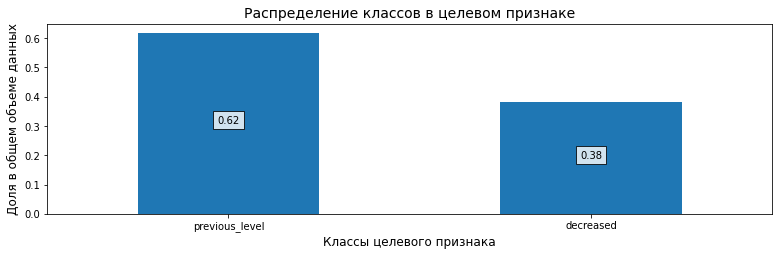

In [148]:
# Посмотрим это на графике:

fig, axs = plt.subplots( figsize=(13,3.5))
market_total['consumer_activity'].value_counts(normalize=True).plot(kind='bar',  rot=0)
plot_lables('Распределение классов в целевом признаке','Классы целевого признака' ,'Доля в общем объеме данных' )

for i in range(market_total['consumer_activity'].nunique()):
        plt.text(i,market_total['consumer_activity'].value_counts(normalize=True)[i]/2, 
                 round(market_total['consumer_activity'].value_counts(normalize=True)[i],2), ha = 'center', 
                 bbox = dict(facecolor = 'white', alpha =0.8))     

plt.show();

Создадим функцию для разбиения датасета на тренировочную и тестовую выборки.

In [149]:
# Создадим функцию для разделения датасета на выборки

def data_split(df, target, drop_columns):
    
    X = df.drop(columns=drop_columns, axis=1)
    y = df[target]
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42, stratify=y)
    
    # Для разбивки на 3 выборки, раскомментировать:
    #X_train, y_train, X_test_valid, y_test_valid = train_test_split(X, y, test_size=0.4, random_state=42, stratify=y)
    #X_val,X_test,y_val,y_test = train_test_split(X_test_valid,y_test_valid,test_size=0.5,random_state=42,stratify=y_test_valid)
    
    return X_train, X_test, y_train, y_test

In [150]:
# Определим целевой признак и признаки, которые нужно исключить из анализа
# Для первого рассмотрения модели исключим также признак промо-покупок, чтобы избежать мультиколлинеарности

target = 'consumer_activity'
drop_columns = ['consumer_activity', 'id', 'promotional_purchases']

In [151]:
# Применим функцию

X_train, X_test, y_train, y_test = data_split(market_total, target, drop_columns)

In [152]:
# Проверим размер выборок

print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(972, 16) (972,) (325, 16) (325,)


In [153]:
# Закодируем целевой признак

label_encoder = LabelEncoder()

y_train = label_encoder.fit_transform(y_train)
y_test = label_encoder.transform(y_test)

In [154]:
label_encoder.classes_

array(['decreased', 'previous_level'], dtype=object)

In [155]:
y_train.shape

(972,)

In [156]:
y_test.shape

(325,)

Проверим модель на адекватность с помощью dummy_model

In [157]:
# Создадим функцию для расчета и вывода метрик модели

def model_metrics(y_type, y_true, y_pred, y_proba=[]):
    print(f'Метрики на {y_type} выборке:', '\n')
    print(f'ROC-AUC: {round(roc_auc_score(y_true, y_proba),4)}')
    #print(f'F1_score: {round(f1_score(y_true, y_pred),4)}')
    #print(f'Accuracy: {round(accuracy_score(y_true, y_pred),4)}')
    #print(f'Precision: {round(precision_score(y_true, y_pred),4)}')

Обощенную оценку, с учетом работы модели при всех возможных значениях порогов классификации, дает метрика ROC-AUC.
Она будет основной метрикой оценки модели.

F1-учитывает дисбаланс классов, а также учитывает предсказания модели в ошибках 1го и 2го классов. Но нам важно в целом модель оценить.

Accuracy рассматривать не будем, тк она не учитывает дисбаланс классов, в данном случае не вполне информативна

In [158]:
# Инициализируем модель и обучим ее на тренировочной выборке

dummy_model = DummyClassifier(random_state=RANDOM_STATE)
dummy_model.fit(X_train, y_train)

DummyClassifier(random_state=42)

In [159]:
# Получим предсказание на тестовых данных

dummy_model_preds = dummy_model.predict(X_test)
dummy_model_pred_proba = dummy_model.predict_proba(X_test)[:,1]

In [160]:
model_metrics('train', y_test, dummy_model_preds, dummy_model_pred_proba)

Метрики на train выборке: 

ROC-AUC: 0.5


Dummy-model показывает крайне низкий результат.

ROC-AUC, которая наиболее взвешенно оценивает предсказания модели составляет всего 0,5.

Однако, возвращаясь, к теме дисбаланса - в нашем случае, это скорее особенность выборки. Число пользователей, у которых снизилась покупательская активность меньше, чем число пользователей с обычной покупательской активностью. 

Насколько я поняла из теории данного модуля, в таком случае (если это особенность данных и задачи) данные можно не сэмплировать.

Перейдем к пайплайну.

Для начала определим три типа колонок для кодировщиков: категориальные номинальные, категориальные порядковые и числовые.

In [161]:
# Посмотрим, какие числовые колонки отберет селектор:

num_code_cols = X_train.select_dtypes(include='number').columns
num_code_cols

Index(['avg_market_activity_6_months', 'market_activity_current_month',
       'duration', 'avg_category_view_per_visit',
       'unpaid_products_per_quarter', 'service_mistake', 'pages_per_visit',
       'current_month_revenue', 'pre_previous_month_revenue',
       'previous_month_revenue', 'current_month_minutes',
       'previous_month_minutes', 'promo_purchases_cat'],
      dtype='object')

In [162]:
X_train.select_dtypes(exclude='number').columns

Index(['service_type', 'allow_info', 'popular_category'], dtype='object')

In [163]:
# и категориальные

cat_ohe_cols = ['allow_info', 'popular_category']

In [164]:
# Категориальные порядковые
# В данном случае это будут типы сервиса, тк можно их ранжировать. 
cat_ord_cols = ['service_type']
categories = ['standard', 'premium']

Добавляем кодирование качественных номинальных признаков спомощью OneHotEncoder. Пропуски заполняем самым частым значением с помощью SimleImputer.

In [165]:
# SimpleImputer + OHE

ohe_pipe = Pipeline([('simpleImputer_ohe', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),\
                     ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False)),

                    ]) 

Добавляем кодирование качественных порядковых признаков с помощью OrdinalEncoder. Пропуски до и после кодирования также заполняем самым частым значением с помощью SimleImputer.

In [166]:
# SimpleImputer + ORD + SimpleImputer
# categories : alphabetically

ord_pipe = Pipeline([('simpleImputer_before_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
                     ('ord', OrdinalEncoder(categories=[['standard', 'premium']],
                                            handle_unknown='use_encoded_value', unknown_value=np.nan)),
                     ('simpleImputer_after_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent'))]) 

Объединим кодирование и масштабирование - ohe_pipe, ord_pipe, в пайплайн с подготовкой данных = data_preprocessor.

In [167]:
# Создаем пайплайн для обработки данных

data_preprocessor = ColumnTransformer([('ohe', ohe_pipe, cat_ohe_cols),
                                       ('ord', ord_pipe, cat_ord_cols),
                                       ('num', StandardScaler(), num_code_cols)],
                                      remainder='passthrough') 

Создадим итоговый пайплайн подготовки данных и обучения модели.

Потренируемся для начала на Логистической регрессии - как основе нашего обучения ). Она, конечно, не самая лучшая модель, при наличии выбросов в данных (а они у нас есть), но она будет отправной точкой - чтобы было видно, как улучшается качество, по мере внесения изменений.

In [168]:
# Итоговый пайплайн: подготовка данных и модель (возьмем пока что Логистическую Регрессию)

pipe_final = Pipeline([('preprocessor', data_preprocessor),
                       ('models', LogisticRegression(random_state=RANDOM_STATE, max_iter=200))]) 

In [169]:
X_train.shape

(972, 16)

In [170]:
y_train.shape

(972,)

In [171]:
# Обучим модель

pipe_final.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['allow_info',
                                                   'popular_category']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                                                                   SimpleImp...
                                                  Index(['avg_market_activity_6_months', 'market_activity_current_month',
       'duration', 'avg_category_view_per_visit',
       'unpaid_products_per_quarter', 'service_mistake', 'pages_per_visit',
       'current_month_revenue', 'pre_previous_month_revenue',
       'previous_month_revenue', 'current_month_minutes',
       'previous_month_minutes', 'promo_purchases_cat'],
      dtype='object'))])),
                ('models', LogisticRegression(max_iter=200, random_state=42))])

Для устранения дисбаланса, добавим параметр class_weight='balanced'

In [172]:
# Логистическая Регрессия + взвешивание классов

pipe_final = Pipeline([('preprocessor', data_preprocessor),
                       ('models', LogisticRegression(class_weight='balanced', random_state=RANDOM_STATE, max_iter=100))]) 

In [173]:
# Обучим модель

pipe_final.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['allow_info',
                                                   'popular_category']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                                                                   SimpleImp...
                                                  Index(['avg_market_activity_6_months', 'market_activity_current_month',
       'duration', 'avg_category_view_per_visit',
       'unpaid_products_per_quarter', 'service_mistake', 'pages_per_visit',
       'current_month_revenue', 'pre_previous_month_revenue',
       'previous_month_revenue', 'current_month_minutes',
       'previous_month_minutes', 'promo_purchases_cat'],
      dtype='object'))])),
                ('models',
                 LogisticRegression(class_weight='balanced', random_state=42))])

In [174]:
# Получим предсказания и метрики на выборке со взвешенными классами

y_train_class_pred = pipe_final.predict(X_train)
y_train_class_proba = pipe_final.predict_proba(X_train)[:,1]

model_metrics("train + взвешенные классы", y_train, y_train_class_pred, y_train_class_proba)

Метрики на train + взвешенные классы выборке: 

ROC-AUC: 0.9171


Метрика ROC-AUC повысились, тк модель учитывает дисбаланс классов, в целом работает лучше.

In [175]:
# Сохраним тренировочную и тестовую выборку со взвешенными классами с закодированными колонками

X_train_pre = pd.DataFrame(data_preprocessor.fit_transform(X_train), columns=data_preprocessor.get_feature_names_out())
X_test_pre = pd.DataFrame(data_preprocessor.transform(X_test), columns=data_preprocessor.get_feature_names_out())

Перейдем к подбору параметров и самой модели.

Зафиксируем гиперпараметры для поиска лучшей модели

In [176]:
# Зададим гиперпараметры пайплайна

param_grid = [
    # словарь для модели DecisionTreeClassifier()
    {
        'models': [DecisionTreeClassifier(random_state=RANDOM_STATE, 
                                          class_weight='balanced'
                                         )],
        'models__max_depth': range(1,15),
        #'models__min_samples_leaf': range(1, 15),
        #'models__min_samples_split': range(2, 15),
        'models__max_features': range(2, 15),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough']  
    },
    
    # словарь для модели KNeighborsClassifier() 
    {
        'models': [KNeighborsClassifier()],
        'models__n_neighbors': range(1,15),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough']   
    },
    # словарь для модели SVC()
    {
        'models': [SVC(random_state=RANDOM_STATE, 
                       class_weight='balanced'
                      )],
        'models__kernel': ['linear', 'rbf', 'sigmoid'],
        #'models__degree': [0, 1, 2, 3, 4],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough']  

    },
    # словарь для модели LogisticRegression()
    {
        'models': [LogisticRegression(random_state=RANDOM_STATE, 
                                      class_weight='balanced'
                                     )],     
        'models__solver': ['liblinear', 'saga'], 
        'models__penalty': ['l1'],
        'models__C': range(1,7),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough']  
    }
]

Подберем лучшую модель с помощью RandomizedSearchCV. Это будет относительно быстро, но варианты не все будут рассмотрены.

In [177]:
randomized_search = RandomizedSearchCV(
    pipe_final, 
    param_grid, 
    scoring = 'roc_auc', 
    random_state=RANDOM_STATE, 
    n_jobs=-1
)
randomized_search.fit(X_train, y_train) 

RandomizedSearchCV(estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('ohe',
                                                                               Pipeline(steps=[('simpleImputer_ohe',
                                                                                                SimpleImputer(strategy='most_frequent')),
                                                                                               ('ohe',
                                                                                                OneHotEncoder(drop='first',
                                                                                                              handle_unknown='ignore',
                                                                                                              sparse_output=False))]),
                                                                               ['allow_info',
                                                                                'popular_category']),
                                                                              ('ord',
                                                                               Pipeline(steps=[('simple...
                                         'preprocessor__num': [StandardScaler(),
                                                               MinMaxScaler(),
                                                               RobustScaler(),
                                                               'passthrough']},
                                        {'models': [LogisticRegression(class_weight='balanced',
                                                                       random_state=42)],
                                         'models__C': range(1, 7),
                                         'models__penalty': ['l1'],
                                         'models__solver': ['liblinear',
                                                            'saga'],
                                         'preprocessor__num': [StandardScaler(),
                                                               MinMaxScaler(),
                                                               RobustScaler(),
                                                               'passthrough']}],
                   random_state=42, scoring='roc_auc')

In [178]:
print('Метрика ROC-AUC для лучшей модели:\n', round(randomized_search.best_score_,4))
print('\nЛучшая модель и её параметры:\n\n', randomized_search.best_estimator_)

Метрика ROC-AUC для лучшей модели:
 0.905

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['allow_info',
                                                   'popular_category']),
                                                 ('ord',
  

In [179]:
pd.DataFrame(randomized_search.cv_results_).sort_values(by='rank_test_score').head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_preprocessor__num,param_models__max_features,param_models__max_depth,param_models,param_models__n_neighbors,param_models__solver,param_models__penalty,param_models__C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
6,0.03,0.00,0.01,0.00,MinMaxScaler(),NaN,NaN,"LogisticRegression(class_weight='balanced', ra...",NaN,liblinear,l1,1,"{'preprocessor__num': MinMaxScaler(), 'models_...",0.89,0.89,0.92,0.92,0.90,0.91,0.01,1
3,0.04,0.04,0.04,0.04,MinMaxScaler(),NaN,NaN,KNeighborsClassifier(),3,NaN,NaN,NaN,"{'preprocessor__num': MinMaxScaler(), 'models_...",0.88,0.85,0.85,0.86,0.86,0.86,0.01,2
5,0.01,0.00,0.01,0.00,passthrough,11,5,DecisionTreeClassifier(class_weight='balanced'...,NaN,NaN,NaN,NaN,"{'preprocessor__num': 'passthrough', 'models__...",0.78,0.85,0.86,0.85,0.83,0.84,0.03,3
1,0.01,0.00,0.01,0.00,passthrough,3,5,DecisionTreeClassifier(class_weight='balanced'...,NaN,NaN,NaN,NaN,"{'preprocessor__num': 'passthrough', 'models__...",0.79,0.81,0.82,0.87,0.81,0.82,0.03,4
2,0.02,0.00,0.01,0.00,RobustScaler(),14,12,DecisionTreeClassifier(class_weight='balanced'...,NaN,NaN,NaN,NaN,"{'preprocessor__num': RobustScaler(), 'models_...",0.75,0.79,0.81,0.82,0.83,0.80,0.03,5


Здесь получилась модель LogisticRegression+MinMaxScaler (C=1, class_weight='balanced', penalty='l1', random_state=42, solver='liblinear') 

с метрикой 0,905

In [180]:
#randomized_search.best_estimator_

In [181]:
# Выведем параметры лучшей модели

randomized_search.best_estimator_._final_estimator

LogisticRegression(C=1, class_weight='balanced', penalty='l1', random_state=42,
                   solver='liblinear')

<div style="background: #d8eff2; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    <font color='4682B5'><u><b>КОММЕНТАРИЙ СТУДЕНТА</b></u></font>
    <br />
    <font color='4682B5'> Дальше GridSearchCV - закомменитированные ячейки, потому что очень долго, и постоянно отваливается
</div>

<div class="alert alert-warning">
<b>Комментарий 👉</b>

Если модель обучается слишком долго, всегда можно немного подсократить ее. Это лучше чем или оставлять незавершенный вариант или ждать окончания расчета несколько часов (а потом в итоге всё-равно прервать расчет). Советы:

1. Можно уменьшить количество параметров для поиска

2. Не всегда надо упираться в грид и делать полный перебор. Посмотри в сторону [RandomizedSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.RandomizedSearchCV.html)

3. У катбуста есть свой подбор параметров [grid_search](https://catboost.ai/en/docs/concepts/python-reference_catboost_grid_search) и [randomized_search](https://catboost.ai/en/docs/concepts/python-reference_catboost_randomized_search)
</div>

Попробую все же и грид запустить, хоть он и очень время-затратный.

grid = GridSearchCV(
    pipe_final,
    param_grid,
    n_jobs=-1,
    cv=5,
    scoring='roc_auc'
)

grid.fit(X_train, y_train) 

print('Метрика ROC-AUC для лучшей модели:\n', round(grid.best_score_,4))
print('\nЛучшая модель и её параметры:\n\n', grid.best_estimator_)

param_grid_scv = [
    # словарь для модели SVC()
    {
        'models': [SVC(random_state=RANDOM_STATE, 
                       #class_weight='balanced'
                      )],
        'models__kernel': ['rbf'],
        #'models__degree': [0, 1, 2],
        'preprocessor__num': [ MinMaxScaler(), RobustScaler(), 'passthrough']  

    }
]

#'linear', 'rbf', 'sigmoid', 
#StandardScaler(),

grid_scv = GridSearchCV(
    pipe_final,
    param_grid,
    n_jobs=-1,
    cv=5,
    scoring='roc_auc'
)

grid_scv.fit(X_train, y_train) 

print('Метрика ROC-AUC для лучшей модели:\n', round(grid_scv.best_score_,4))
print('\nЛучшая модель и её параметры:\n\n', grid_scv.best_estimator_)

#результат работы грид - но это очень долго и с бесконечным списком ошибок
print('Метрика ROC-AUC для лучшей модели:\n', round(grid_scv.best_score_,4))
print('\nЛучшая модель и её параметры:\n\n', grid_scv.best_estimator_)

Метрика ROC-AUC для лучшей модели:
 0.9223

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 sparse_output=False))]),
                                                  Index(['service_type', 'allow_info', 'popular_category'], dtype='object')),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_o...
                                                  Index(['avg_market_activity_6_months', 'market_activity_current_month',
       'duration', 'promotional_purchases', 'avg_category_view_per_visit',
       'unpaid_products_per_quarter', 'service_mistake', 'pages_per_visit',
       'current_month_revenue', 'previous_month_revenue',
       'pre_previous_month_revenue', 'current_month_minutes',
       'previous_month_minutes'],
      dtype='object'))])),
                ('models', SVC(class_weight='balanced', random_state=42))])
                
grid.best_estimator_._final_estimator.classes_
#Индексы векторов
#grid.best_estimator_._final_estimator.support_
#Векторы
#grid.best_estimator_._final_estimator.support_vectors_
#Количество опорных векторов для каждого класса
grid.best_estimator_._final_estimator.n_support_
#коэффициенты опорных векторов в решающей функции.
grid.best_estimator_._final_estimator.dual_coef_


<div style="background: #d8eff2; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    <font color='4682B5'><u><b>КОММЕНТАРИЙ СТУДЕНТА</b></u></font>
    <br />
    <font color='4682B5'> ... в итоге GridSearchCV подобрал SVC (class_weight='balanced', random_state=42). Но добавлять его в код я не буду, чтобы время не тратить

**Вывод:**

Поиск лучшей модели с использованием RandomizedSearchCV и гиперпарамертов, выдал LogisticRegression(C=1, lass_weight='balanced', penalty='l1', random_state=42, solver='liblinear'). 

Метрика roc_auc составляет 0,905.

<div class="alert alert-success">
<b>ОТЛИЧНО! 👍</b>

Раздел - СУПЕР! Пайплайны, транфсофрмеры - современный технологичный способ упаковки кода моделей и подбора гиперпараметров (ГП). Метрика проекта также выбрана (правда её использование не обосновано).
</div>

## Шаг 7. Анализ важности признаков

Перейдем к анализу признаков модели.

In [182]:
# Сохраним тренировочную выборку с закодированными колонками

X_train_pre = pd.DataFrame(data_preprocessor.fit_transform(X_train), columns=data_preprocessor.get_feature_names_out())
X_test_pre = pd.DataFrame(data_preprocessor.transform(X_test), columns=data_preprocessor.get_feature_names_out())

<div class="alert alert-danger">
<b>Необходимо исправить ❌</b>

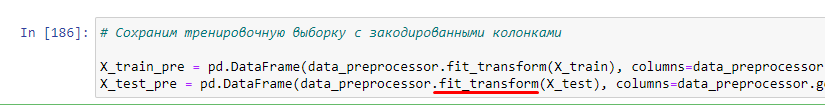
    
Точно нет.
</div>

<div style="background: #d8eff2; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    <font color='4682B5'><u><b>КОММЕНТАРИЙ СТУДЕНТА</b></u></font>
    <br />
    <font color='4682B5'> ... моя "любимая" ошибка... исправила

<div class="alert alert-success">
<b>КОММЕНТАРИЙ V2</b> 	

Ничего страшного Светлана, бывает. Самое главное что её исправить легко при этом.
</div>

In [183]:
#Выведем коэффициенты модели
#randomized_search.best_estimator_._final_estimator.coef_[0]

In [184]:
#Названия колонок
#X_train_pre.columns

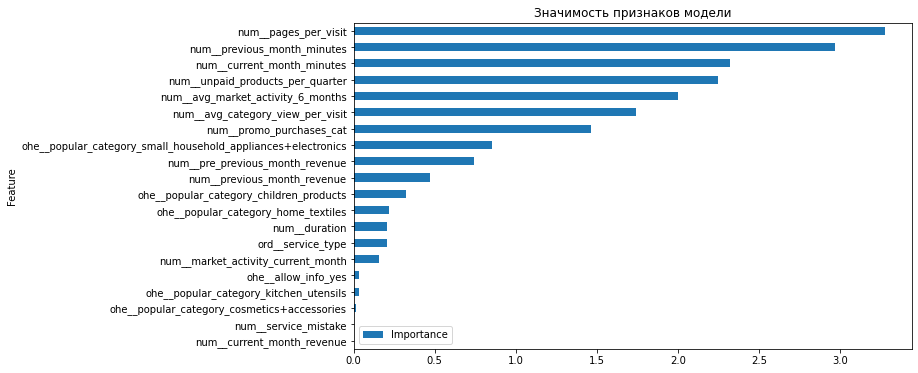

In [185]:
# Посмотрим на значимость признаков модели на графике

feature_importance = pd.DataFrame({'Feature': X_train_pre.columns, 'Importance': 
                                   np.abs(randomized_search.best_estimator_._final_estimator.coef_[0])})
feature_importance = feature_importance.sort_values('Importance', ascending=True)
feature_importance.plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6))
plt.title("Значимость признаков модели");

<div class="alert alert-success">
<b>ОТЛИЧНО! 👍</b>

Молодец, здесь ты делаешь то, что я редко обычно встречаю в проектах (я про визуализацию признаков, которые модель "посчитала" важными. Почему их анализ важен и полезен (несколько причин, почему важно тщательно "рассматривать" признаки):

1. **Информативность**: Признаки содержат информацию, которая помогает модели делать предсказания. Некоторые признаки могут быть более информативными, чем другие, и могут иметь сильное влияние на результаты модели. Понимание, какие признаки являются наиболее информативными, поможет сосредоточить усилия на сборе и анализе этих признаков, что в конечном итоге может привести к лучшим предсказаниям модели.

2. **Устранение шума и избыточности**: Некоторые признаки могут содержать шумовую или избыточную информацию, которая может негативно повлиять на работу модели. Анализ и отсев таких признаков помогут улучшить качество модели, устранить возможное переобучение и улучшить ее способность обобщать данные.

3. **Раскрытие взаимосвязей**: Изучение признаков может помочь обнаружить скрытые взаимосвязи и зависимости в данных. Например, два признака могут быть слабо информативными сами по себе, но в комбинации могут образовывать сильный предиктор. Исследование и понимание взаимосвязей между признаками может привести к созданию более сложных, но более мощных моделей.

4. **Сокращение размерности**: Некоторые наборы данных могут содержать большое количество признаков, и это может стать проблемой для обучения моделей. Сокращение размерности путем отбора наиболее важных признаков позволяет сократить вычислительную сложность, снизить вероятность переобучения и улучшить интерпретируемость модели.

5. **Интерпретируемость**: Понимание важности признаков также помогает интерпретировать результаты модели. Если мы знаем, какие признаки оказывают наибольшее влияние на предсказания, мы можем сделать более осознанные выводы и принимать меры на основе результатов   
</div>


In [186]:
# Определим наименее важные признаки (значимость меньше 0,02)

features_to_drop = feature_importance[feature_importance['Importance'] < 0.02]['Feature'].to_list() 
features_to_drop

['num__current_month_revenue',
 'num__service_mistake',
 'ohe__popular_category_cosmetics+accessories']

In [187]:
# Удалим их из тренировочной и тестовой выборок

X_train_less_features = X_train_pre.drop(features_to_drop, axis=1)
X_test_less_features = X_test_pre.drop(features_to_drop, axis=1)

In [188]:
# Определим модель, как лучший вариант из рассмотренных

lr_model_less_features = randomized_search.best_estimator_._final_estimator

In [189]:
# Обучим модель на данных, за вычетом наименее важных признаков

lr_model_less_features.fit(X_train_less_features, y_train)

LogisticRegression(C=1, class_weight='balanced', penalty='l1', random_state=42,
                   solver='liblinear')

In [190]:
# Получим предсказание модели для тестовой выборки

y_test_less_features_pred = lr_model_less_features.predict(X_test_less_features)
y_test_less_features_proba = lr_model_less_features.predict_proba(X_test_less_features)[:,1]

In [191]:
model_metrics("lr_model (less features)", y_test, y_test_less_features_pred, y_test_less_features_proba)

Метрики на lr_model (less features) выборке: 

ROC-AUC: 0.8804


ROC_AUC стала меньше. При сравнении с метрикой на тренировочной выборке получаем смещение 12 и разброс 2. Модель можно улучшить, если дообучить ее на дополнительных данных, например.

L1 регуляризацию признаков мы уже применили при подборе модели. Также как бинаризацию исходного признака промо-покупок. Выше мы удалили наименее значимые с точки зрения модели признаки, с весами менее 0,02.

In [192]:
# Еще раз зафиксируем лучшую модель 

lr_model = randomized_search.best_estimator_._final_estimator

Применим селектор, посмотрим, что получится

In [193]:
# выбор селектора с нужными параметрами

selector = SelectKBest(f_classif, k=2)

# создание нового набора данных (два наиболее важных признака из выборки)

X_train_new = selector.fit_transform(X_train_pre, y_train)
X_test_new = selector.fit_transform(X_test_pre, y_test) 

In [194]:
lr_model.fit(X_train_new, y_train)

LogisticRegression(C=1, class_weight='balanced', penalty='l1', random_state=42,
                   solver='liblinear')

In [195]:
y_test_new_pred = lr_model.predict(X_test_new)
y_test_new_proba = lr_model.predict_proba(X_test_new)[:,1]
model_metrics("lr_model + Selector", y_test, y_test_new_pred, y_test_new_proba)

Метрики на lr_model + Selector выборке: 

ROC-AUC: 0.8243


Этот метод точно не подходит - Метрики сильно снизились

In [196]:
# Рассмотрим полиномизацию

poly = PolynomialFeatures(2)

X_train_poly = poly.fit_transform(X_train_pre)
X_test_poly = poly.transform(X_test_pre)

In [197]:
lr_model.fit(X_train_poly, y_train)

LogisticRegression(C=1, class_weight='balanced', penalty='l1', random_state=42,
                   solver='liblinear')

In [198]:
y_test_poly_pred = lr_model.predict(X_test_poly)
y_test_poly_proba = lr_model.predict_proba(X_test_poly)[:,1]
model_metrics("lr_model + Selector", y_test, y_test_poly_pred, y_test_poly_proba)

Метрики на lr_model + Selector выборке: 

ROC-AUC: 0.8781


Метрики ниже, чем в первом варианте - не самые лучшие показатели.

Полагаю, стоит остановиться на первом варианте - с подбором признаков по значимости весов.

Перейдем к анализу отобранных признаков

In [199]:
lr_model_less_features.fit(X_train_less_features, y_train)

LogisticRegression(C=1, class_weight='balanced', penalty='l1', random_state=42,
                   solver='liblinear')

In [200]:
explainer = shap.LinearExplainer(lr_model_less_features, X_train_less_features)
shap_values = explainer(X_train_less_features)

<div class="alert alert-success">
<b>ОТЛИЧНО! 👍</b>

О, shap используешь. СУПЕР. "В жизни" редко его встречаю. Обычно feature_importances все оперируют. МОЛОДЕЦ!

---
Графики SHAP предоставляют визуальное объяснение влияния каждого признака на модель. Вот некоторые ключевые типы графиков SHAP и их интерпретация:

1. **Summary Plot (Общий график):**

* Главная цель этого графика - показать вклад каждого признака в прогнозы модели.
* График показывает каждый признак на оси X, где точка на графике представляет вклад этого признака в прогноз.
* Положительные значения указывают, что большее значение этого признака повышает прогноз, отрицательные - понижает.

2. **Force Plot (График силы влияния):**

* Позволяет увидеть, как каждый признак влияет на конкретный прогноз.
* Визуализирует SHAP-значения для каждого признака для определенной точки данных и как они влияют на прогноз.

3. **Dependence Plot (График зависимости):**

* Показывает взаимосвязь между значением конкретного признака и предсказанием модели.
* Позволяет увидеть, как меняется предсказание при изменении значения одного признака, при условии, что остальные признаки фиксированы.

4. **Waterfall Plot (График водопада):**

*Представляет изменения от базового прогноза до конечного прогноза для каждого наблюдения.

* Показывает влияние каждого признака на изменение прогноза относительно базового значения.

5. **Interaction Value Plot (График взаимодействия):**

* Позволяет увидеть, как взаимодействие между двумя признаками влияет на прогноз.
* Он показывает, как изменения значений двух признаков влияют на SHAP-значения.

Когда рассматриваешь графики SHAP, обрати внимание на направление и величину влияния каждого признака на прогноз. Положительные значения обычно повышают прогноз, отрицательные - понижают. Важно также анализировать взаимодействия между признаками и их зависимости от целевой переменной.
</div>

Построим график общей значимости признаков:

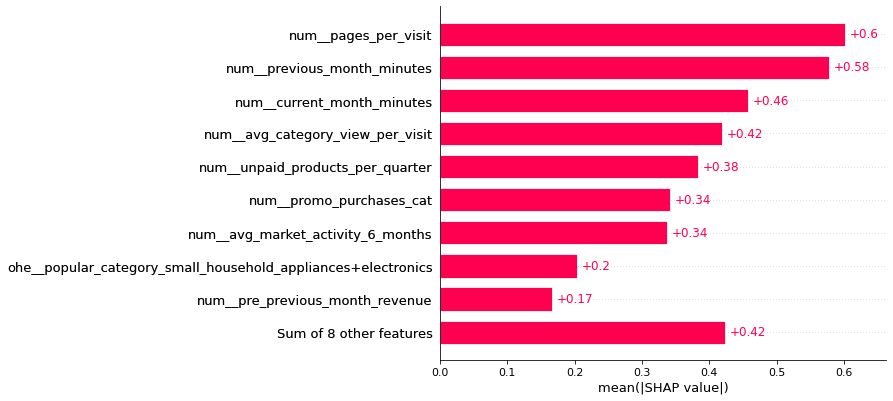

In [201]:
shap.plots.bar(shap_values) 

Наибольшую значимость представляет количество просмотренных за визит страниц, затем минуты на сайте в предыдущем месяце. Далее идут минуты на сайте в текущем месяцах, число просмотренных за визит категорий, количество неоплаченных товаров и на следующей позиции - категориальные промо-покупки и маркетинговая активность за 6 мес.

Посмотрим, как признаки влияют на каждое предсказание модели:

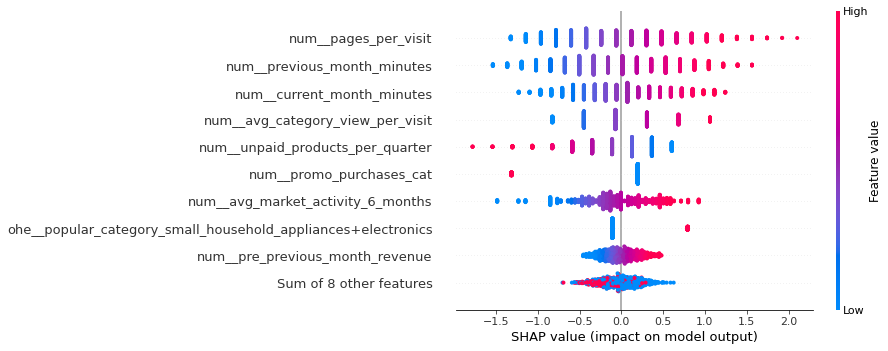

In [202]:
shap.plots.beeswarm(shap_values)

Вероятность отнесения к классу 0 (снижение активности) высока у наблюдений с высокими значениями признаков количество неоплаченных товаров за 3 мес. (от 4х и выше), и высокая доля промо-покупок (от 60%).

Вероятность отнесения к классу 1 (прежняя активность) велика у наблюдний с высокими значениями признака число просмотренных за визит страниц, число минут на сайте в предыдущий и текущий месяц, числом просмотренных за визит категорий (от 4х и выше), с высокой маркетинговой активностью за 6 мес. и с низкой долей промо-покупок (от 60%), при высоких показателях покупок мелкой бытовой техники и электроники.

Остальные признаки сгруппированы в одну общую группу. В большей степени, чем выше их значение, тем больше они влияют на отнесение наблюдения к классу 0 (снижение активности).

**Отметим, что покупатели с высокой долей промо-покупок, скорее всего снизят покупательскую активность.**

**При большоей доле покупок мелкой бытовой техники и электроники сохранится прежняя активность**

Коэффициенты отражают и обычную логику: чем больше времени человек проводит на сайте, просматривает страниц и товарных категорий, а также чем больше получает маркетинговых сообщений, тем вероятнее он что-то да присмотрит себе к покупке. 

Соответственно, если покупатель не оплачивает большое количество товаров (вероятно, возвраты), и если он уже закупил большое количество товаров по акциям (и предпочитает именно такой способ покупок), то тем меньше он будет склонен к дальнейшим покупкам.

По всем остальным признакам: чем выше показатели признака, тем вероятнее покупатель снизит активность.

<div class="alert alert-success">
<b>ОТЛИЧНО! 👍</b>

Экспертный вывод по графикам! Не просто красивые картинки построены, но описаны те моменты, которые дата-сайентист видит в них!
</div>

Чтобы посмотреть влияние признаков на каждое отдельное наблюдение, можно использовать график waterfall.

In [203]:
# Добавим значение y_test в тестовые данные

X_test_less_features['y_test'] = y_test.tolist()

In [204]:
# Добавим предсказанное значение y в тестовые данные

X_test_less_features['predict'] = y_test_less_features_pred

In [205]:
# Добавим значения вероятностей для каждого наблюдения

X_test_less_features['predict_proba'] = y_test_less_features_proba

Посмотрим, у каких наблюдений истинное значение целевого признака =1, а вероятность отнесения к классу 1 составила меньше 0,2.

In [206]:
# Выведем наблюдения и значения 2-х наиболее важных признаков

X_test_less_features[(X_test_less_features['y_test']==1)&(X_test_less_features['predict_proba']<0.2)]\
[['num__pages_per_visit','num__previous_month_minutes']] 

,num__pages_per_visit,num__previous_month_minutes
20,-0.79,0.13
83,-0.03,-0.37
109,0.22,0.13
293,-0.29,-1.12
304,-0.03,-0.37


Возьмем для примера наблюдение с индексом 293

In [207]:
# Наблюдение в выборке

X_test_less_features.iloc[20:21]

,ohe__allow_info_yes,ohe__popular_category_children_products,ohe__popular_category_home_textiles,ohe__popular_category_kitchen_utensils,ohe__popular_category_small_household_appliances+electronics,ord__service_type,num__avg_market_activity_6_months,num__market_activity_current_month,num__duration,num__avg_category_view_per_visit,num__unpaid_products_per_quarter,num__pages_per_visit,num__pre_previous_month_revenue,num__previous_month_revenue,num__current_month_minutes,num__previous_month_minutes,num__promo_purchases_cat,y_test,predict,predict_proba
20,1.00,0.00,1.00,0.00,0.00,0.00,0.63,1.39,-1.01,-0.20,0.58,-0.79,-0.30,-0.56,0.18,0.13,2.59,1,0,0.18


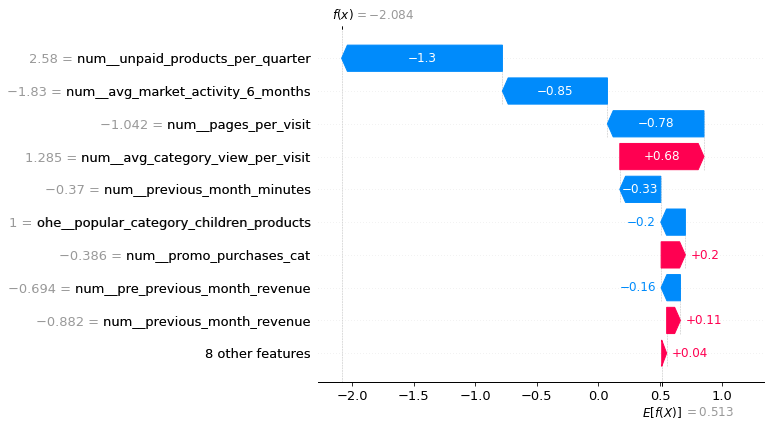

In [208]:
# График для данного наблюдения:

shap.plots.waterfall(shap_values[20]) 

В данном наблюдении 3 признака привели модель к предсказанию, что активность покупателя снизится: Число неоплаченных товаров, средняя маркетинговая активность за 6 мес и количество страниц за визит

Посмотрим на обратную ситуацию, когда модель предсказала класс 1, при истинном значении класса 0.

In [209]:
# Выведем наблюдения и значения 2-х наиболее важных признаков

X_test_less_features[(X_test_less_features['y_test']==0)&(X_test_less_features['predict_proba']>0.9)]\
[['num__pages_per_visit','num__previous_month_minutes']] 

,num__pages_per_visit,num__previous_month_minutes
13,0.97,0.38
65,2.23,-0.62
68,1.98,0.38
91,1.98,0.38
207,2.48,1.13
237,0.47,1.13


In [210]:
X_test_less_features[237:238]

,ohe__allow_info_yes,ohe__popular_category_children_products,ohe__popular_category_home_textiles,ohe__popular_category_kitchen_utensils,ohe__popular_category_small_household_appliances+electronics,ord__service_type,num__avg_market_activity_6_months,num__market_activity_current_month,num__duration,num__avg_category_view_per_visit,num__unpaid_products_per_quarter,num__pages_per_visit,num__pre_previous_month_revenue,num__previous_month_revenue,num__current_month_minutes,num__previous_month_minutes,num__promo_purchases_cat,y_test,predict,predict_proba
237,1.00,0.00,0.00,0.00,1.00,1.00,1.22,1.39,1.56,-0.20,-0.92,0.47,1.10,0.26,1.35,1.13,2.59,0,1,0.93


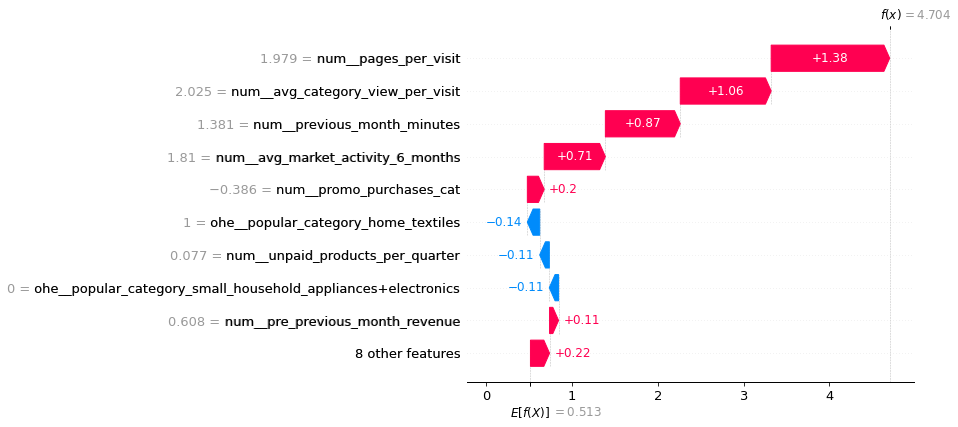

In [211]:
# График для данного наблюдения:

shap.plots.waterfall(shap_values[237]) 

В данном случае наибольшее влияние на предсказание модели оказал признак число просмотренных страниц, затем число просмотренных товарных категорий за визит, число минут на сайте в предыдущем месяце и средняя маркетинговая активность за 6 мес.

**Вывод:**

Наибольшее влияние на присвоение класса оказывает число просмотренных страниц, затем число просмотренных товарных категорий и время на сайте - показатели активности самого клиента.
затем идет число неоплаченных товаров за квартал, маркетинговая активность за 6 мес. и доля промо-товаров (категориальный признак)



## Шаг 8. Сегментация покупателей

<div class="alert alert-success">
<b>ОТЛИЧНО! 👍</b>

Сразу скажу, что в этом разделе ошибок быть не может ))) Всё потому, что грамотный и вдумчивый исследователь данных (*а ты собственно к этому моменту доказываешь, что визуализацией данных владеешь + видением трендов и закономерностей (на основе этих графиков) обладаешь*) - с почти 100%ой вероятностью **СМОЖЕТ** провести исследование групп покупателей, да и сделать конкретные предложения по работе с этими сегментами для увеличения профита Компании.
    
p.s. остальное оставлю на созвон в ТГ (чтобы долго не писать).    
</div>

Выберу группу клиентов, которые покупают мелкую бытовую технику и электронику.

### Добавление признака прибыльность клиента. Анализ взаимосвязей с учетом нового признака

Объединим основной файл с прибыльностью по клиентам

In [212]:
market_profit = market_total.merge(money, on='id')

In [213]:
# Выводим информацию о файле

market_profit.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1297 entries, 0 to 1296
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   id                             1297 non-null   int64  
 1   consumer_activity              1297 non-null   object 
 2   service_type                   1297 non-null   object 
 3   allow_info                     1297 non-null   object 
 4   avg_market_activity_6_months   1297 non-null   float64
 5   market_activity_current_month  1297 non-null   int64  
 6   duration                       1297 non-null   int64  
 7   promotional_purchases          1297 non-null   float64
 8   popular_category               1297 non-null   object 
 9   avg_category_view_per_visit    1297 non-null   int64  
 10  unpaid_products_per_quarter    1297 non-null   int64  
 11  service_mistake                1297 non-null   int64  
 12  pages_per_visit                1297 non-null   i

Добавим разницу выручки по каждой паре месяцев.

In [214]:
market_profit['revenue_diff_pre_month'] = market_profit['previous_month_revenue'] - market_profit['pre_previous_month_revenue']
market_profit['revenue_diff_curr_month'] = market_profit['current_month_revenue'] - market_profit['previous_month_revenue']

In [215]:
market_profit.head()

,id,consumer_activity,service_type,allow_info,avg_market_activity_6_months,market_activity_current_month,duration,promotional_purchases,popular_category,avg_category_view_per_visit,unpaid_products_per_quarter,service_mistake,pages_per_visit,current_month_revenue,pre_previous_month_revenue,previous_month_revenue,current_month_minutes,previous_month_minutes,promo_purchases_cat,profit,revenue_diff_pre_month,revenue_diff_curr_month
0,215349,decreased,premium,yes,4.40,4,819,0.75,children_products,4,4,2,5,4971.60,4472.00,5216.00,10,12,1,4.16,744.00,-244.40
1,215350,decreased,standard,no,4.90,3,539,0.14,home_textiles,5,2,1,5,5058.40,4826.00,5457.50,13,8,0,3.13,631.50,-399.10
2,215351,decreased,standard,yes,3.20,5,896,0.99,children_products,5,0,6,4,6610.40,4793.00,6158.00,13,11,1,4.87,1365.00,452.40
3,215352,decreased,standard,no,5.10,3,1064,0.94,children_products,3,2,3,2,5872.50,4594.00,5807.50,11,8,1,4.21,1213.50,65.00
4,215353,decreased,standard,yes,3.30,4,762,0.26,home_textiles,4,1,1,4,5388.50,5124.00,4738.50,10,10,0,3.95,-385.50,650.00


Посмотрим на распределение числовых признаков, с учетом прибыльности

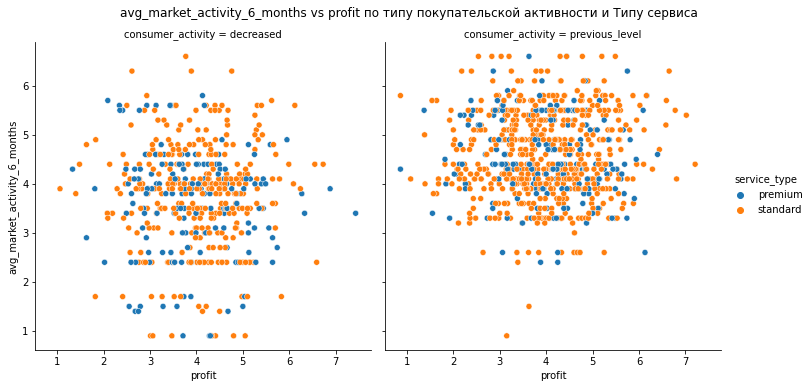

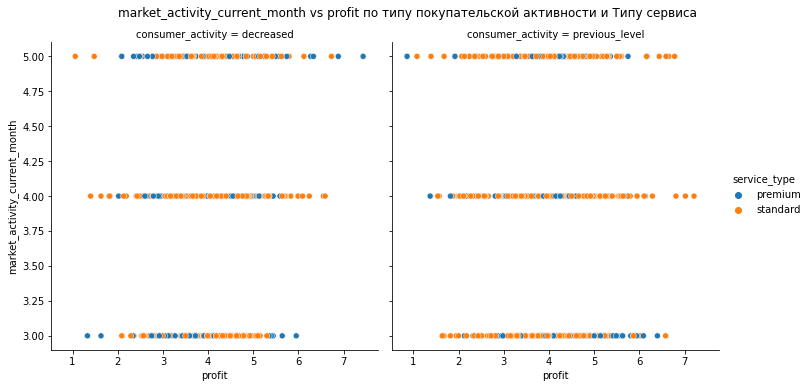

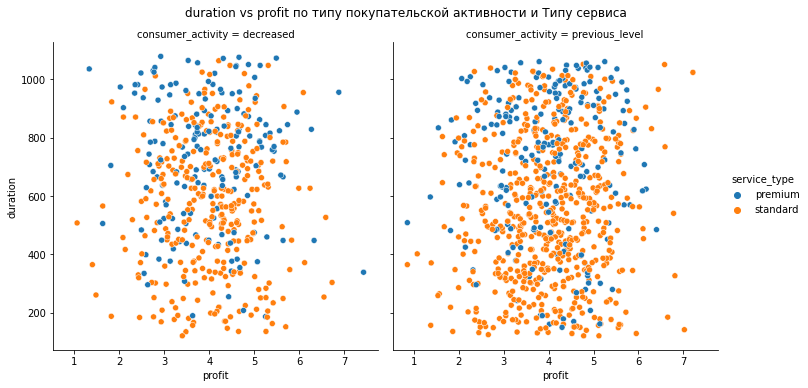

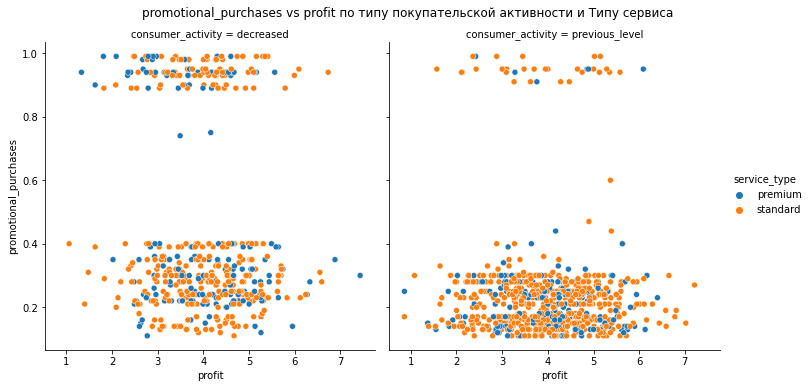

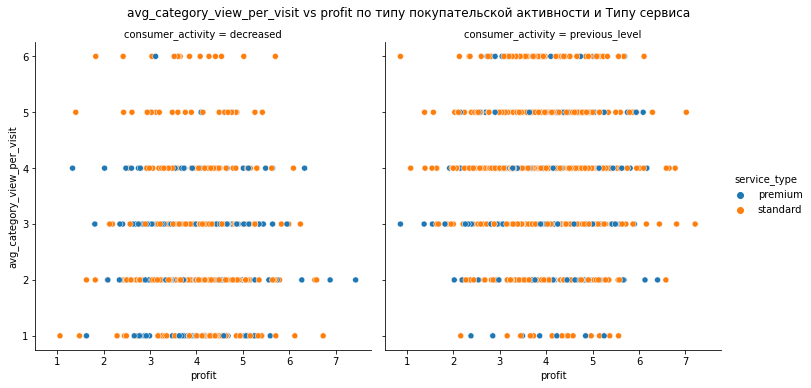

...

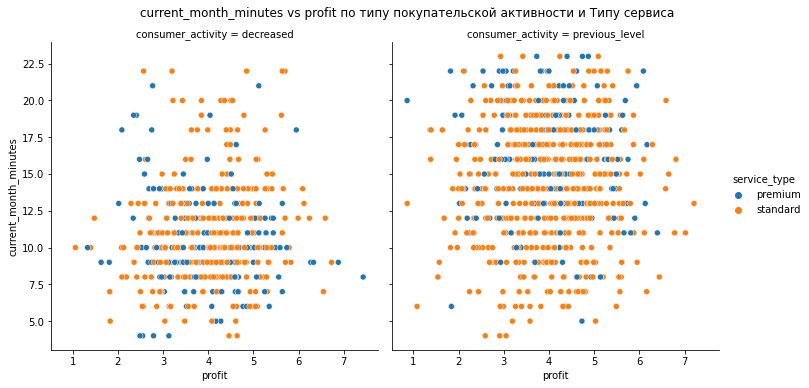

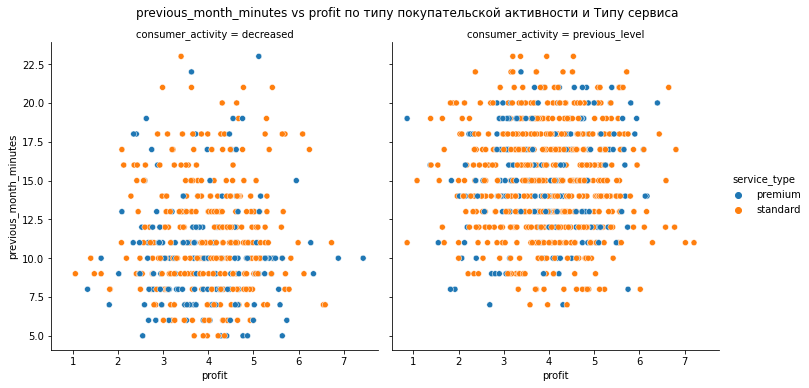

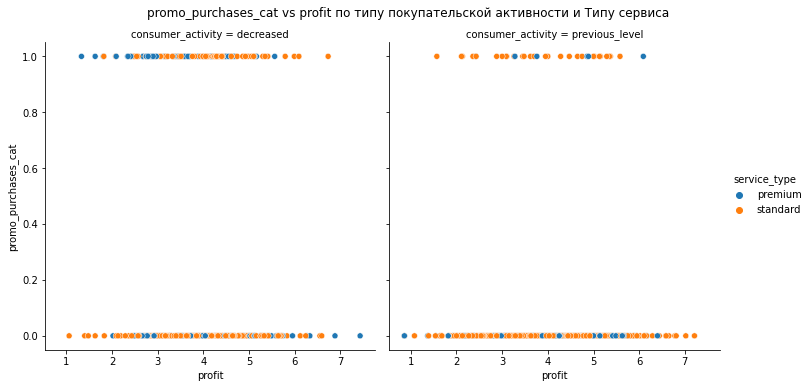

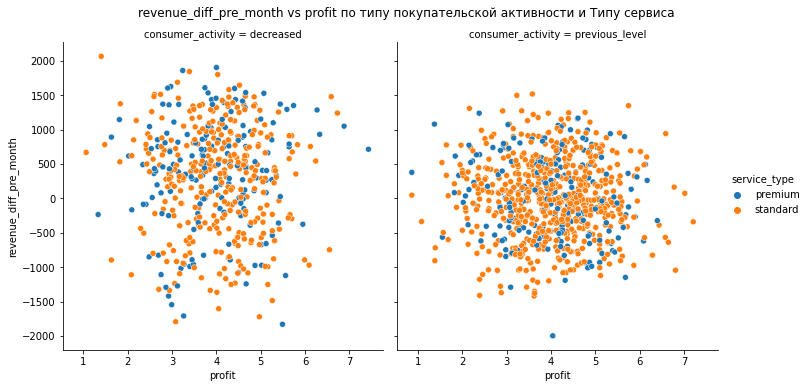

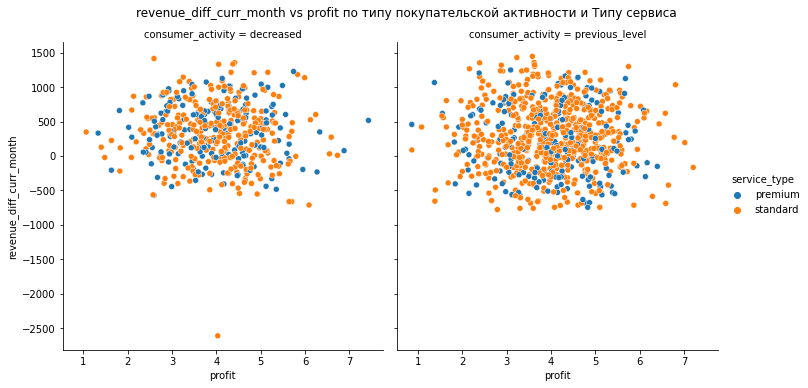

In [216]:
num_col_names = market_profit.select_dtypes(include='number').columns

for i, item in enumerate(market_profit.drop(columns=['id', 'profit', 'service_type'], axis=1).select_dtypes(include='number')):
    sns.relplot(data=market_profit, x='profit', y=item, col='consumer_activity', hue='service_type', kind='scatter',
               ).fig.suptitle(f'{item} vs profit по типу покупательской активности и Типу сервиса', y=1.03)
plt.show();

По мере увеличесния времен регистрации на сайте возрастает число пользователей с типом сервиса премиум.

Больше всего пользователей премиум в группе со снизившейся активностью и высокой долей промо-покупок.

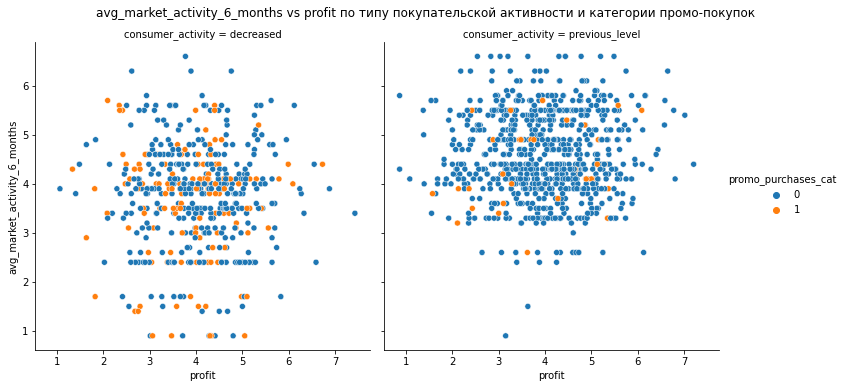

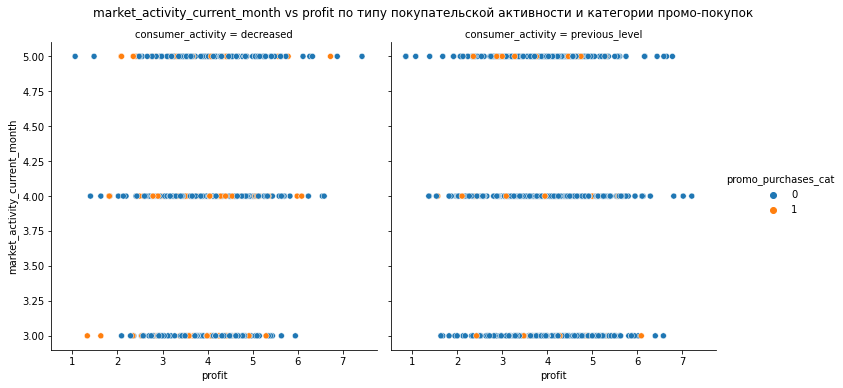

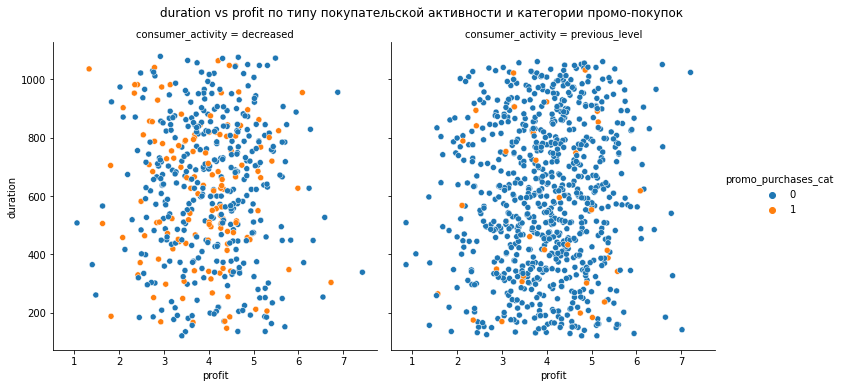

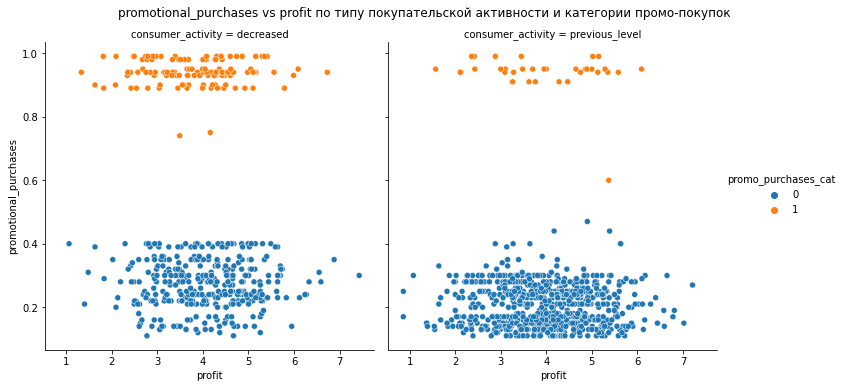

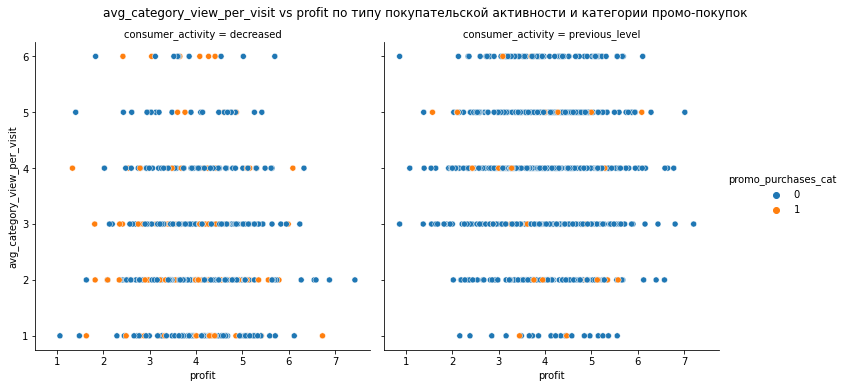

...

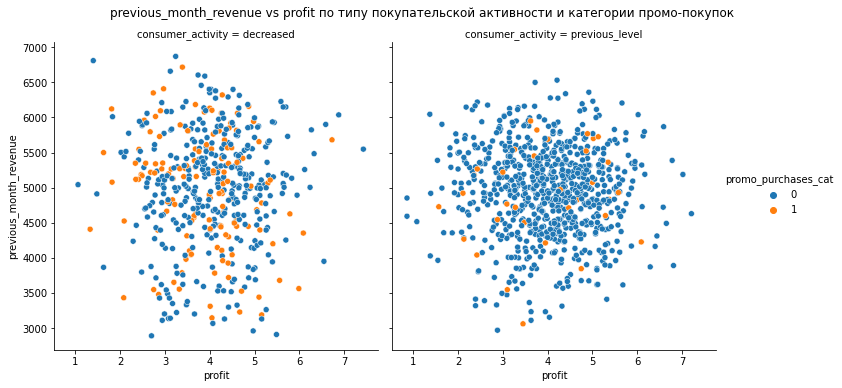

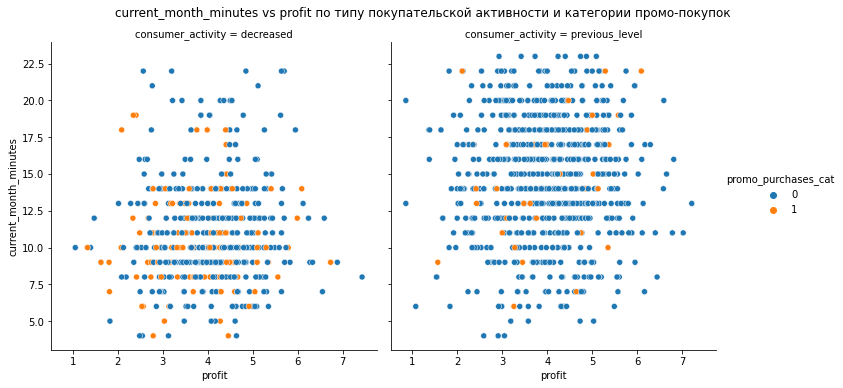

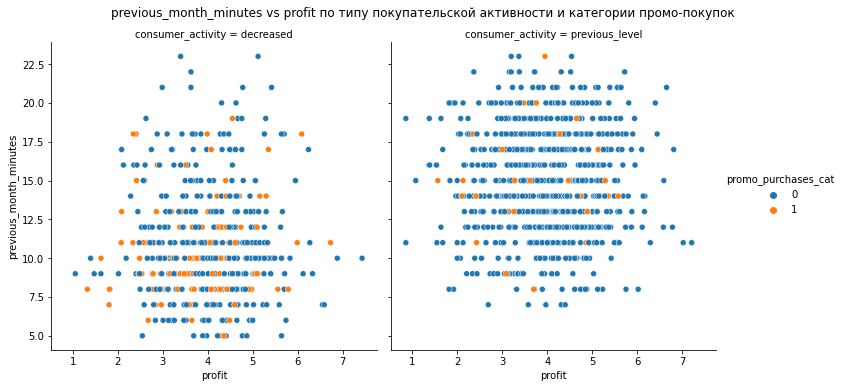

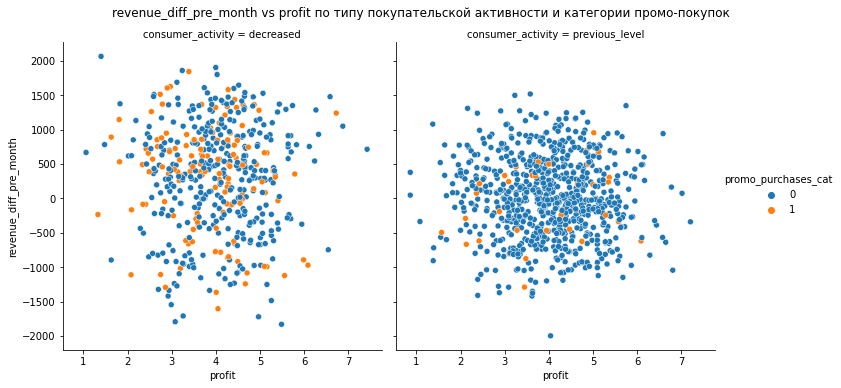

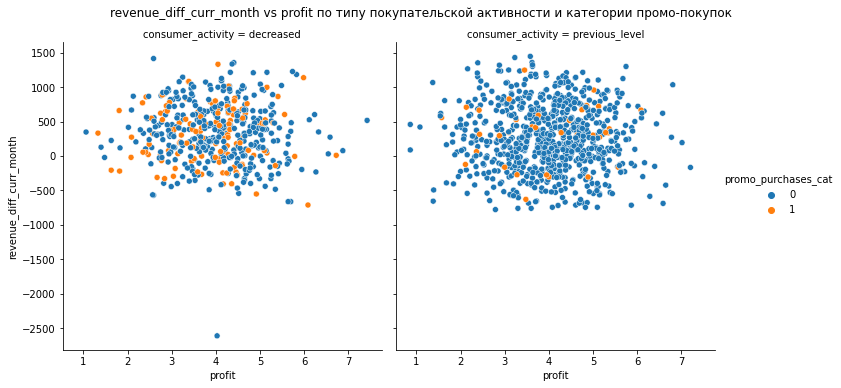

In [217]:
num_col_names = market_profit.select_dtypes(include='number').columns

for i, item in enumerate(market_profit.drop(columns=['id', 'profit', 'promo_purchases_cat'], axis=1).select_dtypes(include='number')):
    sns.relplot(data=market_profit, x='profit', y=item, col='consumer_activity', hue='promo_purchases_cat', kind='scatter'
               ).fig.suptitle(f'{item} vs profit по типу покупательской активности и категории промо-покупок', y=1.03)
plt.show();

В целом те же выводы : более высокая доля пропо-покупок в сегменте со сниженной покупательской активностью.
Других очевидных групп я не могу определить.

В поисках групп перейдем к другим признакам

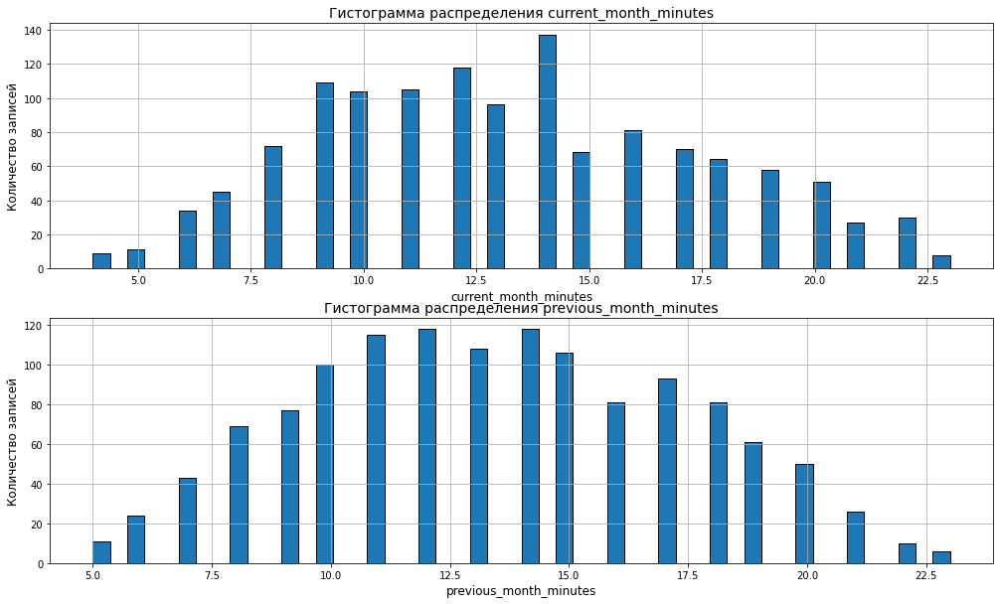

In [218]:
# Рассмотрим отдельно показатели минут за каждый месяц
fig, axs = plt.subplots(2, 1, figsize=(17, 10))
axs = axs.flatten()
#colors = ['SteelBlue', 'LightCyan', 'LightSkyBlue', 'lightyellow']
revenue_month = ['current_month_revenue', 'previous_month_revenue', 'pre_previous_month_revenue']
minutes_month = ['current_month_minutes', 'previous_month_minutes']

for i, item in enumerate(minutes_month):
    axs[i].hist(market_profit[item], bins = 50, edgecolor='black', label = 'consumer_activity')
    axs[i].set_title(f'Гистограмма распределения {item}', fontsize=14)
    axs[i].set_xlabel(f'{item}', fontsize=12)
    axs[i].set_ylabel('Количество записей', fontsize=12)
    axs[i].grid(True)
plt.show();

В обоих месяцах основная часть пользователей проводила на сайте от 10 до 15 минут.

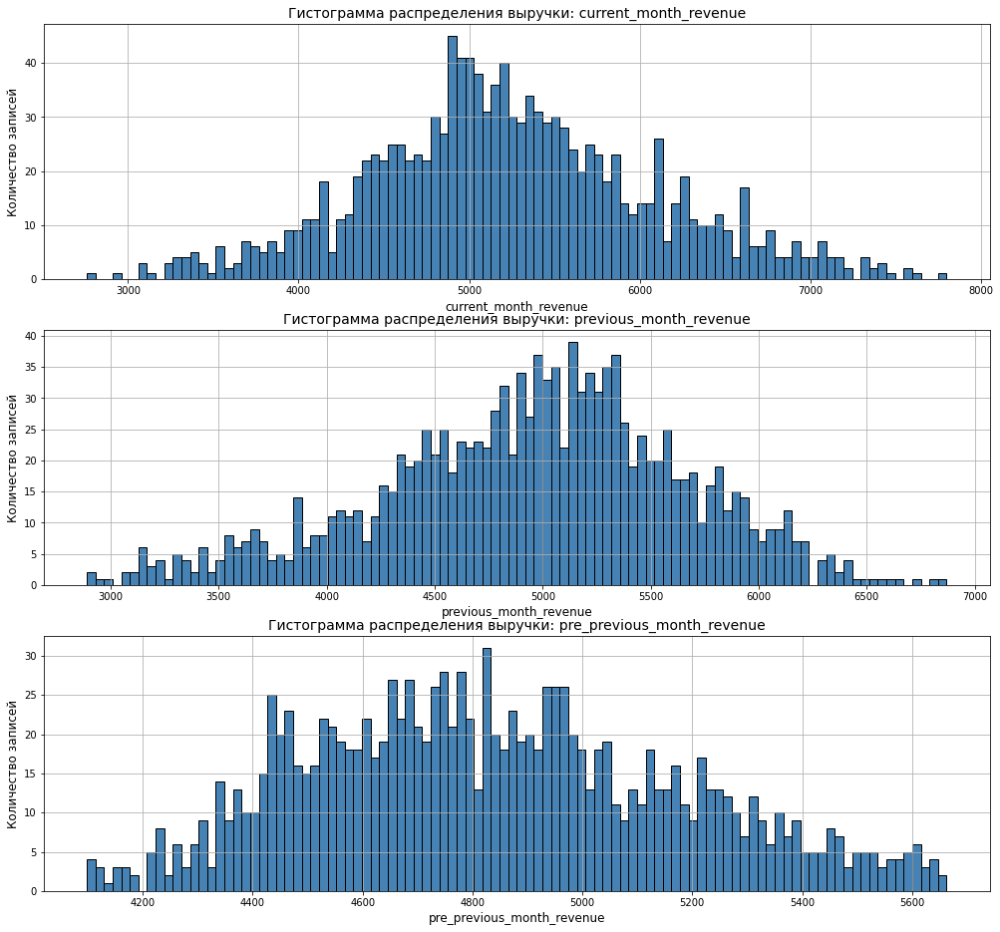

In [219]:
#Рассмотрим отдельно показатели выручки за каждый месяц (Без учета 3-х клиентов с нулевой выручкой в первые 2 мес.)

fig, axs = plt.subplots(3, 1, figsize=(17, 16))
axs = axs.flatten()
revenue_month = ['current_month_revenue', 'previous_month_revenue', 'pre_previous_month_revenue']
minutes_month = ['current_month_minutes', 'previous_month_minutes']

for i, item in enumerate(revenue_month):
    axs[i].hist(market_profit.query('pre_previous_month_revenue >=1000 and previous_month_revenue>=1000'
                                   )[item], bins = 100, color = 'steelblue', edgecolor = 'black')
    axs[i].set_title(f'Гистограмма распределения выручки: {item}', fontsize=14)
    axs[i].set_xlabel(f'{item}', fontsize=12)
    axs[i].set_ylabel('Количество записей', fontsize=12)
    axs[i].grid(True)
plt.show();

В первый месяц большая часть покупок в диапазоне 4 400 - 5 000 единиц измерения выручки в данном файле.

Во 2м и 3м мес. выручка смещается к более высоким цифрам - 5 000 - 5 500 единиц измерения выручки.

Посмотрим на распределение категорий покупок

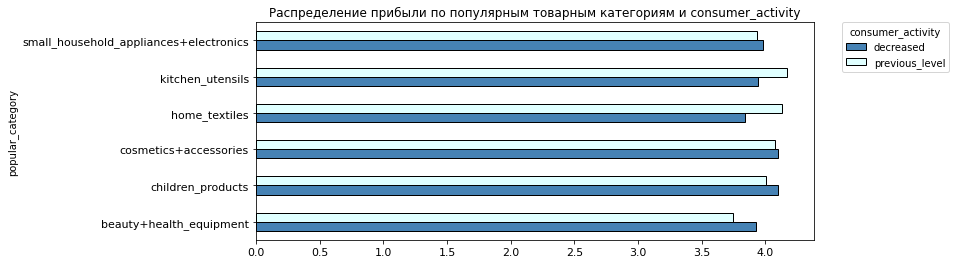

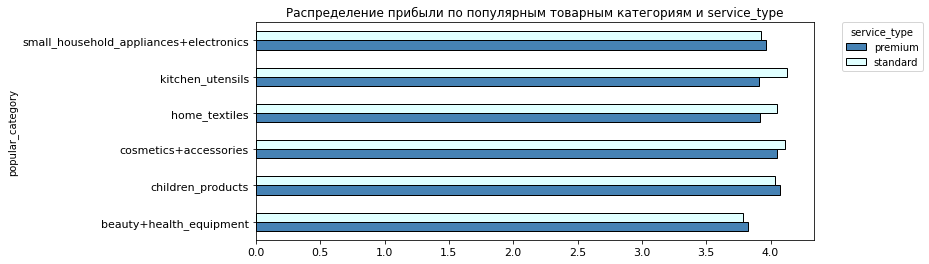

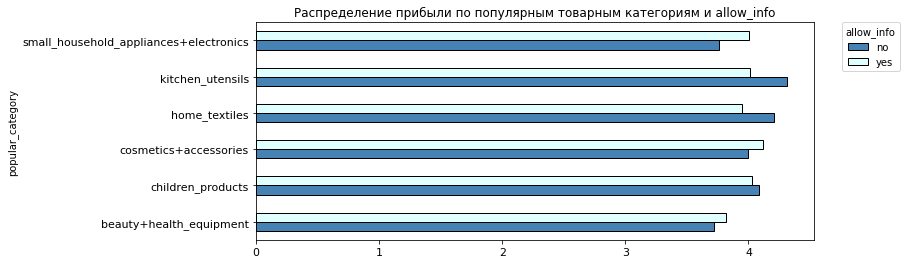

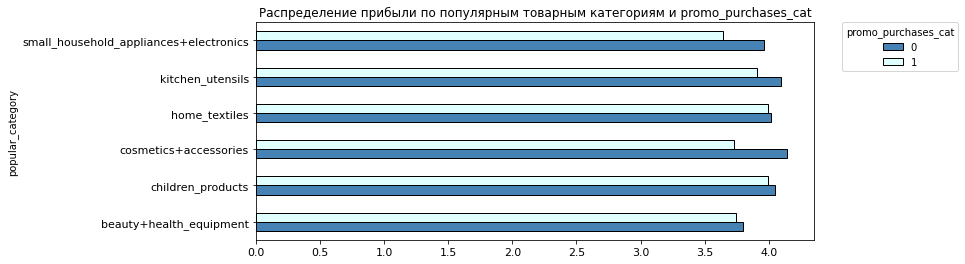

In [220]:
# Прибыльность клиента по товарным категориям + категориальные признаки

cat_col_names = ['consumer_activity', 'service_type', 'allow_info', 'promo_purchases_cat']

colors = ['SteelBlue', 'LightCyan', 'LightSkyBlue', 'lightyellow']

for i, item in enumerate(cat_col_names):
    market_profit.pivot_table(index=['popular_category'], values='profit', columns=[item]
                         ).plot(kind='barh', color=colors, edgecolor='black', figsize=(10,4), fontsize=11)
    plt.legend(title=item, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad= 0 )
    plt.title(f'Распределение прибыли по популярным товарным категориям и {item}');

#Рассмотрим диаграммы рассеяния Прибыли и числовых показателей по категориям покупательской активности

fig, axs = plt.subplots(17, 1, figsize=(12, 100))
axs = axs.flatten()

num_columns = market_profit.drop(columns=['id', 'profit'], axis=1).select_dtypes(include='number').columns

for i, item in enumerate(num_columns):
    
    sns.scatterplot(data=market_profit, x='profit', y=item, hue='consumer_activity', ax=axs[i])
    
    axs[i].set_title(f'Гистограмма распределения {item}', fontsize=14)
    axs[i].set_xlabel('profit', fontsize=12)
    axs[i].set_ylabel(f'{item}', fontsize=12)
    axs[i].grid(True)
    axs[i].legend(title="consumer_act_cat", bbox_to_anchor=(1.03, 1), loc='upper left');

Рассмотрим показатели выручки за каждый месяц для каждой из категорий покупателей: со снизившейся покупательской активностью и на прежнем уровне.

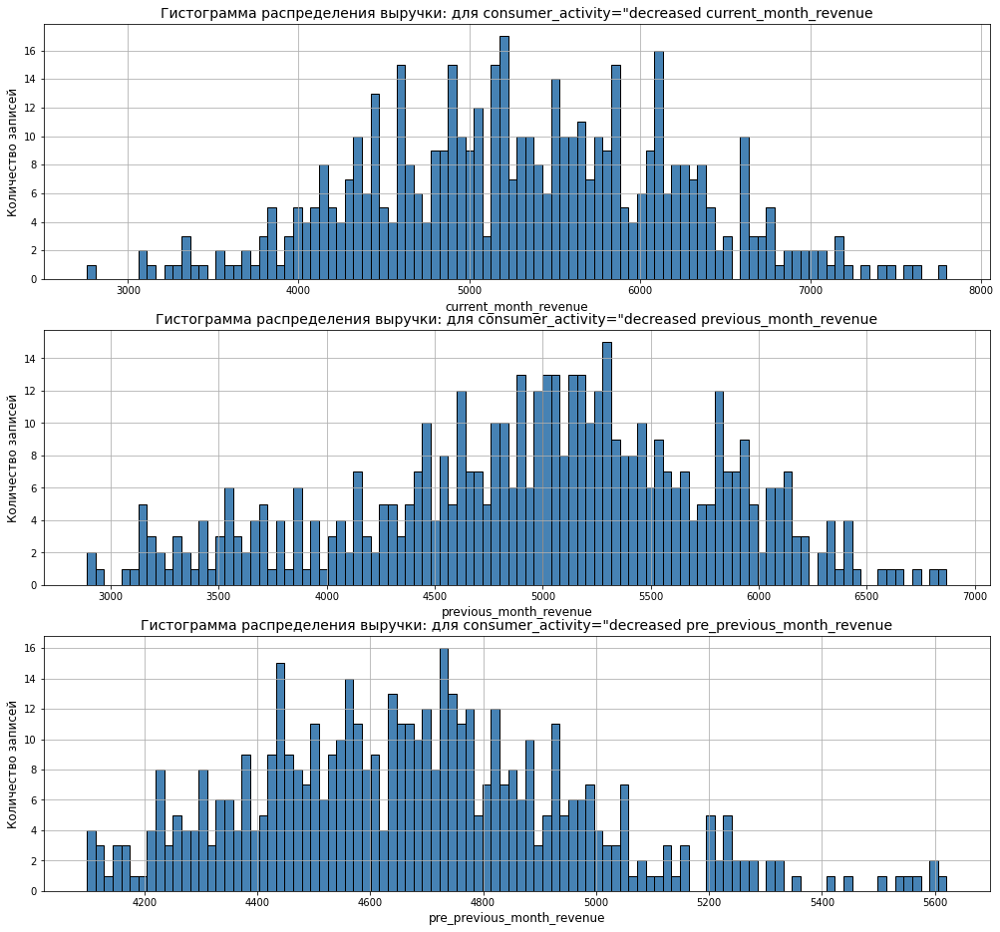

In [221]:
# Показатели выручки для категории покупателей со снизившейся покупательской активностью

fig, axs = plt.subplots(3, 1, figsize=(17, 16))
axs = axs.flatten()
revenue_month = ['current_month_revenue', 'previous_month_revenue', 'pre_previous_month_revenue']
minutes_month = ['current_month_minutes', 'previous_month_minutes']

for i, item in enumerate(revenue_month):
    axs[i].hist(market_profit.query('consumer_activity=="decreased" and \
                                    pre_previous_month_revenue >=1000 and \
                                    previous_month_revenue>=1000')[item], bins = 100, color = 'steelblue', edgecolor = 'black')
    axs[i].set_title(f'Гистограмма распределения выручки: для consumer_activity="decreased {item}', fontsize=14)
    #axs[i].set_xticks(range(2.5, 8))
    axs[i].set_xlabel(f'{item}', fontsize=12)
    axs[i].set_ylabel('Количество записей', fontsize=12)
    axs[i].grid(True)
plt.show();

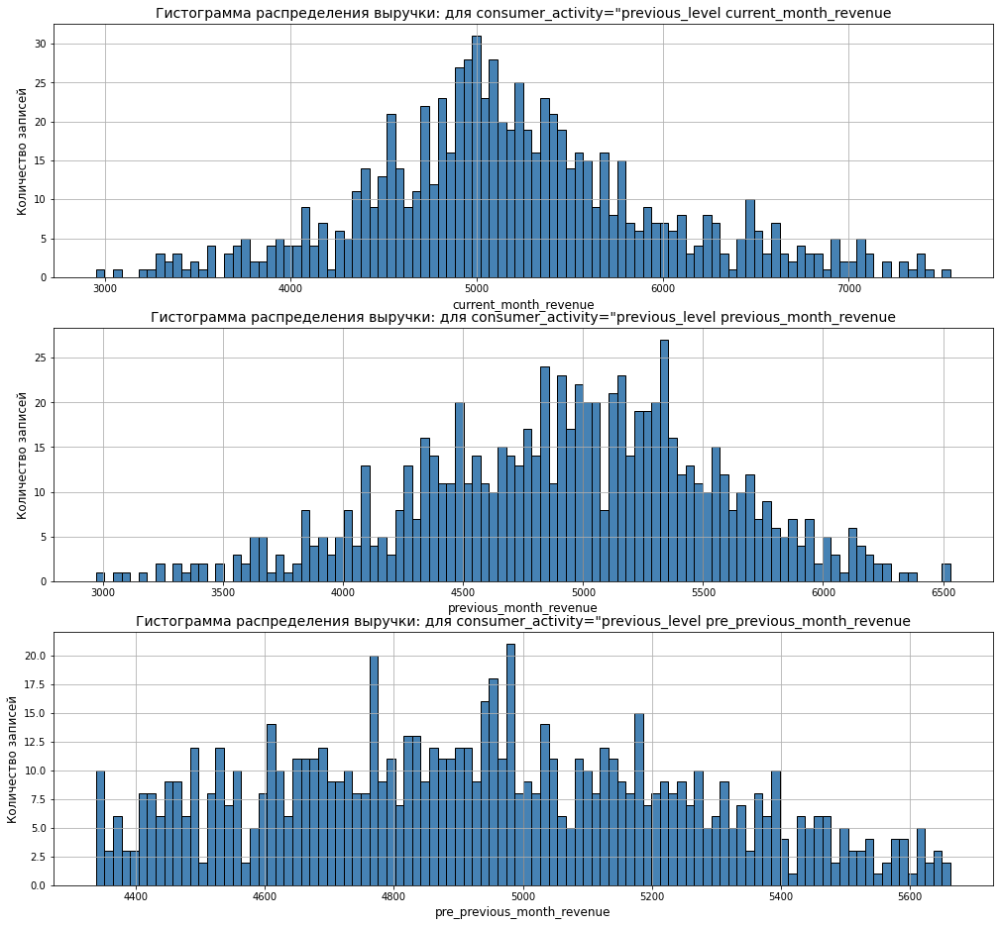

In [222]:
# Показатели выручки для категории покупателей с прежним уровнем покупательской активностью

fig, axs = plt.subplots(3, 1, figsize=(17, 16))
axs = axs.flatten()
revenue_month = ['current_month_revenue', 'previous_month_revenue', 'pre_previous_month_revenue']
minutes_month = ['current_month_minutes', 'previous_month_minutes']

for i, item in enumerate(revenue_month):
    axs[i].hist(market_profit.query('consumer_activity=="previous_level" and \
                                    pre_previous_month_revenue >=1000 and \
                                    previous_month_revenue>=1000')[item], bins = 100, color = 'steelblue', edgecolor = 'black')
    axs[i].set_title(f'Гистограмма распределения выручки: для consumer_activity="previous_level {item}', fontsize=14)
    #axs[i].set_xticks(range(2.5, 8))
    axs[i].set_xlabel(f'{item}', fontsize=12)
    axs[i].set_ylabel('Количество записей', fontsize=12)
    axs[i].grid(True)
plt.show();

Покупатели со снизившимся уровнем покупательской активности склонны тратить большие суммы, чем покупатели с прежним уровнем активности.

Рассмотрим показатели прибыльности аналогичным образом

С прибыльностью, конечно, было бы гораздо понятнее, если знать единицы измерения. если это единицы денег, то одно, а если какие-то доли процентов, то другое.

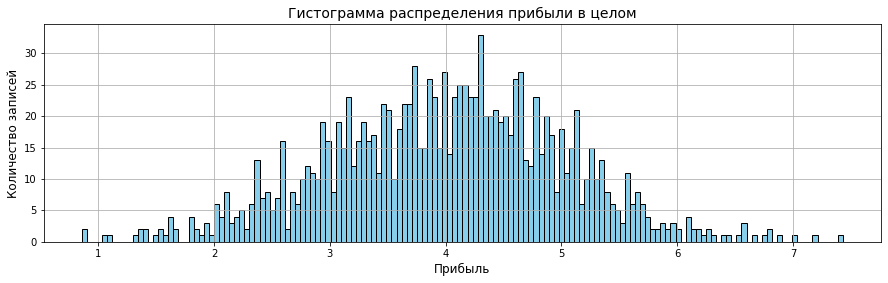

In [223]:
# Гистограмма распределения прибыли в целом

fig, axs = plt.subplots(figsize=(15, 4))

plt.hist(market_profit['profit'], bins = 150, color = 'Skyblue', edgecolor = 'black')
plot_lables(f'Гистограмма распределения прибыли в целом', 'Прибыль', 'Количество записей')
axs.grid(True)
plt.show();

Распеределение прибыли визуально выглядит достаточно равномерно. Очевидных групп я не вижу.

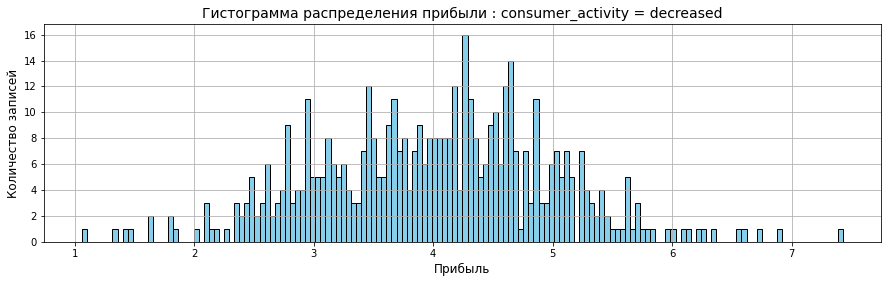

In [224]:
# Гистограмма распределения прибыли по клиентам, у которых снизилась покупательская активность

fig, axs = plt.subplots(figsize=(15, 4))

plt.hist(market_profit.query('consumer_activity=="decreased"')['profit'], bins = 150, color = 'Skyblue', edgecolor = 'black')
plot_lables(f'Гистограмма распределения прибыли : consumer_activity = decreased', 'Прибыль', 'Количество записей')
axs.grid(True)
plt.show();

Можно попробовать отделить группу до 3,4 ед. измерения прибыли и от 3,4 до 4,3 и выше.

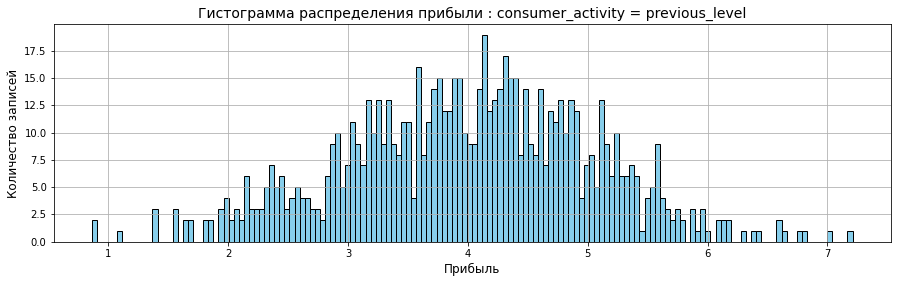

In [225]:
# Гистограмма распределения прибыли по клиентам, у которых снизилась покупательская активность

fig, axs = plt.subplots(figsize=(15, 4))

plt.hist(market_profit.query('consumer_activity=="previous_level"')['profit'], bins = 150, color = 'Skyblue', edgecolor = 'black')
plot_lables('Гистограмма распределения прибыли : consumer_activity = previous_level', 'Прибыль', 'Количество записей')
axs.grid(True)
plt.show();

Здесь довольно логично все выглядит - второй график более интенсивный, в первом значения разрежены, количество клиентов и показатели их прибыльности ниже и разнороднее.

Посмотрим, как выглядит разброс значений в категории с прежней и снизившейся покупательской активностью в разбивке по товарным категориям

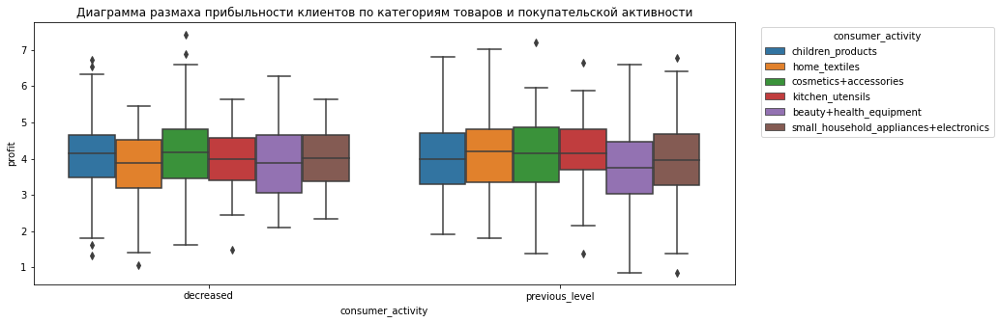

In [226]:
plt.figure(figsize=(13,5))
sns.boxplot(data=market_profit, x='consumer_activity', y='profit', hue='popular_category')
plt.title('Диаграмма размаха прибыльности клиентов по категориям товаров и покупательской активности', fontsize=12)
plt.legend(title="consumer_activity", bbox_to_anchor=(1.03, 1), loc='upper left');

Прибыльность всех категорий находится в диапазоне от 3 до 5 (ед. измерения прибыльности в данном файле).
В группе с прежней покупательской активностью чуть ниже значения Техники для красоты и здоровья, Кухонная посуда принимает более скромные значения по сравнению с другими категориями.

В среднем примерно на одном уровне в группе с прежней активностью находятся Товары для детей, Домашний текстиль, Косметика и аксуссуары и Мелкая бытовая техника и электроника.

В группе со снизившейся активностью доля вышеперечисленных 4-х категорий ниже. Самый большой сегмент составляет Техники для красоты и здоровья.

In [227]:
# Прибыль меньше 1,4 ед. измерения

market_profit[market_profit['profit']<=1.3]

,id,consumer_activity,service_type,allow_info,avg_market_activity_6_months,market_activity_current_month,duration,promotional_purchases,popular_category,avg_category_view_per_visit,unpaid_products_per_quarter,service_mistake,pages_per_visit,current_month_revenue,pre_previous_month_revenue,previous_month_revenue,current_month_minutes,previous_month_minutes,promo_purchases_cat,profit,revenue_diff_pre_month,revenue_diff_curr_month
179,215530,decreased,standard,yes,3.90,5,508,0.40,home_textiles,1,6,3,3,5391.40,4374.00,5043.00,10,9,0,1.06,669.00,348.40
771,216122,previous_level,standard,yes,5.80,5,365,0.17,beauty+health_equipment,6,2,4,8,4681.40,4545.00,4593.00,13,11,0,0.86,48.00,88.40
935,216286,previous_level,standard,no,4.10,5,402,0.30,beauty+health_equipment,4,1,7,6,4937.20,4852.00,4516.00,6,15,0,1.08,-336.00,421.20
973,216324,previous_level,premium,yes,4.30,5,509,0.25,small_household_appliances+electronics,3,5,4,9,5311.40,4473.00,4852.50,20,19,0,0.86,379.50,458.90


Посмотрим на распределение прибыли по категориям промо-товаров и покупательской активности

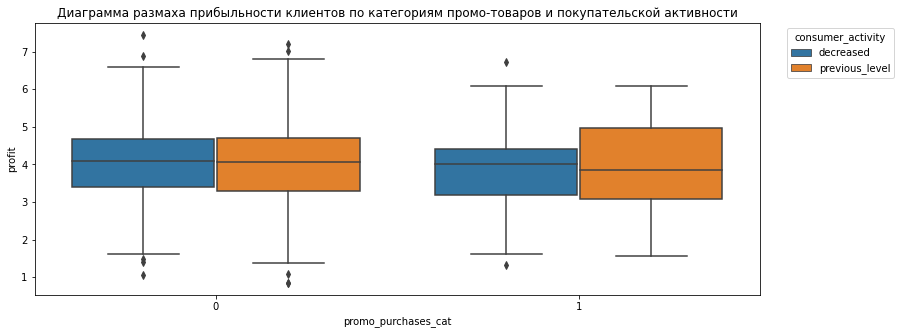

In [228]:
plt.figure(figsize=(13,5))
sns.boxplot(data=market_profit, x='promo_purchases_cat', y='profit', hue='consumer_activity')
plt.title('Диаграмма размаха прибыльности клиентов по категориям промо-товаров и покупательской активности', fontsize=12)
plt.legend(title="consumer_activity", bbox_to_anchor=(1.03, 1), loc='upper left');

Показатели прибыльности примерно равны (3,2 - 4,8) у покупателей с низкой долей промо-товаров (до 60% общего объема покупок) - как в группе со снизившейся, так и прежней покупатеьской активностью.

Покупатели, предпочитающие большую долю промо-покупок (от 60% и выше) сосотавляют примерно равную предыдущим группу - со снизившейся активностью. Доля покупателей с прежней активностью здесь гораздо больше.

Как распределеяется прибыль по категориям промо-покупок и покупательской активности

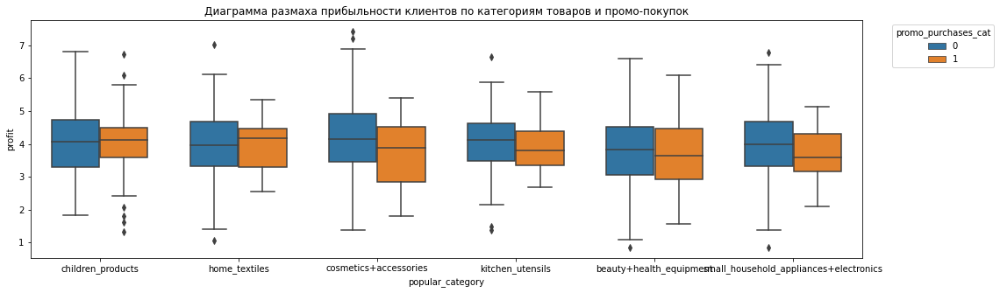

In [229]:
plt.figure(figsize=(17,5))
sns.boxplot(data=market_profit, x='popular_category', y='profit',  hue='promo_purchases_cat', width=.7)
plt.title('Диаграмма размаха прибыльности клиентов по категориям товаров и промо-покупок', fontsize=12)
plt.legend(title="promo_purchases_cat", bbox_to_anchor=(1.03, 1), loc='upper left');

Больше всего прибыли приносят любители промо-покупок в группе Косметики и аксессуаров, чуть ниже - Техника для красоты и здоровья. Примерно на одном уровне: Домашний текстиль и Мелкая бытовая техника. Затем идет Кухонная посуда и наименьшую долю занимают Товары для детей.
 
в группе с низкой долей промо-покупок прибыльность примерно на одном уровне у Товаров для детей, Домашнего текстиля, Мелкой бытовой техники. По объему незначительно больше товарные категории Косметика и аксессуары и Техника для красоты и здоровья. Наименьший объем - Кухонная посуда.

В целом наибольшую прибыль приносят промо-товары в категории Красота и здоровье и Техника для красоты и здоровья (как с высокой, так и с обычной долей промо-покупок).

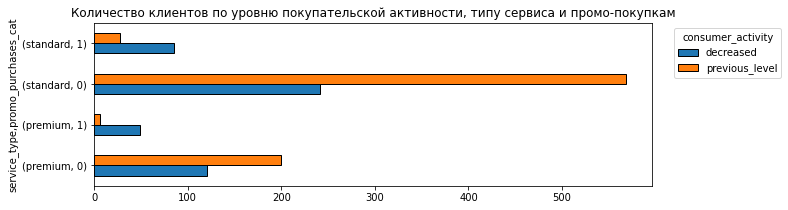

In [230]:
market_profit.pivot_table(index=['service_type', 'promo_purchases_cat'], 
                          columns=['consumer_activity' ], values='profit', aggfunc=('count')
                         ).plot(kind='barh', figsize=(10,3), edgecolor='black').set_title(
    "Количество клиентов по уровню покупательской активности, типу сервиса и промо-покупкам")
plt.legend(title="consumer_activity", bbox_to_anchor=(1.03, 1), loc='upper left');

Суммарная прибыльность прямо зависит от численности группы. (график аналогичный).

Наиболее многочисленная группа: тип сервиса стандарт, низкая доля промо-покупок.
снижение активности здесь больше трети от доли клиентов с прежней активностью

Вторая по численности - тип сервиса премиум, низкая доля промо-покупок.
Снижение активности здесь более ощутимо - больше половины от числа клиентов с прежней активностью.

Далее идут клиенты с типом сервиса стандарт и высокой долей промо-покупок.
Здесь активность снизилась значительно - доля клиентов со снизившейся активностью почти на 2/3 превышает клиентов с прежней активностью

Самая малочисленная группа - тип сервиса премиум, высокая доля промо-покупок. И здесь максимальное снижение активности: число клиентов с прежней активностью всего около пятой части.

**Т.о. отмечаем значительное снижение активности у покупателей с высокой долей промо-покупок, особенно с типом сервиса премиум.**

**Прежняя активность в группе с низкой долей промо-покупок, особенно с типом сервиса стандарт.**

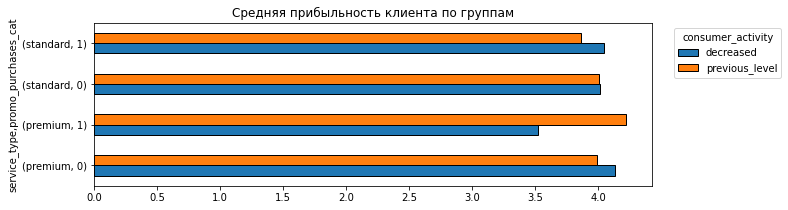

In [231]:
market_profit.pivot_table(index=['service_type', 'promo_purchases_cat'], 
                          columns=['consumer_activity'], values='profit', aggfunc=('mean')
                         ).plot(kind='barh', figsize=(10,3), edgecolor='black'
                                                        ).set_title("Средняя прибыльность клиента по группам")
plt.legend(title="consumer_activity", bbox_to_anchor=(1.03, 1), loc='upper left');

Наибольшая средняя прибыльность клиента отмечается в группе Премиум с высокой долей промо-покупок и прежним типом активности.
(ПО количеству - это самая малочисленная группа). 
Наименьшая средняя прибыльность также в группе премиум с высокой долей промо-покупок - при снижении активности.

Примерно равный уровень средней прибыльности в группах премиум и стандарт с низкой долей промо-покупок при прежней активности. в группе стандарт также и со сниженной активностью.

В группах стандарт, высокая доля промо-покупок и премиум, низкая доля промо-покупок: средняя прибыльность клиентов с прежнем уровнем активности ниже, чем со снизившимся.

**Т.о. отмечаем, что средняя прибыльность в наиболее массовой группе (стандарт, низкая доля промо-покупок), такая же как и во 2й по численности, при этом в 2 раза меньшей группе (премиум, низкая доля промо-покупок).**

(При этом стоит рассмотреть затраты в среднем на клиента в каждой из групп: стандарт и премиум, чтобы понят, насколько выгодно компании разделение по типам сервиса.)

(хорошо бы , конечно, было узнать единицы измерения прибыльности. деньги это или это проценты, или коэффициенты от чего-то)

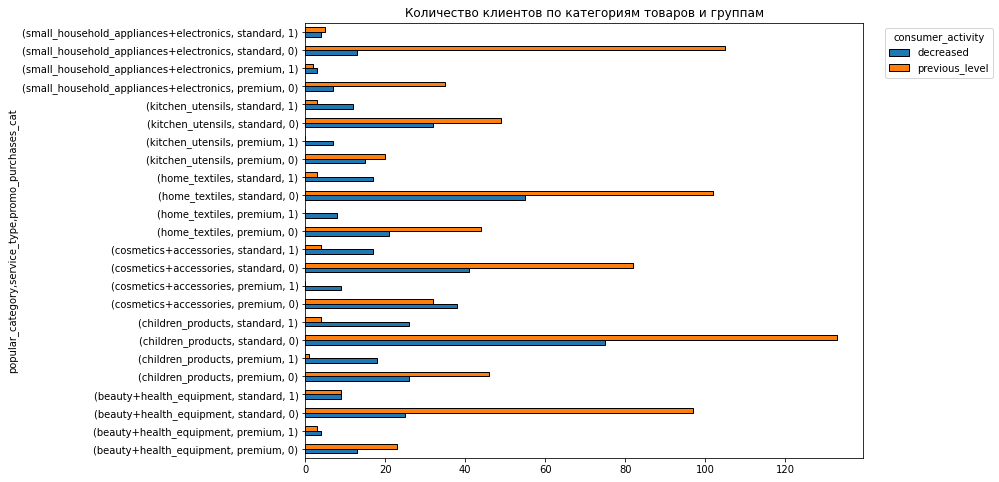

In [232]:
market_profit.pivot_table(index=['popular_category','service_type', 'promo_purchases_cat',],
                          columns=['consumer_activity'], values='profit', aggfunc=('count')
                         ).plot(kind='barh', figsize=(10,8), edgecolor='black'
                               ).set_title("Количество клиентов по категориям товаров и группам")
plt.legend(title="consumer_activity", bbox_to_anchor=(1.03, 1), loc='upper left');

По товарным категориям - также прямая зависимость прибыльности от числа покупателей в каждой группе.
Распределение клинетов с прежней активностью каждого типа сервиса и промо-покупок соответствует рассмотренному выше:
1. стандарт, низкая доля промо-покупок
2. премиум, низкая доля промо-покупок
3. стандарт, высокая доля промо-покупок
4. премиум, высокая доля промо-покупок.


Распределение покупателей с прежней активностью по товарным категориям:

1. Товары для детей - самая обширная категория

примерно на четверть меньше:

2. Мелкая бытовая техника и электроника
3. Домашний текстиль
4. Техника для красоты и здоровья

5. Косметика и аксессуары - на треть меньше

примерно на 2/3 меньше:

6. Кухонная посуда

Дальше идут Премиум, низкая доля промо-покупок в той же последовательности товарных категорий. Но примерно в 2-2,5 раза меньшим количеством.

Наибольшее снижение активности:
Группа стандарт, низкий уровень промо-товаров
1. Товары для детей
2. Домашний текстиль
3. Косметика и аксессуары

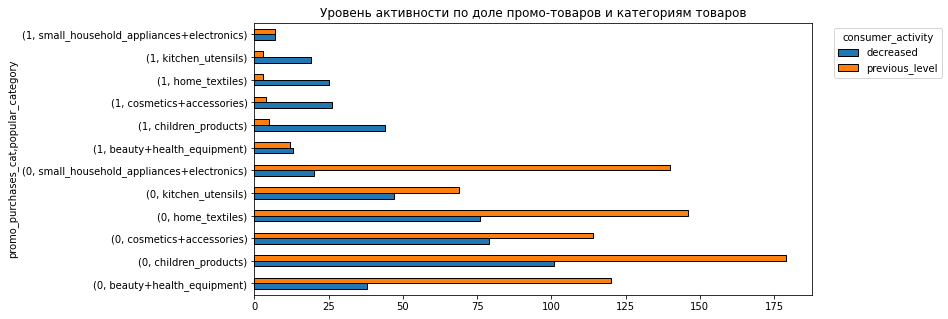

In [233]:
# с бОльшим акцентом на промо-товары

market_profit.pivot_table(index=['promo_purchases_cat','popular_category',  ],
                          columns=['consumer_activity'], values='profit', aggfunc=('count')
                         ).plot(kind='barh', figsize=(10,5), edgecolor='black'
                               ).set_title("Уровень активности по доле промо-товаров и категориям товаров")
plt.legend(title="consumer_activity", bbox_to_anchor=(1.03, 1), loc='upper left');

В сегменте с высокой долей промо-товаров число клиентов с прежней активностью осталось крайне незначительным в категориях:
1. Товары для детей
2. Косметика и аксессуары
3. Домашний текстиль
4. Кухонная посуда

Минимальное снижение активности в категоряих Техника для красоты и здоровья и Мелкая бытовая техника и электроника.
группы с прежней и снизившейся активностью примерно равны.

В сегменте с низкой долей промо-товаров наибольшее снижение активности в тех же категорях.
Но доля покупателей с прежней активностью намного выше.

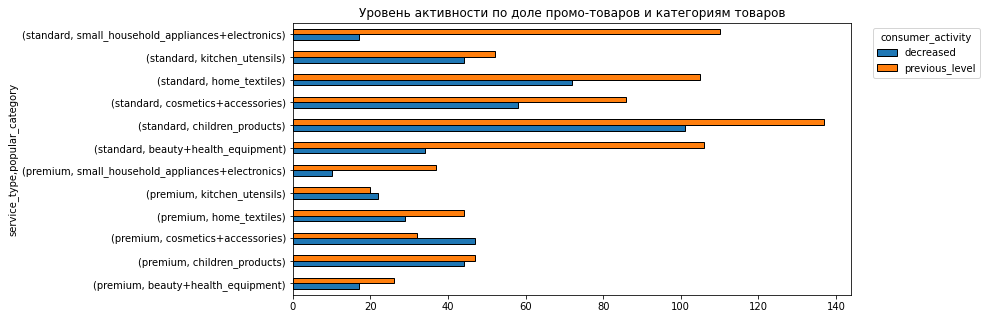

In [234]:
# с бОльшим акцентом на тип сервиса

market_profit.pivot_table(index=['service_type', 'popular_category', ],
                          columns=['consumer_activity'], values='profit', aggfunc=('count')
                         ).plot(kind='barh', figsize=(10,5), edgecolor='black'
                               ).set_title("Уровень активности по доле промо-товаров и категориям товаров")
plt.legend(title="consumer_activity", bbox_to_anchor=(1.03, 1), loc='upper left');

Распределение товарных категорий по типу сервиса в сегменте с прежней активностью:
1. Товары для детей
2. Мелкая бытовая техника и электроника
3. Техника для красоты и здоровья
4. Домашний текстиль
5. Косметика и аксессуары
6. Кухонная посуда

в Премиум сегменте:
1. Товары для детей
2. Домашний текстиль
3. Мелкая бытовая техника и электроника
4. Косметика и аксессуары
5. Техника для красоты и здоровья
6. Кухонная посуда

Наименьшее снижение активности в обеих группах по категориям Мелкая бытовая техника и электроника и Техника для красоты и здоровья.
Наибольшее - в категориях Товары для детей, Косметика и аксессуары и Домашний текстиль

Ниже на графиках представлены сегменты с прежней активностью и снижением активности по товарным категориям

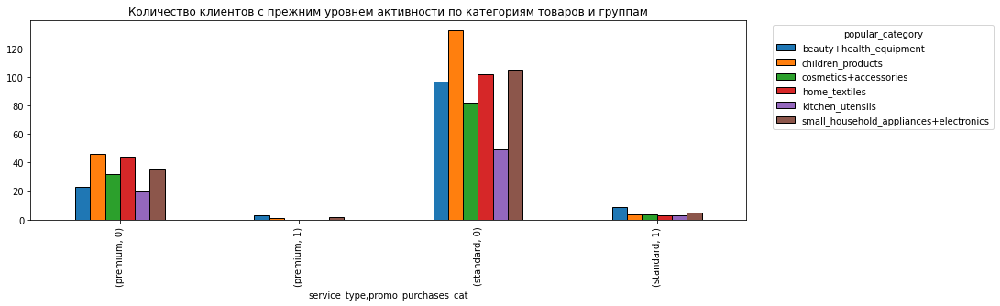

In [235]:
market_profit.query('consumer_activity == "previous_level"').pivot_table(index=['service_type', 'promo_purchases_cat',],
                          columns=['popular_category'], values='profit', aggfunc=('count')
                         ).plot(kind='bar', figsize=(14, 4), edgecolor='black'
                               ).set_title("Количество клиентов c прежним уровнем активности по категориям товаров и группам")
plt.legend(title="popular_category", bbox_to_anchor=(1.03, 1), loc='upper left');

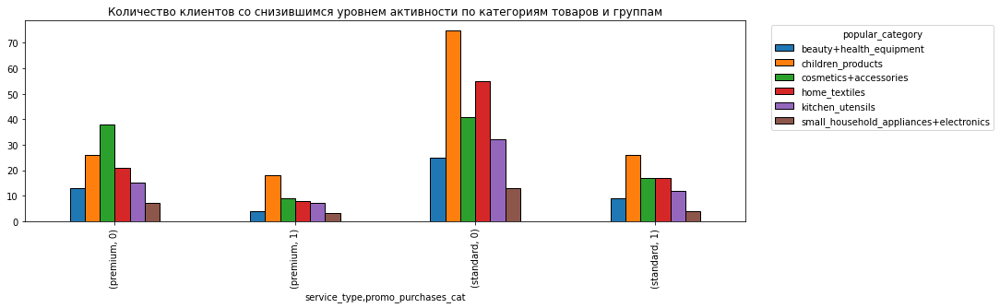

In [236]:
market_profit.query('consumer_activity == "decreased"').pivot_table(index=['service_type', 'promo_purchases_cat',],
                          columns=['popular_category'], values='profit', aggfunc=('count')
                         ).plot(kind='bar', figsize=(14, 4), edgecolor='black'
                               ).set_title(
    "Количество клиентов со снизившимся уровнем активности по категориям товаров и группам")
plt.legend(title="popular_category", bbox_to_anchor=(1.03, 1), loc='upper left');

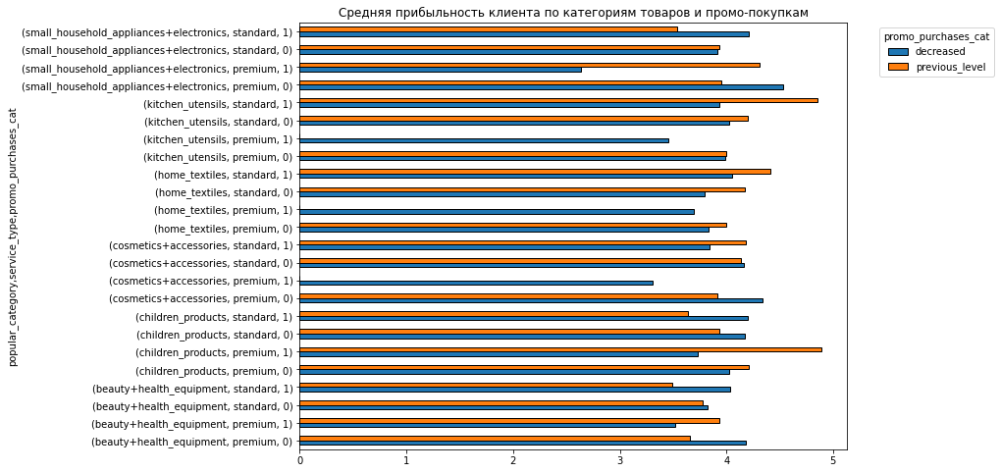

In [237]:
market_profit.pivot_table(index=['popular_category', 'service_type', 'promo_purchases_cat',], 
                          columns=['consumer_activity'], values='profit', aggfunc=('mean')
                         ).plot(kind='barh', figsize=(10,8), edgecolor='black'
                               ).set_title("Средняя прибыльность клиента по категориям товаров и промо-покупкам")
plt.legend(title='promo_purchases_cat', bbox_to_anchor=(1.05,1));

В сегменте со снизившейся активностью наименьшая средняя прибыльность клинета (2,8) отмечатся в товарной категории Мелкая бытовая техника и электроника, тип сервиса премиум, высокая доля промо-товаров; наибольшая (4,5) также в товарной категории Мелкая бытовая техника и электроника, тип сервиса премиум, низкая доля промо-товаров.

В сегменте с прежней активностью наименьшая средняя прибыльность клинета (3,7) отмечатся в товарной категории Мелкая бытовая техника и электроника и Техника для красоты и здоровья, тип сервиса стандарт, высокая доля промо-товаров; наибольшая (4,9 и 4,8) соотв. в товарной категории Товары для детей, тип сервиса премиум, всокая доля промо-товаров и Кухонная посуда, тип сервиса стандарт, высокая доля промо-товаров.

### Прибыльность клиента: cut vs qcut

Поскольку на данном этапе не понятно, каким образом делить покупателей по уровню прибыли - по мне так какие-то очевидные группы не выделяются в общем графике. 
Между тем прибыль как-то надо сегментировать (по условиям задачи).

Попробую воспользоваться для сигментации инструментом cut / qcut.

Но опять же , какой лучше вбрать способ. Попробую посмотреть, что получается в обоих случаях.

Разделим покупателей по признаку profit на 3 группы, двумя методами

In [238]:
# Создадим список категорий для qcut
bin_labels_3 = ['low_profit', 'mid_profit', 'high_profit']

# Создадим признак с помощью qcut
market_profit['bin_profit'], bin_edges  = pd.qcut(market_profit['profit'], q=[0, 1/3, 2/3, 1], 
                                                  labels=bin_labels_3, retbins=True)

# Создадим список категорий для cut
cut_labels_3 = ['low_profit', 'mid_profit', 'high_profit']
bins=np.linspace(0, market_profit['profit'].max(), 4)

# Создадим признак с помощью cut
market_profit['cut_profit'] = pd.cut(market_profit['profit'], bins=bins, labels=cut_labels_3)


In [239]:
# посмотрим, что получилось
market_profit.head()

,id,consumer_activity,service_type,allow_info,avg_market_activity_6_months,market_activity_current_month,duration,promotional_purchases,popular_category,avg_category_view_per_visit,unpaid_products_per_quarter,service_mistake,pages_per_visit,current_month_revenue,pre_previous_month_revenue,previous_month_revenue,current_month_minutes,previous_month_minutes,promo_purchases_cat,profit,revenue_diff_pre_month,revenue_diff_curr_month,bin_profit,cut_profit
0,215349,decreased,premium,yes,4.40,4,819,0.75,children_products,4,4,2,5,4971.60,4472.00,5216.00,10,12,1,4.16,744.00,-244.40,mid_profit,mid_profit
1,215350,decreased,standard,no,4.90,3,539,0.14,home_textiles,5,2,1,5,5058.40,4826.00,5457.50,13,8,0,3.13,631.50,-399.10,low_profit,mid_profit
2,215351,decreased,standard,yes,3.20,5,896,0.99,children_products,5,0,6,4,6610.40,4793.00,6158.00,13,11,1,4.87,1365.00,452.40,high_profit,mid_profit
3,215352,decreased,standard,no,5.10,3,1064,0.94,children_products,3,2,3,2,5872.50,4594.00,5807.50,11,8,1,4.21,1213.50,65.00,mid_profit,mid_profit
4,215353,decreased,standard,yes,3.30,4,762,0.26,home_textiles,4,1,1,4,5388.50,5124.00,4738.50,10,10,0,3.95,-385.50,650.00,mid_profit,mid_profit


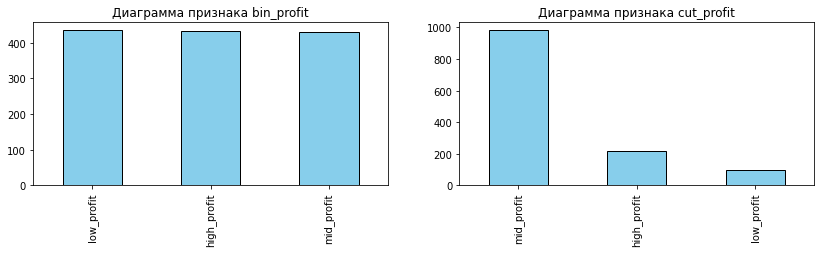

In [240]:
# Количество новых показателей прибыли при разбивке 2 способами

fig, axes = plt.subplots(1, 2, figsize=(14, 3))

axe = axes.ravel()
names = ['bin_profit','cut_profit']
for i, item in enumerate(names):
    market_profit[item].value_counts().plot(kind='bar',
                                      #shadow=True,
                                      #autopct='%1.1f%%',
                                      title='Диаграмма признака ' + str(item),
                                      ax=axe[i],
                                      color='SkyBlue',
                                      edgecolor='black',
                                      )

В случае с qcut получаются 3 одинаковые по размеру группы. В случае cut основную часть составляет средняя прибыль.

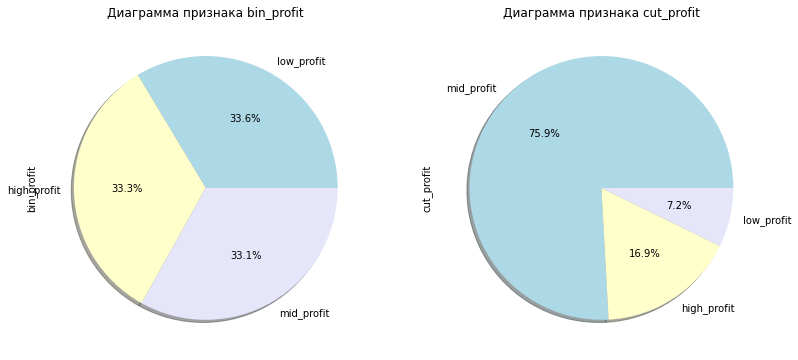

In [241]:
# Доля новых показателей прибыли при разбивке 2 способами (для наглядности)

fig, axes = plt.subplots(1, 2, figsize=(13, 12))
colors = ["#ADD8E6", "#FFFFCB", "#E6E6FA", "#F5F5DC", "#F0FFFF", "#7BC8F6"]
axe = axes.ravel()
names = ['bin_profit','cut_profit']
for i, item in enumerate(names):
    market_profit[item].value_counts().plot(kind='pie',
                             shadow=True,
                             autopct='%1.1f%%',
                             title='Диаграмма признака ' + str(item),
                             ax=axe[i],
                             colors=colors,
                             #edgecolor='black'
                                           )

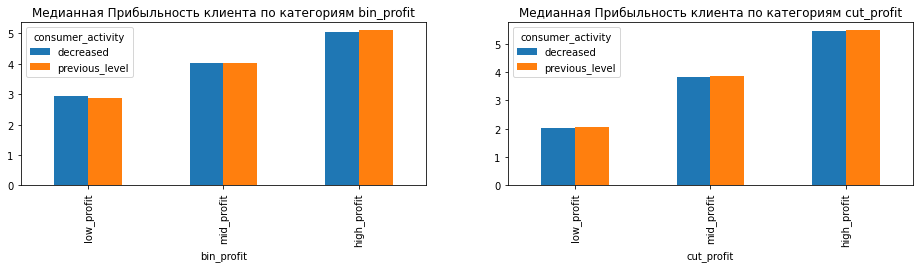

In [242]:
# Медианные показатели прибыли по группам при разбивке 2-мя способами (+ промо-покупки)

fig, axes = plt.subplots(1, 2, figsize=(16, 3))

axe = axes.ravel()
names = ['bin_profit','cut_profit']

for i, item in enumerate(names):
    market_profit.pivot_table(index=[item], columns=['consumer_activity'], values='profit', aggfunc=('mean')
                             ).plot(kind='bar', figsize=(16,3), ax=axe[i]).set_title(f'Медианная Прибыльность клиента по категориям {item}');
   

In [243]:
# Границы категорий при qcut
bins

array([0.        , 2.47666667, 4.95333333, 7.43      ])

In [244]:
# Границы категорий при cut
bin_edges

array([0.86, 3.59, 4.45, 7.43])

На общей гистограмме можно соотнести масштабы категорий и данные, которые в них попадут

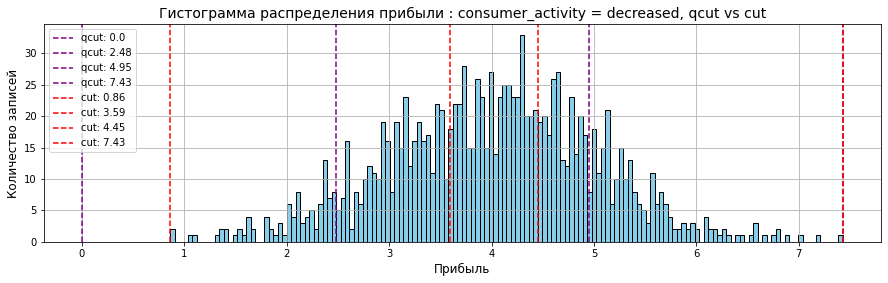

In [245]:
# Гистограмма распределения прибыли по клиентам, у которых снизилась покупательская активность

fig, axs = plt.subplots(figsize=(15, 4))

plt.hist(market_profit['profit'], bins = 150, color = 'Skyblue', edgecolor = 'black')
plot_lables(f'Гистограмма распределения прибыли : consumer_activity = decreased, qcut vs cut', 'Прибыль', 'Количество записей')
axs.grid(True)
for i, item in enumerate(bins):
    plt.axvline(x=bins[i], color='purple', linestyle='--', label='qcut: ' + str(round(bins[i],2)))
for j, item in enumerate(bin_edges):
    plt.axvline(x=bin_edges[j], color='r', linestyle='--', label='cut: ' + str(round(bin_edges[j],2)))
plt.legend();

Пожалуй, я выберу qcut, потому что более равномерная серединка остается, и отбираются хвосты с минимальными и максимальными показателями прибыльности.

### Сегментация покупателей и анализ выбранного сегмента

Если выбрать покупателей мелкой бытовой техники и электроники.

In [246]:
tech = market_profit[(market_profit['popular_category'] == 'small_household_appliances+electronics')]

In [247]:
#high_promo = market_profit[(market_profit['promo_purchases_cat'] == 1)&(market_profit['consumer_activity'] == 'decreased')]

In [248]:
tech

,id,consumer_activity,service_type,allow_info,avg_market_activity_6_months,market_activity_current_month,duration,promotional_purchases,popular_category,avg_category_view_per_visit,unpaid_products_per_quarter,service_mistake,pages_per_visit,current_month_revenue,pre_previous_month_revenue,previous_month_revenue,current_month_minutes,previous_month_minutes,promo_purchases_cat,profit,revenue_diff_pre_month,revenue_diff_curr_month,bin_profit,cut_profit
47,215398,decreased,premium,yes,3.50,5,882,0.22,small_household_appliances+electronics,3,2,6,3,5854.20,4557.00,5530.50,6,5,0,4.77,973.50,323.70,high_profit,mid_profit
116,215467,decreased,standard,yes,4.40,4,503,0.90,small_household_appliances+electronics,2,3,3,3,5062.30,4367.00,4853.00,13,7,1,4.01,486.00,209.30,mid_profit,mid_profit
146,215497,decreased,premium,yes,5.60,5,719,0.28,small_household_appliances+electronics,1,2,7,1,6277.10,4475.00,5871.50,5,9,0,4.17,1396.50,405.60,mid_profit,mid_profit
158,215509,decreased,premium,yes,4.00,5,982,0.94,small_household_appliances+electronics,3,1,2,6,5299.30,4880.00,5265.50,6,8,1,3.14,385.50,33.80,low_profit,mid_profit
177,215528,decreased,standard,yes,4.40,4,773,0.98,small_household_appliances+electronics,3,3,8,6,6103.30,4502.00,5270.00,8,8,1,3.33,768.00,833.30,low_profit,mid_profit
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1258,216609,previous_level,premium,yes,4.70,4,935,0.14,small_household_appliances+electronics,3,1,3,8,4518.00,5340.00,4830.00,19,13,0,4.18,-510.00,-312.00,mid_profit,mid_profit
1260,216611,previous_level,standard,yes,3.90,4,515,0.13,small_household_appliances+electronics,3,0,2,10,5060.40,4951.00,4751.00,17,9,0,4.10,-200.00,309.40,mid_profit,mid_profit
1277,216628,previous_level,standard,no,3.80,4,467,0.22,small_household_appliances+electronics,5,1,4,4,5225.00,5200.00,4458.00,14,18,0,3.42,-742.00,767.00,low_profit,mid_profit
1287,216638,previous_level,standard,no,1.50,3,930,0.29,small_household_appliances+electronics,2,0,4,16,4557.40,4613.00,3234.00,14,11,0,3.63,-1379.00,1323.40,mid_profit,mid_profit


In [249]:
# Выведем описание числовых данных

tech.drop('id', axis=1).describe()

,avg_market_activity_6_months,market_activity_current_month,duration,promotional_purchases,avg_category_view_per_visit,unpaid_products_per_quarter,service_mistake,pages_per_visit,current_month_revenue,pre_previous_month_revenue,previous_month_revenue,current_month_minutes,previous_month_minutes,promo_purchases_cat,profit,revenue_diff_pre_month,revenue_diff_curr_month
count,174.00,174.00,174.00,174.00,174.00,174.00,174.00,174.00,174.00,174.00,174.00,174.00,174.00,174.00,174.00,174.00,174.00
mean,4.55,4.03,623.81,0.27,3.52,2.13,4.33,8.89,5287.47,4885.16,5028.28,14.28,14.57,0.08,3.94,143.13,259.19
std,0.89,0.65,245.29,0.21,1.28,1.41,1.93,3.56,989.45,319.42,633.40,4.20,3.95,0.27,1.03,585.62,474.77
min,1.40,3.00,136.00,0.11,1.00,0.00,0.00,1.00,3237.20,4258.00,3234.00,4.00,5.00,0.00,0.86,-1379.00,-759.20
25%,4.10,4.00,437.00,0.16,3.00,1.00,3.00,6.00,4527.85,4644.00,4626.38,11.00,11.00,0.00,3.29,-286.50,-89.70
50%,4.40,4.00,633.50,0.23,3.00,2.00,4.00,9.00,5266.15,4865.50,5045.25,14.00,15.00,0.00,3.99,165.75,285.35
75%,5.28,4.00,814.00,0.28,4.00,3.00,6.00,11.00,5969.20,5124.75,5443.88,17.75,18.00,0.00,4.68,562.50,617.50
max,6.60,5.00,1061.00,0.99,6.00,5.00,8.00,18.00,7557.00,5663.00,6588.50,22.00,23.00,1.00,6.78,1905.00,1323.40


In [250]:
# с долей промо-товаров = 0,99, думаю, будет немного таких:
tech[tech['promotional_purchases']==0.99]

,id,consumer_activity,service_type,allow_info,avg_market_activity_6_months,market_activity_current_month,duration,promotional_purchases,popular_category,avg_category_view_per_visit,unpaid_products_per_quarter,service_mistake,pages_per_visit,current_month_revenue,pre_previous_month_revenue,previous_month_revenue,current_month_minutes,previous_month_minutes,promo_purchases_cat,profit,revenue_diff_pre_month,revenue_diff_curr_month,bin_profit,cut_profit
583,215934,decreased,standard,no,5.50,4,147,0.99,small_household_appliances+electronics,1,2,3,7,5773.80,4451.00,5090.00,18,15,1,4.40,639.00,683.80,mid_profit,mid_profit


In [251]:
#  для сравнения - общие данные

market_profit.drop('id', axis=1).describe()

,avg_market_activity_6_months,market_activity_current_month,duration,promotional_purchases,avg_category_view_per_visit,unpaid_products_per_quarter,service_mistake,pages_per_visit,current_month_revenue,pre_previous_month_revenue,previous_month_revenue,current_month_minutes,previous_month_minutes,promo_purchases_cat,profit,revenue_diff_pre_month,revenue_diff_curr_month
count,1297.00,1297.00,1297.00,1297.00,1297.00,1297.00,1297.00,1297.00,1297.00,1297.00,1297.00,1297.00,1297.00,1297.00,1297.00,1297.00,1297.00
mean,4.25,4.01,602.99,0.32,3.27,2.84,4.18,8.19,5239.35,4836.37,4948.34,13.21,13.47,0.13,4.00,111.97,291.01
std,1.02,0.70,249.10,0.25,1.35,1.97,1.95,3.98,835.22,333.44,701.23,4.22,3.94,0.34,1.01,670.38,453.87
min,0.90,3.00,121.00,0.11,1.00,0.00,0.00,1.00,2758.70,4098.00,2890.00,4.00,5.00,0.00,0.86,-1999.00,-2610.30
25%,3.70,4.00,410.00,0.17,2.00,1.00,3.00,5.00,4706.60,4585.00,4498.50,10.00,11.00,0.00,3.30,-339.00,-20.80
50%,4.20,4.00,607.00,0.24,3.00,3.00,4.00,8.00,5180.30,4812.00,5005.50,13.00,13.00,0.00,4.04,106.50,288.60
75%,4.90,4.00,806.00,0.30,4.00,4.00,6.00,11.00,5761.30,5055.00,5409.00,16.00,17.00,0.00,4.67,579.00,617.50
max,6.60,5.00,1079.00,0.99,6.00,10.00,9.00,20.00,7799.40,5663.00,6869.50,23.00,23.00,1.00,7.43,2067.00,1446.90


Пользователи данного сегмента проводят в среднем на 1 минуту больше времени на сайте по сравнению с пользователями в целом, они просматривают больше товарных категорий (3,52 vs 3,27) и страниц (8,89 vs 8,18). В среднем они чуть дольше зарегистрированы на сайте (623 vs 601 день). Доля промо-покупок и неоплаченных товаров у них в среднем ниже (0,27 vs 0,32 и 2,13 vs 2.84). Маркетинговая активность здесь выше, как за 6 мес, так и за тек. мес. (соотв.4,55 и 4,03 vs 4,25 и 4,01).

Они приносят в среднем на 50-70 ед. изм. больше выручки из месяца в месяц, однако прибыльность клиента составляет в среднем 3,94 (vs 4).

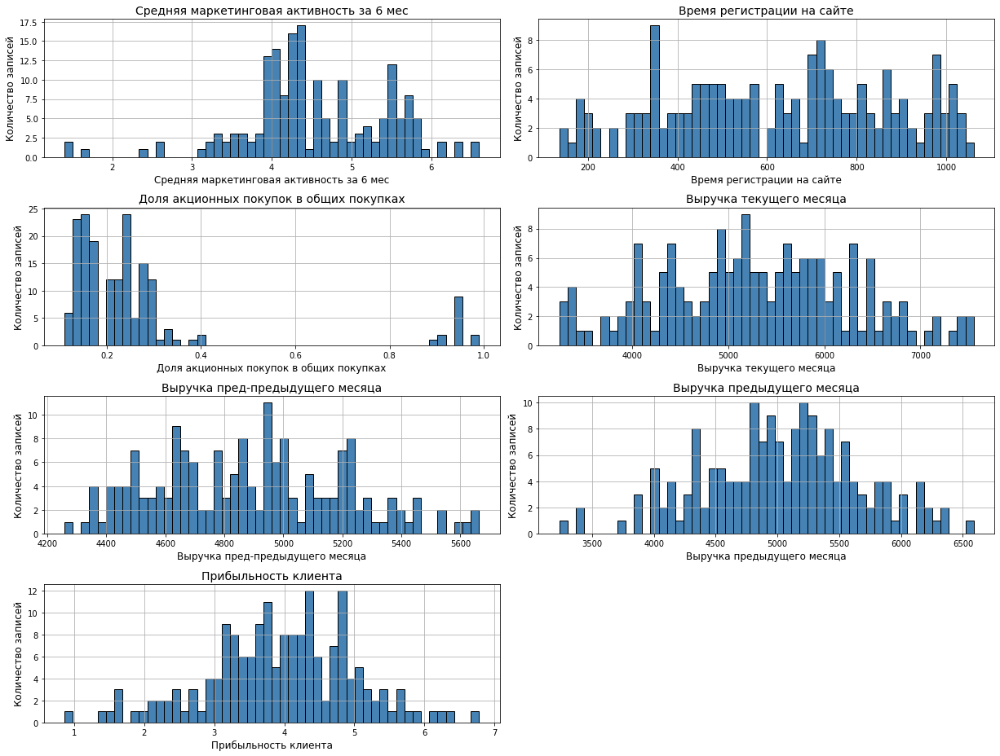

In [252]:
# Названия графиков

plot_titles = ['Средняя маркетинговая активность за 6 мес', 'Время регистрации на сайте', 
               'Доля акционных покупок в общих покупках', 'Выручка текущего месяца', 
               'Выручка пред-предыдущего месяца', 'Выручка предыдущего месяца', 'Прибыльность клиента']

# Подписи для осей X и Y

x_labels = ['Средняя маркетинговая активность за 6 мес', 'Время регистрации на сайте', 
               'Доля акционных покупок в общих покупках', 'Выручка текущего месяца', 
               'Выручка пред-предыдущего месяца', 'Выручка предыдущего месяца', 'Прибыльность клиента']

y_labels = ['Количество записей']*7

# Используем цикл для построения гистограмм каждого признака

fig, axs = plt.subplots(4, 2, figsize=(17, 13))
axs = axs.flatten()

features = ['avg_market_activity_6_months', 'duration', 'promotional_purchases', 'current_month_revenue',
            'pre_previous_month_revenue', 'previous_month_revenue', 'profit']

for i, feature in enumerate(features):
    axs[i].hist(tech[feature], bins=50, color='steelblue', edgecolor='black')
    axs[i].set_title(plot_titles[i], fontsize=14)
    axs[i].set_xlabel(x_labels[i], fontsize=12)
    axs[i].set_ylabel(y_labels[i], fontsize=12)
    axs[i].grid(True)

plt.box(False)
plt.xticks([])
plt.yticks([])

plt.tight_layout()
plt.show();

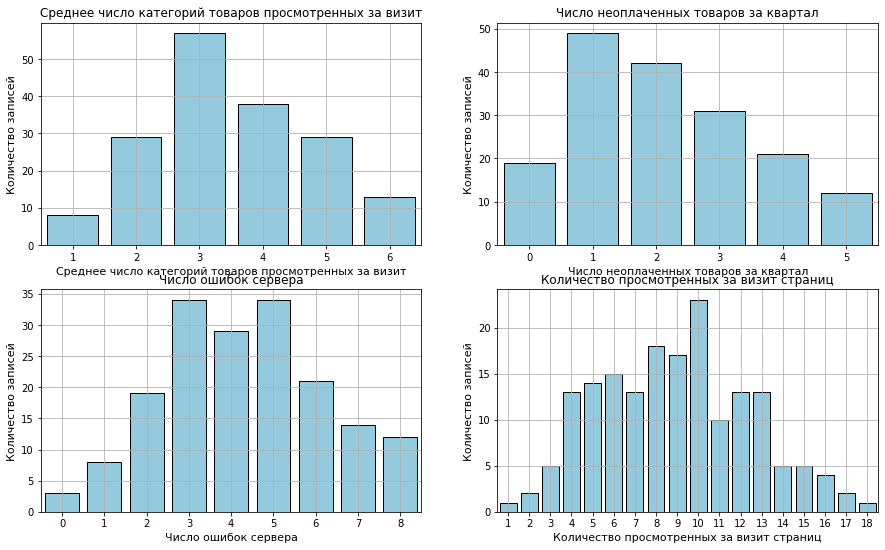

In [253]:
# Названия графиков

plot_titles = [  
               'Среднее число категорий товаров просмотренных за визит', 'Число неоплаченных товаров за квартал', 
               'Число ошибок сервера', 'Количество просмотренных за визит страниц']

# Подписи для осей X и Y

x_labels = [
               'Среднее число категорий товаров просмотренных за визит', 'Число неоплаченных товаров за квартал', 
               'Число ошибок сервера', 'Количество просмотренных за визит страниц']
            
y_labels = ['Количество записей']*4

# Используем цикл для построения гистограмм каждого признака

fig, axs = plt.subplots(2, 2, figsize=(15, 9))
axs = axs.flatten()

features = [ 'avg_category_view_per_visit', 'unpaid_products_per_quarter', 'service_mistake', 
            'pages_per_visit']

for i, feature in enumerate(features):
    sns.countplot(x=tech[feature], color='SkyBlue', edgecolor='black', ax=axs[i])
    axs[i].set_title(plot_titles[i], fontsize=12)
    axs[i].set_xlabel(x_labels[i], fontsize=11)
    axs[i].set_ylabel(y_labels[i], fontsize=11)
    axs[i].grid(True)

#plt.box(False)
#plt.xticks([])
#plt.yticks([])

plt.show();

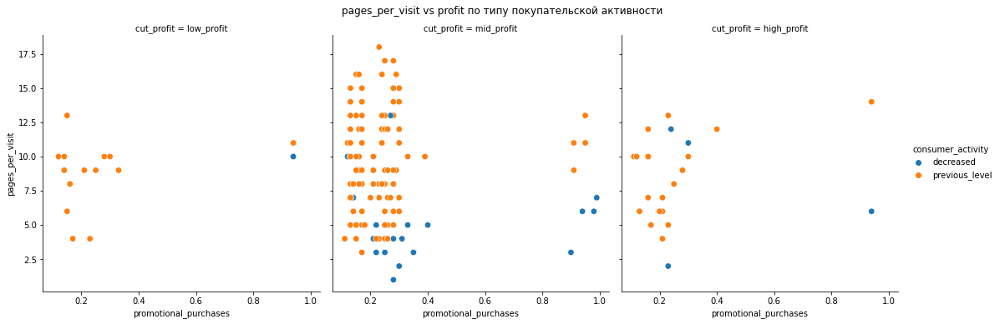

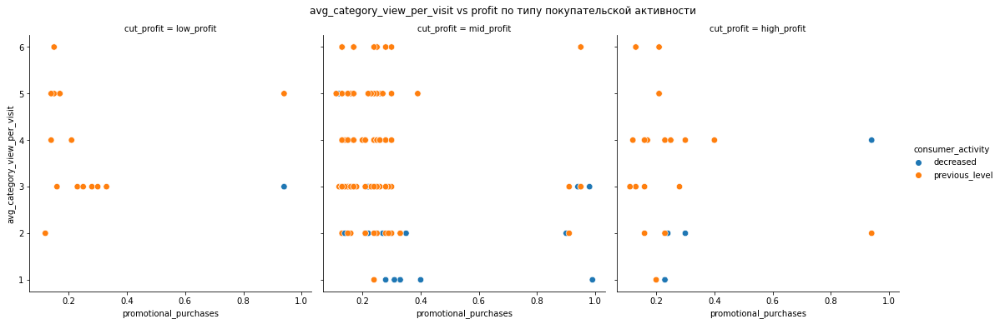

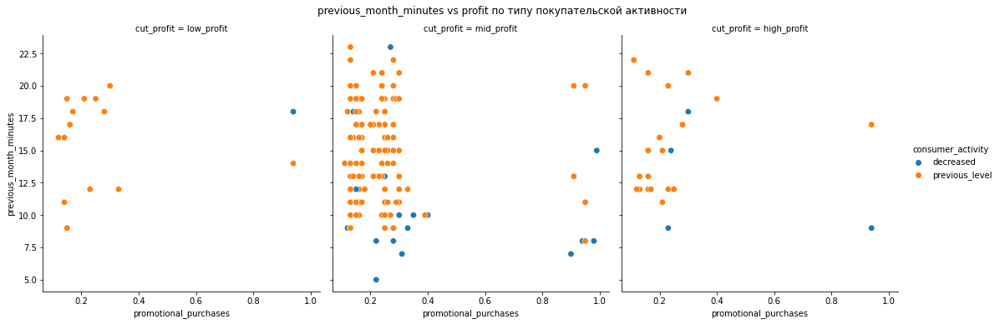

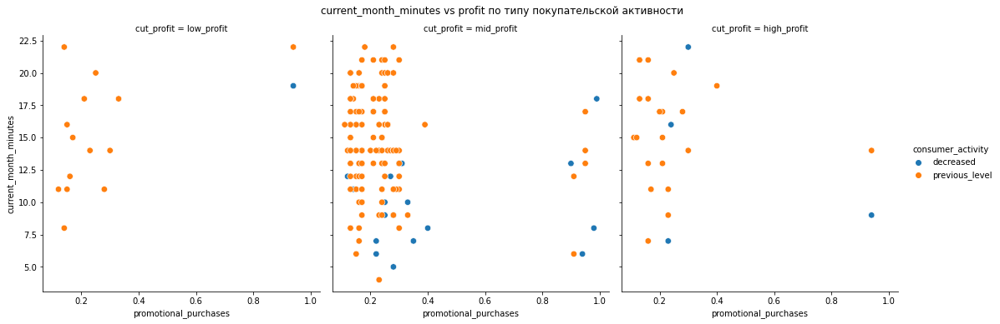

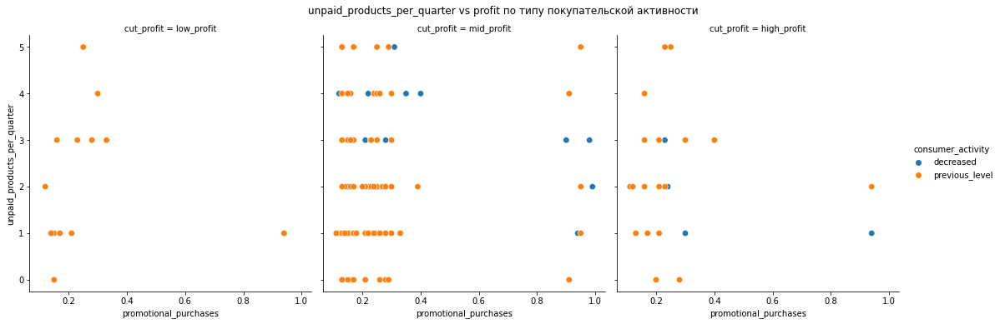

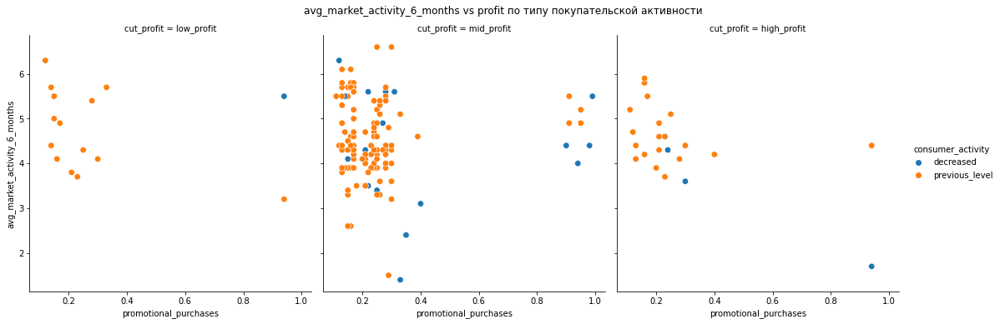

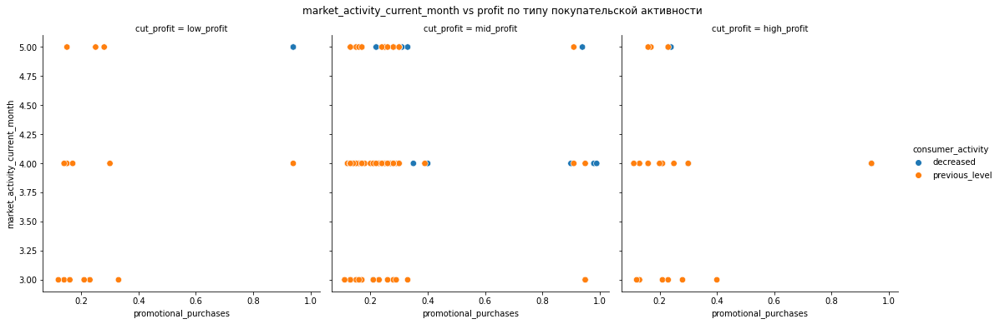

In [254]:
feat_names = ['pages_per_visit', 'avg_category_view_per_visit', 'previous_month_minutes', 'current_month_minutes', 
              'unpaid_products_per_quarter', 'avg_market_activity_6_months', 'market_activity_current_month']

for i, item in enumerate(feat_names):
    sns.relplot(data=tech, x='promotional_purchases', y=item, col='cut_profit', hue='consumer_activity', kind='scatter', s=55
               ).fig.suptitle(f'{item} vs profit по типу покупательской активности', y=1.03)
plt.show();                
                
#consumer_activity, 'promotional_purchases'

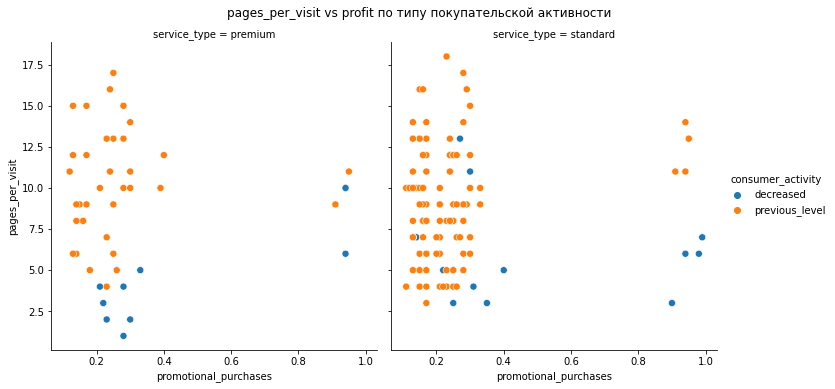

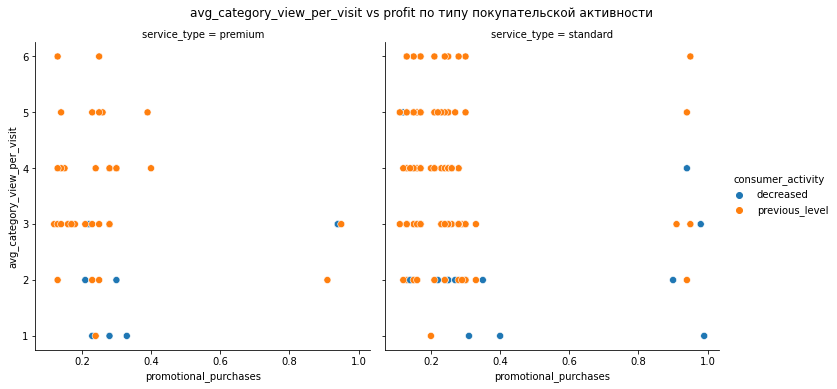

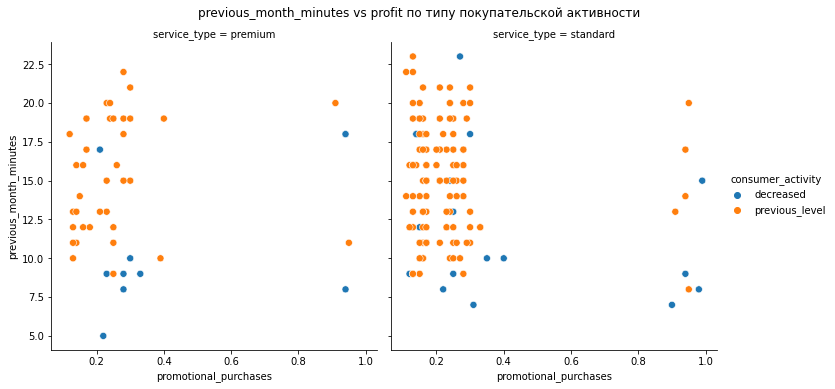

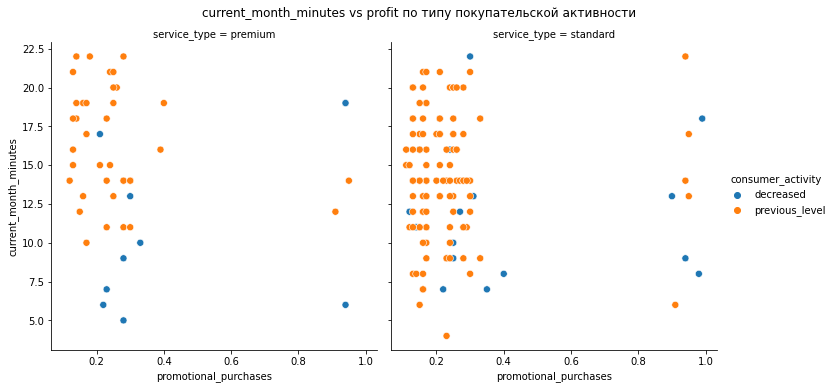

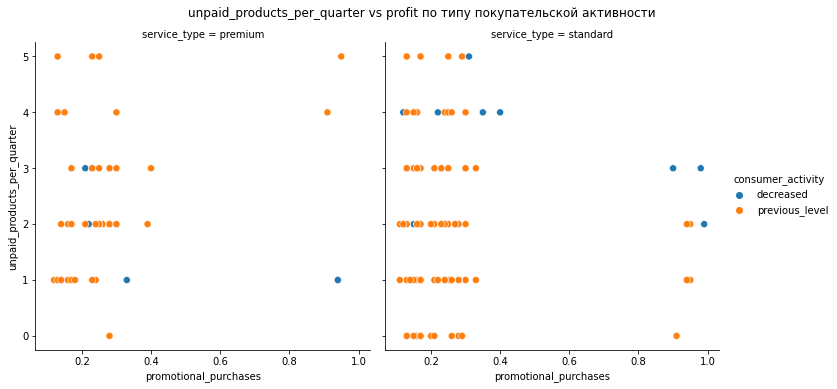

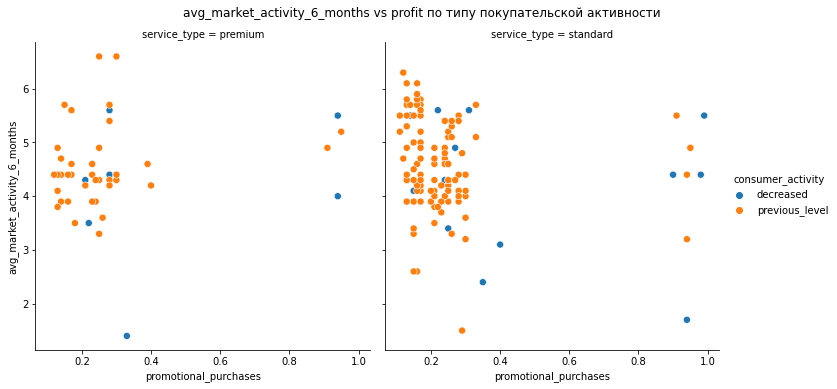

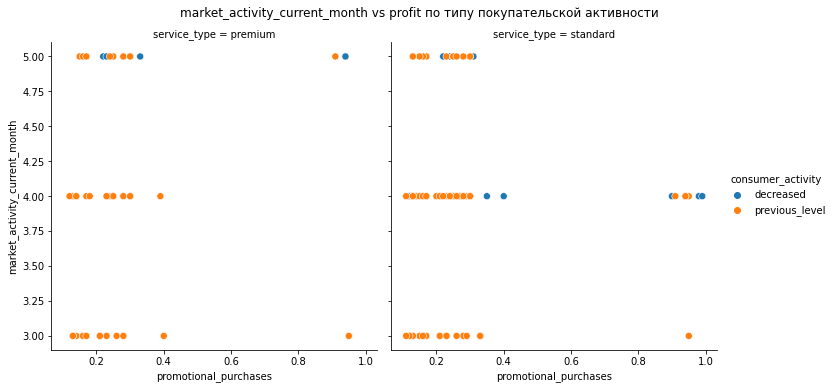

In [255]:
feat_names = ['pages_per_visit', 'avg_category_view_per_visit', 'previous_month_minutes', 'current_month_minutes', 
              'unpaid_products_per_quarter', 'avg_market_activity_6_months', 'market_activity_current_month']

for i, item in enumerate(feat_names):
    sns.relplot(data=tech, x='promotional_purchases', y=item, col='service_type', hue='consumer_activity', kind='scatter', s=50
               ).fig.suptitle(f'{item} vs profit по типу покупательской активности', y=1.03)
plt.show();         

По идее надо взять признаки, которые обозначила модель как наиболее важные, посмотреть на значения их в выбранном сегменте, и выбрать те наблюдения, которые под эти параметры подходят.
Но у меня получается, что они и так уже снизили активность.

В целом прибыльность данного сегмента составляет от 3,4 до 4,6 (ед.изм.), средняя ~ 4 (ед.изм.)
В данном сегменте средняя прибыльность клиентов со снижением активности и с прежним уровнем активности примерно на одном уровне ~3.9 (ед. изм. прибыльности).
Прибыльность тех, кто разрешает присылать маркетинговые сообщения незначительно выше.
Клиенты с низкой долей промо-товаров показывают большую прибыльность - в среднем ~ 4, с высокой ~3,4-3,6.

Среди предпочитающих высокую долю промо-покупок по типу сервиса стандарт (~ 5) и премиум (~2.5) довольно небольшое число пользователей с прежней и снизившейся активностью, в премиуме пользователей со снизившейся активностью чуть больше, чем с прежней.

Основная часть пользователей со снизившейся активностью - с низкой долей промо-покупок, премиум ~10, стандарт ~15.
Низкая доля промо-покупок и у основной части клиентов, сохраняющих покупательскую активность. Число таких в группе премиум ~36, в группе стандарт ~107.

Снижение активности отмечается в средней (основной) группе по прибыльности клиентов.

In [256]:
# Создадим новый файл на основе X_test

X_test_proba = X_test.copy()

In [257]:
# Добавим в него колонки с целевым признаком и вероятностью, предсказанной моделью

X_test_proba['pred'] = y_test_less_features_pred
X_test_proba['predict_proba'] = y_test_less_features_pred
X_test_proba['y_test'] = y_test

In [258]:
# Проверим значения, колонки и число строк

X_test_proba

,service_type,allow_info,avg_market_activity_6_months,market_activity_current_month,duration,popular_category,avg_category_view_per_visit,unpaid_products_per_quarter,service_mistake,pages_per_visit,current_month_revenue,pre_previous_month_revenue,previous_month_revenue,current_month_minutes,previous_month_minutes,promo_purchases_cat,pred,predict_proba,y_test
557,standard,yes,4.30,4,324,beauty+health_equipment,2,7,4,4,5310.10,5160.00,5314.00,20,18,0,1,1,0
798,standard,yes,4.80,4,799,children_products,4,4,9,8,5268.40,5084.00,5492.00,12,11,0,0,0,1
756,standard,no,4.10,4,629,home_textiles,3,0,6,14,4107.80,5375.00,4626.50,17,14,0,1,1,1
1285,standard,no,2.40,4,192,beauty+health_equipment,3,3,6,10,6013.00,4651.00,5311.00,6,20,0,0,0,1
519,standard,yes,5.40,4,777,beauty+health_equipment,2,3,6,14,5420.50,5313.00,5141.00,14,13,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
518,standard,yes,3.30,4,945,home_textiles,3,3,4,13,4746.80,4852.00,4726.00,20,17,0,1,1,1
164,standard,yes,0.90,3,839,cosmetics+accessories,3,3,7,7,6996.90,4513.00,5641.00,8,12,0,0,0,0
375,premium,yes,3.80,4,444,kitchen_utensils,2,4,3,2,6081.20,4964.00,5894.00,11,8,1,0,0,0
717,standard,yes,4.10,5,192,cosmetics+accessories,4,4,6,16,6122.20,4357.00,5233.00,12,14,0,1,1,1


Отберем клиентов, для которых вероятность снижения покупательской активности от 50%. (т.е. модель оценивает принадлежность к классу 1 (прежняя активность) такие наблюдения как ниже или равно 0,5.)

In [259]:
X_test_proba[(X_test_proba['popular_category'] == "small_household_appliances+electronics")&(
    X_test_proba['predict_proba'] <=0.5)]

,service_type,allow_info,avg_market_activity_6_months,market_activity_current_month,duration,popular_category,avg_category_view_per_visit,unpaid_products_per_quarter,service_mistake,pages_per_visit,current_month_revenue,pre_previous_month_revenue,previous_month_revenue,current_month_minutes,previous_month_minutes,promo_purchases_cat,pred,predict_proba,y_test
382,standard,yes,3.10,4,196,small_household_appliances+electronics,1,4,3,5,4275.00,4460.00,4691.00,8,10,0,0,0,0
192,premium,yes,1.40,5,355,small_household_appliances+electronics,1,1,5,5,6118.60,4826.00,5277.50,10,9,0,0,0,0
693,standard,no,2.60,4,498,small_household_appliances+electronics,3,4,1,10,5962.60,4637.00,5277.50,8,13,0,0,0,1
390,premium,no,4.60,5,187,small_household_appliances+electronics,1,3,3,2,4445.40,4500.00,4773.00,7,9,0,0,0,0


Получается 4 клиента: 2 с типом сервиса стандарт и 2 с типом сервиса премиум.

Для клиентов с индексами 382 и особенно 192 и 693 требуется увеличить маркетинговые итерации, поскольку при количестве маркетинговых взаимодействий ниже 3-х существенно возрастает вероятность снижения активности.

Для повышения времени на сайте и количества просмотренных категорий, возможно следует предлагать им новинки товаров, или дополнения/аксессуары к ранее приобретенной технике, или похожие по ценовым категориям (+/-) варианты техники.
Поскольку приобретенные товары имеют длительный жизненный цикл, то предлагать аналоги не имеет смысла. Рекомендуется сделать акцент именно на дополнениях к ним. А также на тех товарах из данной группы, которые клиенты еще не приобретали.

При этом промо-акции не сильно интересны данной группе клиентов, команде маркетинга следует разработать для них иные предложения, с акцентом, возможно, на уникальность, полезность, техничность предлагаемых товаров, которые крайне необходимы современным людям, идущим в ногу со временем.

## Шаг 9. Общий вывод

Исходные данные корректны: нет явных дубликатов, пропусков, аномалий (кроме одного наблюдения).

**Замечание: нет единиц измерения выручки и прибыльности клиентов. Это нужно добавить при сборе данных.**

Снижение покупательской активности отмеченео у 39% пользователей, у 61% - покупательская активность на прежнем уровне.
Среди клиентов он-лайн магазина 71% типа сервиса - стандарт, 29% - премиум. 74% пользователей разрешают присылать рекламную информацию, 26% - нет.
Наиболее популярная категория: товары для детей - 25%, затем домашний текстиль -19%, Косметика и аксессуары - 17%, Техника для красоты и здоровья - 14%, мелкая бытовая техника и электроника - 13%, кухонная посуда - 11%.

Важные моменты из анализа данных: 

* покупатели с высокой долей промо-покупок склонны к снижению покупательской активности.
* покупатели мелкой бытовой техники и электроники кслонны к сохранению покупательской активности.
* с увеличением времени регистрации на сайте пользователи склонны переходить к типу сервиса премиум.
* маркетинговая активность за 6 мес менее 3 итераций отмечается в группе со сниженной покупательской активностью.
* в целом в группе с прежней активностью число маркетинговых итераций выше.
* большее снижение активности в сегменте премиум с высокой долей промо-покупок.
* при значении числа неоплаченных покупок за квартал от 6 и выше пользователи снизили свою покупательскую активность.
* основная доля пользователей, снизивших активность просматривает до 7,5 страниц за визит; сохранивших прежний уровень активности - от 6 до 12 страниц; клиенты с наибольшей прибыльностью - до 17,5 страниц.
* аналогично дело обстоит с минутами: при снижении активности пользователи проводят от 7,5 до 12,5 минут на сайте, при сохранении активности - от 10 до 22,5 минут.


При использовании RandomizedSearchCV лучшей моделью получилась LogisticRegression, с параметрами: C=1, class_weight='balanced', penalty='l1', random_state=42, solver='liblinear'.
Метрика roc_auc составляет 0,903.

Анализ важности признаков показал, что наибольшую значимость представляет количество просмотренных за визит страниц, затем минуты на сайте в предыдущем месяце. Далее идут минуты на сайте в текущем месяцах, число просмотренных за визит категорий, количество неоплаченных товаров и на следующей позиции - категориальные промо-покупки и маркетинговая активность за 6 мес.

Для более подробного описания выбран сегмент покупателей мелкой бытовой техники. На основе данных модели отобраны 4 клиента, с вероятностью снижения покупательской активности от 50%. Приведены возможные рекомендации по удержанию покупателей.